# test get_regulatee_v3 script

In [83]:
.libPaths()

[1] "/new-stg/home/cong/miniconda3/envs/r4-base/lib/R/library"

In [1]:
library(magrittr)
library(purrr)
library(data.table)
library(dplyr)


Attaching package: ‘purrr’


The following object is masked from ‘package:magrittr’:

    set_names



Attaching package: ‘data.table’


The following object is masked from ‘package:purrr’:

    transpose



Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
# get network data
read_plus <- function(flnm) {
  readr::read_csv(flnm) %>% 
    mutate(filename = sub("/edges.*", "", sub(".*//", "", flnm))) 
}

In [12]:
L <-  list.files(path="../../Network/", pattern = "edges_combined.csv",recursive=T, 
                 full.names = T)
## remove two Trm samples
L <- L[!grepl(".*TRM_lung.*",L)]
length(L)

[1] 42

In [36]:
dt <- read_plus(L[30])
dt <- as.data.table(dt)
dt <- dt[weight>=1,] # filter based on weight

In [19]:
dt

:START_ID,:END_ID,weight,:TYPE,filename
<chr>,<chr>,<dbl>,<chr>,<chr>
AHR,UBL5,3.197219,COMBINED_REGULATE,TRM_lung_A
ARNT,UBL5,5.625225,COMBINED_REGULATE,TRM_lung_A
ARNTL,UBL5,3.186955,COMBINED_REGULATE,TRM_lung_A
ATF1,UBL5,9.027886,COMBINED_REGULATE,TRM_lung_A
ATF2,UBL5,16.272334,COMBINED_REGULATE,TRM_lung_A
ATF3,UBL5,2.265677,COMBINED_REGULATE,TRM_lung_A
ATF6,UBL5,2.727757,COMBINED_REGULATE,TRM_lung_A
ATF6B,UBL5,4.411762,COMBINED_REGULATE,TRM_lung_A
ATF7,UBL5,12.101468,COMBINED_REGULATE,TRM_lung_A


In [14]:
# read data frame
## add the name of subdirectory to the dataframe as a new column
dt <- list.files(path="../../Network/", pattern = "edges_combined.csv",recursive=T, 
                 full.names = T) %>% map_df(~read_plus(.))
dt <- as.data.table(dt)
dt <- dt[weight>=1,] # filter based on weight

Rows: 2968727 Columns: 4
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (3): :START_ID, :END_ID, :TYPE
dbl (1): weight

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 4603028 Columns: 4
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (3): :START_ID, :END_ID, :TYPE
dbl (1): weight

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 4281504 Columns: 4
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (3): :START_ID, :END_ID, :TYPE
dbl (1): weight

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 4281504 Colum

In [15]:
head(dt)
nrow(dt)

:START_ID,:END_ID,weight,:TYPE,filename
<chr>,<chr>,<dbl>,<chr>,<chr>
ATF1,UBL5,10.058390,COMBINED_REGULATE,MP_Kaech_1
ATF2,UBL5,16.007028,COMBINED_REGULATE,MP_Kaech_1
ATF7,UBL5,15.164161,COMBINED_REGULATE,MP_Kaech_1
BCL6,UBL5,4.462714,COMBINED_REGULATE,MP_Kaech_1
CREB1,UBL5,22.133034,COMBINED_REGULATE,MP_Kaech_1
CREBL2,UBL5,5.304418,COMBINED_REGULATE,MP_Kaech_1


[1] 72536797

In [21]:
setwd("../regulatees/")

In [22]:
get_target <- function(regulator,sample){
    regulators = toupper(readLines(regulator))
    samples = readLines(sample)
    dt_target <- dt[filename %in% samples & `:START_ID` %in% regulators]
    print(nrow(dt_target))
    write.table(dt_target,paste0(sub("\\..*", "", regulator),"_",gsub("\\..*","",sample),"_regulatees.tsv"), quote = FALSE, row.names = FALSE)
}

In [23]:
get_target(regulator = "_TRM_P005_F05_L44_single.txt", sample = "trm.txt")

[1] 851076


In [24]:
get_target(regulator = "_TexTerm_P005_F05_L58_single.txt", sample = "texterm.txt")

[1] 722844


In [25]:
get_target(regulator = "_TE_P005_F05_L61_single.txt", sample = "te.txt")

[1] 1559383


In [26]:
get_target_v2 <- function(regulator,sample){
    samples = readLines(sample)
    dt_target <- dt[filename %in% samples & `:START_ID` == regulator]
    print(nrow(dt_target))
    write.table(dt_target,paste0(regulator,"_",gsub("\\..*","",sample),"_regulatees.tsv"), quote = FALSE, row.names = FALSE)
}

In [27]:
TFs <- readLines("TFs.txt")
lapply(TFs, function(x) get_target_v2(regulator = x, sample = "trm.txt"))
lapply(TFs, function(x) get_target_v2(regulator = x, sample = "texterm.txt"))

[1] 5861
[1] 21387
[1] 9391
[1] 6789
[1] 16151
[1] 11957


[[1]]
NULL

[[2]]
NULL

[[3]]
NULL

[[4]]
NULL

[[5]]
NULL

[[6]]
NULL

[1] 4952
[1] 18740
[1] 7360
[1] 5869
[1] 21760
[1] 8278


[[1]]
NULL

[[2]]
NULL

[[3]]
NULL

[[4]]
NULL

[[5]]
NULL

[[6]]
NULL

# get regulatee file

In [30]:
wd <- "/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/post-analysis/"
setwd(wd)
fl.sources <- list.files(paste0(wd,"./scripts/function/"), full.names = T)
sapply(fl.sources,source,.GlobalEnv)
library(data.table)

Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa



/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/post-analysis/./scripts/function//addFlag.R                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                
value   function (pheatmap, kept.labels, repel.degree) , {,     heatmap <- pheatmap$gtable,     new.label <- heatmap$grobs[[which(heatmap$layout$name == ,         "row_names")]],     new.label$label <- ifelse(new.label$label %in% kept.labels, ,         new.label$label, ""),     repelled.y <- function(d, d.select, k = repel.degree) {,         strip.npc <- function(dd) {,             if (!"unit.arithmetic" %in% class(dd)) {,                 return(as.numeric(dd)),             },             d1 <- strip.npc(dd$arg1),             d2 <- strip.npc(dd$arg2),             fn <- dd$fname,             return(lazyeval::lazy_eval(paste(d1, fn, d2))),         },         full.range <- sapply(seq_along(d), function(i) strip.npc(d[i])),         selected.range <- sapply(seq_along(d[d.select]), function(i) strip.npc(d[d.select][i])),         return(unit(seq(from = max(selected.range) + k * (max(full.range) - ,             max(selected.range)), to = min(selected.range) - ,             k * (min(selected.range) - min(full.range)), length.out = sum(d.select)), ,             "npc")),     },     new.y.positions <- repelled.y(new.label$y, d.select = new.label$label != ,         ""),     new.flag <- segmentsGrob(x0 = new.label$x, x1 = new.label$x + ,         unit(0.15, "npc"), y0 = new.label$y[new.label$label != ,         ""], y1 = new.y.positions),     new.label$x <- new.label$x + unit(0.2, "npc"),     new.label$y[new.label$label != ""] <- new.y.positions,     heatmap <- gtable::gtable_add_grob(x = heatmap, grobs = new.flag, ,         t = 4, l = 4),     heatmap$grobs[[which(heatmap$layout$name == "row_names")]] <- new.label,     return(heatmap), }
visible FALSE                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

In [33]:
#### import Data-------------------------------------------------------------
# pagerank scores
Data <- read.table("../GeneRanks.tsv", check.names = F)
rownames(Data) <- firstUp(rownames(Data))
Data <- Data[!rownames(Data) %in% c("Dnmt1"),] # remove DNMT1

# group info
group_sorted <- read.table('group_file.txt',header = T, row.names = 1)
group_sorted$oldName <- rownames(group_sorted)
rownames(group_sorted) <- group_sorted$newName
names(Data) <- group_sorted$newName[match(names(Data),group_sorted$oldName)]
Data <- Data[,rownames(group_sorted)]

# remove two TRM.lung samples from Hayward dataset -------
group_sorted <- group_sorted[!grepl("TRM.*Hayward",rownames(group_sorted)),]
Data <- Data[,rownames(group_sorted)]

# rna data
rna_seq <- read.table("../RNASeq/expression_profile.tsv", check.names = F)
rna_seq <- rna_seq[complete.cases(rna_seq),]
names(rna_seq) <- group_sorted$newName[match(names(rna_seq),group_sorted$oldName)]
rna_seq <- rna_seq[,rownames(group_sorted)]

# # update new TFnames
# TFnames <- intersect(rownames(rna_seq),rownames(Data))
# rna_seq <- rna_seq[TFnames,]
# rna_seq <- rna_seq[rowSums(rna_seq)>0,]
# TFnames <- intersect(rownames(rna_seq),rownames(Data))
# Data <- Data[TFnames,]
# Data_normed <- as.data.frame(t(scale(t(as.matrix(Data)))))
# Data_normed_2 <- as.data.frame(t(apply(as.matrix(Data), MARGIN = 1, FUN = function(X) (X - min(X))/diff(range(X)))))
# tmp <- apply(Data_normed,1:2, function(x) min(x, 2))
# Data_normed_3 <- apply(tmp,1:2, function(x) max(x, -2))
# Data_normed_4 <- 1/(1+exp(-Data_normed))

In [34]:
setwd("regulatees/")

In [40]:
fl <- "curated_important_regulatees.txt"
key <- firstUp(readLines(fl))

# fl <- list.files(pattern = ".*P005_F05.*tsv")
fl <- list.files(pattern = "^[A-Z].*regulatees.tsv")


TFs <- lapply(fl, function(x) strsplit(sub("_regulatees.tsv","",x), "_(?!.*_)", perl=TRUE)[[1]][1])
samples <- lapply(fl, function(x) strsplit(sub("_regulatees.tsv","",x), "_(?!.*_)", perl=TRUE)[[1]][2])

In [41]:
TFs

[[1]]
[1] "ATF4"

[[2]]
[1] "ATF4"

[[3]]
[1] "BHLHE40"

[[4]]
[1] "BHLHE40"

[[5]]
[1] "JDP2"

[[6]]
[1] "JDP2"

[[7]]
[1] "NFIL3"

[[8]]
[1] "NFIL3"

[[9]]
[1] "PRDM1"

[[10]]
[1] "PRDM1"

[[11]]
[1] "ZSCAN20"

[[12]]
[1] "ZSCAN20"

In [42]:
samples

[[1]]
[1] "texterm"

[[2]]
[1] "trm"

[[3]]
[1] "texterm"

[[4]]
[1] "trm"

[[5]]
[1] "texterm"

[[6]]
[1] "trm"

[[7]]
[1] "texterm"

[[8]]
[1] "trm"

[[9]]
[1] "texterm"

[[10]]
[1] "trm"

[[11]]
[1] "texterm"

[[12]]
[1] "trm"

In [43]:
# mapply(function(x,y) getRegulatees(sample = x, TF = y, is.table = T, key = key, cut = 1000),
#        samples, TFs)

In [44]:
mapply(function(x,y) getRegulatees(sample = x, TF = y, is.table = T, cut = 2000),
       samples, TFs)

1788 genes in dt.
no additional key genes found.
1959 genes in dt2.
[1] "total regulatees: 1788"
2302 genes in dt.
no additional key genes found.
2616 genes in dt2.
[1] "total regulatees: 1560"
1990 genes in dt.
no additional key genes found.
2163 genes in dt2.
[1] "total regulatees: 1844"
2777 genes in dt.
no additional key genes found.
3120 genes in dt2.
[1] "total regulatees: 1303"
4679 genes in dt.
no additional key genes found.
5134 genes in dt2.
[1] "total regulatees: 809"
5420 genes in dt.
no additional key genes found.
6198 genes in dt2.
[1] "total regulatees: 650"
1223 genes in dt.
no additional key genes found.
1345 genes in dt2.
[1] "total regulatees: 1223"
1484 genes in dt.
no additional key genes found.
1685 genes in dt2.
[1] "total regulatees: 1484"
4301 genes in dt.
no additional key genes found.
4779 genes in dt2.
[1] "total regulatees: 876"
5026 genes in dt.
no additional key genes found.
5736 genes in dt2.
[1] "total regulatees: 774"
1534 genes in dt.
no additional ke

regulatees


## old version

In [263]:
L <- list.files(pattern = ".*_cut1000.*txt")
sheets <- lapply(L, function(x) read.table(x, header = T))
names(sheets) <- sub(".txt","",sub("_","",sub("_P.*pct[0-9]+","",L)))
writexl::write_xlsx(sheets, "regulatees_trm_texterm_texint_texprog_cut1000.xlsx")

In [210]:
sub(".txt","",sub("_","",sub("_P.*pct[0-9]+","",L)))

[1] "TRM"         "TRM_rna"     "TexInt"      "TexInt_rna"  "TexProg"    
[6] "TexProg_rna" "TexTerm"     "TexTerm_rna"

In [206]:
TF = TFs[1]
sample = samples[1]
rna = rna_seq
group = group_sorted
cut = 500
pct = 1
high.rna = T
is.table = T

In [141]:
## import network
network <- as.data.table(read.table(paste0(TF,"_", sample, "_regulatees.tsv"),sep = " ",header = T))
#   network <- network[,c("X.START_ID", "X.TYPE"):=NULL]
network <- network[,"X.TYPE":=NULL]

names(network) <- c("regulators","regulatees", "edge.weight", "cell.type")
network$regulators <- firstup(network$regulators)
network$regulatees <- firstup(network$regulatees)
network$cell.type <- group$newName[match(network$cell.type,group$oldName)]

## filter genes that contains at least three numbers
network <- network[!grep("[0-9]{3}",network$regulatees),]


In [175]:
dt[1:10]
network[1:10]
rna[1:10]

:START_ID,:END_ID,weight,:TYPE,filename
<chr>,<chr>,<dbl>,<chr>,<chr>
ATF1,UBL5,10.058390,COMBINED_REGULATE,MP_Kaech_1
ATF2,UBL5,16.007028,COMBINED_REGULATE,MP_Kaech_1
ATF7,UBL5,15.164161,COMBINED_REGULATE,MP_Kaech_1
BCL6,UBL5,4.462714,COMBINED_REGULATE,MP_Kaech_1
CREB1,UBL5,22.133034,COMBINED_REGULATE,MP_Kaech_1
CREBL2,UBL5,5.304418,COMBINED_REGULATE,MP_Kaech_1
CREM,UBL5,6.113106,COMBINED_REGULATE,MP_Kaech_1
DNAJC21,UBL5,3.933243,COMBINED_REGULATE,MP_Kaech_1
E2F1,UBL5,1.783118,COMBINED_REGULATE,MP_Kaech_1


ERROR: Error in eval(expr, envir, enclos): object 'network' not found


In [133]:
dim(network)
dim(dt)

[1] 497675      4

[1] 79852     5

In [157]:
dt = unique(network, by = c("regulatees","cell.type"))
dt[, rna:=unlist(lapply(1:nrow(dt), function(x) rna[dt$regulatees[x], dt$cell.type[x]]))]
dt = dt[!rna %in% c(NA, 0)]
genes = dt[,.(rna.mean=mean(rna)), by=regulatees]

In [187]:
if (high.rna){
setorder(dt,-rna)
setorder(genes,-rna.mean)
}else{
setorder(dt,rna)
setorder(genes,rna.mean)
}

In [191]:
unique(dt,by="regulatees")
dt[1:10]
dim(dt)
genes
median(genes[,rna.mean])
# dim(genes)[1]
# length(genes)

regulatees,cell.type,rna
<chr>,<chr>,<dbl>
Cd74,TRM.lungI_Hayward_Hayward,5252.22
Rpl37rt,TRM.IEL_MilnerApr_Milner17,2566.15
Pfn1,TRM.IEL_Milner17_Milner17,2438.34
Ddx5,TRM.liver_Mackay_Chung,1770.85
Rpl39,TRM.liver_Mackay_Chung,1707.17
Rps3,TRM.IEL_MilnerApr_Chung,1652.56
Ubc,TRM.lungI_Hayward_Hayward,1568.42
Cxcr6,TRM.liver_Mackay_Chung,998.09
Rpl12,TRM.liver_Mackay_Chung,978.34


regulatees,cell.type,rna
<chr>,<chr>,<dbl>
Cd74,TRM.lungI_Hayward_Hayward,5252.22
Rpl37rt,TRM.IEL_MilnerApr_Milner17,2566.15
Pfn1,TRM.IEL_Milner17_Milner17,2438.34
Pfn1,TRM.IEL_Milner17_Chung,2438.34
Pfn1,TRM.lungI_Hayward_Hayward,2249.93
Pfn1,TRM.IEL_MilnerApr_Chung,2092.76
Pfn1,TRM.IEL_MilnerApr_Milner17,2092.76
Rpl37rt,TRM.IEL_Milner17_Milner17,2081.96
Pfn1,TRM.liver_Mackay_Chung,1977.17


[1] 181   3

regulatees,rna.mean
<chr>,<dbl>
Rn18s-rs5,32133.882
Yam1,18181.067
Ccl5,14998.799
Actb,12728.279
Malat1,9241.699
Tmsb4x,8731.674
Rps27,7571.506
B2m,6436.119
Eef1a1,6327.351


[1] 13.19643

In [147]:
key.genes <- unique(unlist(lapply(key,function(x) dt[,regulatees][grep(x,dt[,regulatees])])))
genes <- union(genes[1:min(cut, ceiling(pct*nrow(genes))),regulatees],key.genes)
dt <- dt[regulatees %in% genes]
if (length(key.genes)>=1){
cat("found additional key genes:",key.genes,"\n")
}else{cat("no additional key genes found.\n")}

found additional key genes: Cd74 Nt5e Cxcr3 Cxcr6 Cx3cr1 Tgfbr2 Tgfbr1 Tgfbrap1 Tgfbr3 Tgfbr3l 


In [154]:
## select top regulatees based on edge weight
dt2 <- as.data.table(aggregate(edge.weight ~ regulatees, data=network, mean))
setorder(dt2,-edge.weight)
genes <- union(dt2[1:min(cut, ceiling(pct*nrow(dt2))),regulatees],key.genes)
# dt2 <- dt2[regulatees %in% genes]

In [155]:
dt2

regulatees,edge.weight
<chr>,<dbl>
Eme1,25.25849
Mrpl27,25.25849
Ermard,25.16547
Frrs1l,23.50355
Ly6c1,23.22354
Timp3,21.73818
Myof,19.57496
Mettl25,19.57289
H2-m6-ps,19.05832


In [152]:
regulatee_target <- intersect(dt[,regulatees], dt2[,regulatees])

In [162]:
fl <- paste0(TF,"_",sample,"_cut",cut,"_pct",pct,".txt")
if (is.table){
network <- network[regulatees %in% regulatee_target]
write.table(network, fl, quote = F, row.names = F, col.names = T)
    dt <- dt[regulatees %in% regulatee_target,c("regulatees","cell.type","rna")]
    fl2 <- paste0(TF,"_",sample,"_cut",cut,"_pct",pct,"_rna.txt")
    write.table(dt, fl2,quote = F, row.names = F, col.names = T)
return(dt)
}else{
writeLines(regulatee_target, fl)
return(regulatee_target)
}

regulatees,cell.type,rna
<chr>,<chr>,<dbl>
Tgfbr1,TRM.IEL_Milner17_Milner17,3.33
Cd74,TRM.IEL_Milner17_Milner17,1.90
Cxcr3,TRM.IEL_Milner17_Milner17,171.78
Ddx5,TRM.IEL_Milner17_Milner17,606.16
Tgfbrap1,TRM.IEL_Milner17_Milner17,2.11
Tgfbr3,TRM.IEL_Milner17_Milner17,3.42
Tgfbr2,TRM.IEL_Milner17_Milner17,50.67
Rps3,TRM.IEL_Milner17_Milner17,886.32
Cxcr6,TRM.IEL_Milner17_Milner17,452.90


## gsea analysis

In [45]:
library(org.Mm.eg.db)
library(enrichplot)
library(msigdbr)
library(xlsx)
library(clusterProfiler)

Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following object is masked _by_ ‘.GlobalEnv’:

    plotPCA


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which.max, which.min


Loading required package: Biobase

Welcome to Bioconductor

    Vignettes contain introductory material; view with
    'browseVignettes()'. To cite Bi

In [46]:
#### 1. reimport rna_seq ---------------
rna_seq <- read.table("../../RNASeq/expression_profile.tsv", check.names = F)
# row.names(rna_seq) <- toupper(rownames(rna_seq))
rna_seq <- rna_seq[complete.cases(rna_seq),]
names(rna_seq) <- group_sorted$newName[match(names(rna_seq),group_sorted$oldName)]
rna_seq <- rna_seq[,rownames(group_sorted)]
rna_seq <- rna_seq[rowSums(rna_seq)>0,]
dim(rna_seq)

rna_seq_normed <- as.data.frame(t(scale(t(as.matrix(rna_seq)))))
rna_seq_log <- log2(rna_seq+1)


[1] 27392    42

In [47]:
#### 3. C7 immunology genesets -----------------
# setwd("regulatees/")

In [51]:
# L <- list.files(path="./",pattern = "^[A-Z].*_pct1.txt",full.names = T)
L <- list.files(path="./",pattern = "^_.*_cut2000_pct1.txt",full.names = T)

In [52]:
L

[1] ".//_TE_P005_F05_L61_single_te_cut2000_pct1.txt"          
[2] ".//_TexTerm_P005_F05_L58_single_texterm_cut2000_pct1.txt"
[3] ".//_TRM_P005_F05_L44_single_trm_cut2000_pct1.txt"

In [53]:
lapply(L, function(x) gsea_c7(x = x, p.value.table = 1))

'select()' returned 1:1 mapping between keys and columns

preparing geneSet collections...

GSEA analysis...

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are duplicate gene names, fgsea may produce unexpected results.”
leading edge analysis...

done...

'select()' returned 1:1 mapping between keys and columns

preparing geneSet collections...

GSEA analysis...

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are duplicate gene names, fgsea may produce unexpected results.”
leading edge analysis...

done...

'select()' returned 1:1 mapping between keys and columns

preparing geneSet collections...

GSEA analysis...

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are duplicate gene names, fgsea may produce unexpected results.”
leading edge analysis...

done...



ERROR: Error in `$<-.data.frame`(`*tmp*`, ".sign", value = "activated"): replacement has 1 row, data has 0


In [ ]:
lapply(L, gsea)

In [54]:
#### 4. summary gsea plot of selected C7 immunology genesets -----------------
L1 <- list.files(path = "./", pattern = "[J|N|Z|P|B].*C7.csv", full.names = T)
L2 <- list.files(path = "./", pattern = "[J|N|Z|P].*xlsx", full.names = T)


C7 <- c("GSE3920_IFNA_VS_IFNG_TREATED_FIBROBLAST_UP","GSE3920_IFNB_VS_IFNG_TREATED_ENDOTHELIAL_CELL_UP",
              "KAECH_DAY8_EFF_VS_DAY15_EFF_CD8_TCELL_DN","KAECH_DAY8_EFF_VS_MEMORY_CD8_TCELL_DN",
              "GSE9650_EFFECTOR_VS_MEMORY_CD8_TCELL_DN","GSE41978_KLRG1_HIGH_VS_LOW_EFFECTOR_CD8_TCELL_DN")
GO <- c("GO:0071357","GO:0060339","GO:0060340")

In [55]:
L1

[1] ".//_TE_P005_F05_L61_single_te_cut2000_pct1_C7.csv"          
 [2] ".//_TexTerm_P005_F05_L58_single_texterm_cut2000_pct1_C7.csv"
 [3] ".//_TRM_P005_F05_L44_single_trm_cut2000_pct1_C7.csv"        
 [4] ".//BHLHE40_texterm_cut2000_pct1_C7.csv"                     
 [5] ".//BHLHE40_trm_cut2000_pct1_C7.csv"                         
 [6] ".//JDP2_texterm_cut2000_pct1_C7.csv"                        
 [7] ".//JDP2_trm_cut2000_pct1_C7.csv"                            
 [8] ".//NFIL3_texterm_cut2000_pct1_C7.csv"                       
 [9] ".//NFIL3_trm_cut2000_pct1_C7.csv"                           
[10] ".//PRDM1_texterm_cut2000_pct1_C7.csv"                       
[11] ".//PRDM1_trm_cut2000_pct1_C7.csv"                           
[12] ".//ZSCAN20_texterm_cut2000_pct1_C7.csv"                     
[13] ".//ZSCAN20_trm_cut2000_pct1_C7.csv"

In [165]:
x <- L1[3]
df1 <- read.table(x, header = T) %>% 
    dplyr::select(ID,Description,p.adjust,setSize) %>% dplyr::filter(ID %in% C7) %>%
    dplyr::rename(Count=setSize) %>% mutate(type=sub(".csv","",gsub(".*/","",x))) %>%
    mutate(group=strsplit(type,"_")[[1]][2])%>% mutate(TF=firstUp(strsplit(type,"_")[[1]][1]))

In [56]:
get_data <- function(i){
    x <- L1[i]
    df1 <- read.table(x, header = T) %>% 
        dplyr::select(ID,Description,p.adjust,setSize) %>% dplyr::filter(ID %in% C7) %>%
        dplyr::rename(Count=setSize) %>% mutate(type=sub(".csv","",gsub(".*/","",x)))
    if (nrow(df1)>=1){
        df1 <- df1 %>% mutate(group=tolower(strsplit(type,"_")[[1]][2])) %>% mutate(TF=firstUp(strsplit(type,"_")[[1]][1]))
        if (df1$TF[1] == ""){
            df1$TF <- df1$group
        }
    }
  # x <- L2[i]
  # df2 <- readxl::read_excel(x) %>% 
  #   dplyr::select(ID,Description,p.adjust,Count) %>% dplyr::filter(ID %in% GO) %>%
  #   mutate(type=sub(".xlsx","",sub("./","",x)))  
  # df <- rbind(df1, df2)
  # return(df)
    return(df1)
}
df <- do.call("rbind", lapply(seq_along(L1), get_data))

In [57]:
head(df)
nrow(df)

,ID,Description,p.adjust,Count,type,group,TF
,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>
1,GSE41978_KLRG1_HIGH_VS_LOW_EFFECTOR_CD8_TCELL_DN,GSE41978_KLRG1_HIGH_VS_LOW_EFFECTOR_CD8_TCELL_DN,0.1527499,16,_TE_P005_F05_L61_single_te_cut2000_pct1_C7,te,te
2,GSE3920_IFNA_VS_IFNG_TREATED_FIBROBLAST_UP,GSE3920_IFNA_VS_IFNG_TREATED_FIBROBLAST_UP,0.2007003,12,_TE_P005_F05_L61_single_te_cut2000_pct1_C7,te,te
3,KAECH_DAY8_EFF_VS_MEMORY_CD8_TCELL_DN,KAECH_DAY8_EFF_VS_MEMORY_CD8_TCELL_DN,0.2007003,10,_TE_P005_F05_L61_single_te_cut2000_pct1_C7,te,te
4,GSE41978_KLRG1_HIGH_VS_LOW_EFFECTOR_CD8_TCELL_DN,GSE41978_KLRG1_HIGH_VS_LOW_EFFECTOR_CD8_TCELL_DN,0.2010673,18,_TexTerm_P005_F05_L58_single_texterm_cut2000_pct1_C7,texterm,texterm
5,GSE3920_IFNA_VS_IFNG_TREATED_FIBROBLAST_UP,GSE3920_IFNA_VS_IFNG_TREATED_FIBROBLAST_UP,0.3887511,13,_TexTerm_P005_F05_L58_single_texterm_cut2000_pct1_C7,texterm,texterm
6,KAECH_DAY8_EFF_VS_MEMORY_CD8_TCELL_DN,KAECH_DAY8_EFF_VS_MEMORY_CD8_TCELL_DN,0.7176699,12,_TexTerm_P005_F05_L58_single_texterm_cut2000_pct1_C7,texterm,texterm


[1] 66

In [58]:
# gsea plot
pdf("fig4_gsea.pdf", width = 10, height = 3.5)
p <- ggplot(df,aes(TF,ID)) + geom_point(aes(color=p.adjust, size = Count)) + scale_color_gradientn(colours = colorRampPalette(brewer.pal(n = 7, name ="RdYlBu"))(100))+
  theme_classic() + theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust = 1)) + facet_wrap(~group)
print(p)
dev.off()

write.csv(df, "fig4_gsea.csv", quote=F, row.names=F)

png 
  2

## heatmap of regulatees' expression

In [59]:
library(pheatmap)

In [60]:
L <- list.files(pattern = "Z.*texterm.*_pct1.txt", full.names = T)
L

[1] "./ZSCAN20_texterm_cut2000_pct1.txt"

In [61]:
x <- L[1]
r <- readLines(x)
df <- rna_seq_normed[r,] %>% tibble::rownames_to_column("id") %>% reshape2::melt(id.vars="id") %>% 
  dplyr::mutate(group=gsub("[0-9\\.].*","",sapply(strsplit(as.character(variable),"_"),`[`,1))) %>%
  aggregate(value~group+id, data=., mean) 

head(df)
dim(df)

,group,id,value
,<chr>,<chr>,<dbl>
1,MP,Aatf,-0.6218450
2,Naive,Aatf,-0.4502471
3,TCM,Aatf,0.1649226
4,TE,Aatf,-0.8866303
5,TEM,Aatf,-0.7206236
6,TexInt,Aatf,0.8454567


[1] 13806     3

In [62]:
selected_genes <- df %>% reshape(idvar = "id", timevar = "group", direction = "wide") %>%
  mutate(diff.texterm.te = value.TexTerm-value.TE) %>% 
  # dplyr::arrange(-value.TexTerm, value.TE, -ratio.texterm.te)
  # top_n(30, diff.texterm.te) %>% 
  tibble::remove_rownames() %>% tibble::column_to_rownames("id") %>%
  dplyr::select(1:(ncol(.)-1)) %>% dplyr::rename_with(function(x) gsub("value.","",x))

head(selected_genes)     
dim(selected_genes)                                                           

,MP,Naive,TCM,TE,TEM,TexInt,TexProg,TexTerm,TRM
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Aatf,-0.6218450,-0.45024714,0.1649226,-0.8866303,-0.7206236,0.8454567,1.77647838,0.6769207,-0.3104927
Abcb10,-0.4604383,-0.99026483,-0.8479626,-0.4604383,-0.2304442,0.9463064,1.49230607,1.3511590,-0.3898647
Abcb7,0.6873023,0.43222035,-0.4101771,0.7335932,-0.2394795,-0.4605666,-0.69505881,-0.5545949,-0.3267571
Abcc4,0.1487804,-0.32759242,-0.5883439,0.1372086,-0.8660673,1.3753922,0.72482509,0.2795419,-1.1262016
Abcc5,0.6408450,0.01415534,0.2255926,-0.1155729,-0.3140526,-0.2436243,-0.06654753,0.3353510,-0.6010707
Abhd10,-0.4082083,-0.87500778,-1.2164466,0.3289825,-0.5558814,0.5588592,0.83735346,0.3298632,0.6601458


[1] 1534    9

In [63]:
## heatmap of expression
set.seed(42)
k <- 20
prefix <- paste0("hp_rna_normed_",k,"_clusters_",gsub(".txt","",gsub(".*/","",x)))
p <- pheatmap(selected_genes, kmeans_k = k,
               fontsize = 12, show_rownames = T,
               angle_col = 45, show_colnames = T,
               # cellwidth = 7, cellheight = 3,
               # clustering_distance_cols = 'correlation', 
               clustering_distance_rows = 'correlation', 
               clustering_method = 'average',
               # treeheight_row = 10, treeheight_col = 10,
               # annotation_col = annotation_col, annotation_colors = mycolors, 
               cluster_rows = T, cluster_cols = F,
               border_color = NA,
               filename = paste0(prefix,"_regulatees.pdf"))
gene.clust <- data.frame(cluster=p$kmeans$cluster) %>%
            tibble::rownames_to_column(var = "gene")
write.csv(gene.clust,paste0(prefix,"_geneList.txt"), quote=F, row.names=F)

In [66]:
## get particular cluster which has high expression in TexTerm and low in TE
c <- 1
gene.c <- read.csv(paste0(prefix,"_geneList.txt")) %>% filter(cluster==c) %>% .$gene
p <- pheatmap(selected_genes[gene.c,],
               fontsize = 8, show_rownames = T,
               angle_col = 45, show_colnames = T,
               # cellwidth = 7, cellheight = 3,
               # clustering_distance_cols = 'correlation', 
               clustering_distance_rows = 'correlation', 
               clustering_method = 'average',
               # treeheight_row = 10, treeheight_col = 10,
               # annotation_col = annotation_col, annotation_colors = mycolors, 
               cluster_rows = T, cluster_cols = F,
               border_color = NA,
               filename = paste0(prefix,"_c",c,".pdf"))

# venn diagram

In [19]:
library(VennDiagram)
library(RColorBrewer)

## compare regulatees of TRM and TexTerm

In [254]:
read_regulatees <- function(){
    fl1 <- "_TexTerm_P001_F05_L41_single_texterm_cut1000_pct1_rna.txt"
    fl2 <- "_TRM_P001_F05_L20_single_trm_cut1000_pct1_rna.txt"
    dt <- read.table(fl1, header=T)
    dt2 <- read.table(fl2, header=T)
    
    df <- list(dt$regulatees,dt2$regulatees)
    names(df) <- c("TexTerm","TRM")
    return(df)
}

In [255]:
df <- read_regulatees()

In [261]:
runVenn <- function(df, fl, label=F){
  
  myCol <- brewer.pal(3, "Pastel2")
  if (label){
        v <- venn.diagram(df,
                    filename = NULL,
                    hyper.test = TRUE,
                    # circles
                    fill = myCol[1:length(df)], lwd = 1, lty= "blank",
                    # Numbers
                    cex = 0.8,
                    fontface = "bold",
                    fontfamily = "sans",
                    # set names
                    cat.cex = 2,
                    cat.default.pos = 'outer',
                    cat.fontface = "bold",
                    cat.fontfamily = "sans",
                    cat.just =list(c(0,0) , c(1,0)))
        v[[7]]$label <- paste0(intersect(df[[1]],df[[2]]), collapse = "\n")
#         v[[7]]$label <- gsub("([^ ]+ [^ ]+)  ","\\1\n",intersect(df[[1]],df[[2]]))
        png(fl, units = "in", width=5, height=5, res=300)
        grid.draw(v)
        dev.off()
                          
  }else{
        v <- venn.diagram(df,
                    filename = fl,
                    hyper.test = TRUE,
                    # circles
                    fill = myCol[1:length(df)], lwd = 1, lty= "blank",
                    # Numbers
                    cex = 2,
                    fontface = "bold",
                    fontfamily = "sans",
                    # set names
                    cat.cex = 2,
                    cat.default.pos = 'outer',
                    cat.fontface = "bold",
                    cat.fontfamily = "sans",
                    cat.just =list(c(0,0) , c(1,0)))
  }
}

In [262]:
v <- runVenn(df,"venn_texterm_trm.png", label = T)

In [257]:
gsub("([^ ]+ [^ ]+)  ","\\1\n",intersect(df[[1]],df[[2]]))

[1] "Ccnd2"  "Hnrnpf" "Ldha"   "Ywhaz"  "Rsrp1"  "Scamp3" "Paip2"  "Rrp1"

In [1]:
library(Gviz)
library(TxDb.Mmusculus.UCSC.mm10.knownGene)
library(org.Mm.eg.db)

Loading required package: S4Vectors

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which.max, which.min



Attaching package: ‘S4Vectors’


The following objects are masked from ‘package:base’:

    expand.grid, I, unname


Loading required package: IRanges

Loading required package: GenomicRanges

Loading required package: GenomeInfoDb

Loading required package: grid

Loading required package: GenomicFeatures

Loading

In [2]:
# build GeneRegionTrack object first
txdb <- TxDb.Mmusculus.UCSC.mm10.knownGene
txdb

TxDb object:
# Db type: TxDb
# Supporting package: GenomicFeatures
# Data source: UCSC
# Genome: mm10
# Organism: Mus musculus
# Taxonomy ID: 10090
# UCSC Table: knownGene
# UCSC Track: GENCODE VM23
# Resource URL: http://genome.ucsc.edu/
# Type of Gene ID: Entrez Gene ID
# Full dataset: yes
# miRBase build ID: NA
# transcript_nrow: 142446
# exon_nrow: 447558
# cds_nrow: 243727
# Db created by: GenomicFeatures package from Bioconductor
# Creation time: 2019-10-21 20:52:26 +0000 (Mon, 21 Oct 2019)
# GenomicFeatures version at creation time: 1.37.4
# RSQLite version at creation time: 2.1.2
# DBSCHEMAVERSION: 1.2

In [48]:
# # set chr1&2 as active
# seqlevels(txdb) <- c("chr15")

In [3]:
gene <- c("Nfil3","Prdm1","Bhlhe40","Jdp2","Zscan20")
gene.id <- AnnotationDbi::select(org.Mm.eg.db, gene, "ENTREZID", "SYMBOL")[,2]

'select()' returned 1:1 mapping between keys and columns



In [4]:
gene.id

[1] "18030"  "12142"  "20893"  "81703"  "269585"

In [5]:
select(txdb, keys = gene.id, columns = "TXNAME", keytype = "GENEID")

'select()' returned 1:many mapping between keys and columns



GENEID,TXNAME
<chr>,<chr>
18030,ENSMUST00000071065.7
12142,ENSMUST00000039174.10
12142,ENSMUST00000105490.2
12142,ENSMUST00000218369.1
12142,ENSMUST00000167340.1
20893,ENSMUST00000032194.10
20893,ENSMUST00000166346.1
20893,ENSMUST00000163617.1
81703,ENSMUST00000177587.8


In [6]:
GR <- transcripts(txdb, filter = list(gene_id = gene.id))
# GR <- transcripts(txdb)
length(GR)

[1] 18

In [7]:
GR

GRanges object with 18 ranges and 2 metadata columns:
       seqnames              ranges strand |     tx_id               tx_name
          <Rle>           <IRanges>  <Rle> | <integer>           <character>
   [1]     chr4 128583539-128589962      - |     32769 ENSMUST00000084276.11
   [2]     chr4 128583547-128610098      - |     32770  ENSMUST00000097877.8
   [3]     chr4 128585375-128610042      - |     32771  ENSMUST00000135309.1
   [4]     chr4 128601431-128610034      - |     32772  ENSMUST00000151226.1
   [5]     chr4 128604443-128609995      - |     32773  ENSMUST00000147876.1
   ...      ...                 ...    ... .       ...                   ...
  [14]    chr12   85599027-85639878      + |     95074  ENSMUST00000177587.8
  [15]    chr12   85599416-85639878      + |     95075 ENSMUST00000050687.13
  [16]    chr12   85600018-85639878      + |     95076  ENSMUST00000171754.2
  [17]    chr12   85602222-85608292      + |     95077  ENSMUST00000222689.1
  [18]    chr13   5296

In [8]:
txTr <- GeneRegionTrack(txdb, chromosome = "chr6", 
                        start = 35000000,  end = 40000000)

[1] "utr5"  "utr5"  "CDS"   "ncRNA" "utr5"  "CDS"   "CDS"   "CDS"   "CDS"  
  [10] "CDS"   "ncRNA" "CDS"   "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "CDS"  
  [19] "ncRNA" "CDS"   "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "CDS"   "ncRNA"
  [28] "CDS"   "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"  
  [37] "ncRNA" "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"  
  [46] "ncRNA" "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "ncRNA" "ncRNA" "CDS"  
  [55] "CDS"   "ncRNA" "ncRNA" "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "ncRNA"
  [64] "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "ncRNA" "ncRNA" "CDS"   "CDS"  
  [73] "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "ncRNA"
  [82] "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "ncRNA"
  [91] "ncRNA" "CDS"   "CDS"   "ncRNA" "ncRNA" "CDS"   "CDS"   "ncRNA" "ncRNA"
 [100] "CDS"   "CDS"   "ncRNA" "ncRNA" "CDS"   "CDS"   "ncRNA" "ncRNA" "CDS"  
 [109] "CDS"   "ncRNA" "ncRNA" "CDS"   "CDS"   "ncRNA" "ncRNA" "CDS"   "CDS"  
 [118] "ncRNA" "ncRNA" "CDS"   "CDS"   "ncRNA" "ncRNA" "CDS"   "CDS"   "ncRNA"
 [127] "ncRNA" "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"  
 [136] "ncRNA" "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"  
 [145] "ncRNA" "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "ncRNA" "utr3"  "utr3" 
 [154] "CDS"   "utr3"  "utr5"  "utr5"  "ncRNA" "CDS"   "utr5"  "utr5"  "CDS"  
 [163] "ncRNA" "CDS"   "CDS"   "CDS"   "ncRNA" "utr3"  "utr3"  "ncRNA" "ncRNA"
 [172] "ncRNA" "utr5"  "ncRNA" "utr5"  "ncRNA" "ncRNA" "ncRNA" "utr5"  "CDS"  
 [181] "utr3"  "utr5"  "CDS"   "CDS"   "CDS"   "ncRNA" "CDS"   "ncRNA" "CDS"  
 [190] "ncRNA" "ncRNA" "CDS"   "CDS"   "CDS"   "CDS"   "utr3"  "utr5"  "utr5" 
 [199] "ncRNA" "ncRNA" "CDS"   "CDS"   "ncRNA" "ncRNA" "utr5"  "CDS"   "CDS"  
 [208] "CDS"   "CDS"   "ncRNA" "ncRNA" "ncRNA" "CDS"   "CDS"   "CDS"   "ncRNA"
 [217] "ncRNA" "CDS"   "CDS"   "CDS"   "ncRNA" "ncRNA" "ncRNA" "ncRNA" "CDS"  
 [226] "CDS"   "CDS"   "ncRNA" "ncRNA" "ncRNA" "ncRNA" "CDS"   "CDS"   "CDS"  
 [235] "ncRNA" "ncRNA" "ncRNA" "ncRNA" "CDS"   "CDS"   "CDS"   "ncRNA" "CDS"  
 [244] "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "ncRNA" "ncRNA" "CDS"   "CDS"  
 [253] "CDS"   "CDS"   "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "CDS"   "ncRNA"
 [262] "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"  
 [271] "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"  
 [280] "CDS"   "CDS"   "CDS"   "utr3"  "utr3"  "utr3"  "utr5"  "CDS"   "CDS"  
 [289] "CDS"   "utr3"  "utr5"  "utr5"  "utr5"  "utr5"  "CDS"   "CDS"   "CDS"  
 [298] "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"  
 [307] "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"  
 [316] "CDS"   "CDS"   "utr3"  "utr3"  "CDS"   "ncRNA" "CDS"   "CDS"   "utr3" 
 [325] "utr3"  "ncRNA" "utr3"  "CDS"   "utr3"  "CDS"   "utr3"  "CDS"   "utr3" 
 [334] "CDS"   "utr3"  "CDS"   "utr3"  "CDS"   "CDS"   "utr3"  "CDS"   "utr3" 
 [343] "CDS"   "utr3"  "CDS"   "utr3"  "CDS"   "utr3"  "utr3"  "utr5"  "CDS"  
 [352] "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"  
 [361] "CDS"   "ncRNA" "CDS"   "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "CDS"  
 [370] "ncRNA" "CDS"   "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "CDS"   "ncRNA"
 [379] "CDS"   "CDS"   "CDS"   "ncRNA" "CDS"   "CDS"   "CDS"   "ncRNA" "CDS"  
 [388] "CDS"   "CDS"   "ncRNA" "ncRNA" "ncRNA" "CDS"   "CDS"   "CDS"   "ncRNA"
 [397] "ncRNA" "ncRNA" "ncRNA" "CDS"   "CDS"   "CDS"   "ncRNA" "ncRNA" "ncRNA"
 [406] "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "CDS"   "ncRNA" "CDS"  
 [415] "CDS"   "ncRNA" "CDS"   "CDS"   "ncRNA" "utr3"  "utr3"  "ncRNA" "CDS"  
 [424] "utr3"  "CDS"   "utr3"  "ncRNA" "utr5"  "CDS"   "CDS"   "ncRNA" "utr3" 
 [433] "utr5"  "utr5"  "utr5"  "utr5"  "ncRNA" "ncRNA" "utr5"  "ncRNA" "CDS"  
 [442] "CDS"   "utr5"  "utr5"  "ncRNA" "ncRNA" "ncRNA" "utr5"  "utr5"  "ncRNA"
 [451] "utr5"  "utr5"  "utr5"  "ncRNA" "utr5"  "utr5"

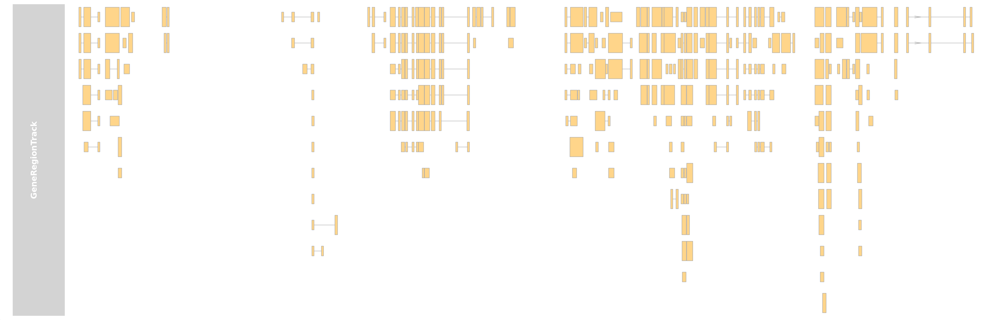

In [10]:
options(repr.plot.width=25, repr.plot.height=8)
feature(txTr)
plotTracks(txTr)

## compare single TF's regulatees of TRM and TexTerm

In [5]:
setwd("../regulatees/")
library(dplyr)



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [12]:
read_regulatees <- function(TF){
    fl1 <- paste0(TF,"_texterm_regulatees.tsv")
    fl2 <- paste0(TF,"_trm_regulatees.tsv")
    dt <- read.table(fl1, header=T) %>% .$`X.END_ID` %>% unique
    dt2 <- read.table(fl2, header=T) %>% .$`X.END_ID` %>% unique
    
    df <- list(dt,dt2)
    names(df) <- c("TexTerm","TRM")
    return(df)
}

In [22]:
TF <- "NFIL3"
df <- read_regulatees(TF)

In [29]:
runVenn <- function(df, fl, label=F){
  
  myCol <- brewer.pal(3, "Pastel2")
  if (label){
        v <- venn.diagram(df,
                    filename = NULL,
                    hyper.test = TRUE,
                    # circles
                    fill = myCol[1:length(df)], lwd = 1, lty= "blank",
                    # Numbers
                    cex = 0.8,
                    fontface = "bold",
                    fontfamily = "sans",
                    # set names
                    cat.cex = 2,
                    cat.default.pos = 'outer',
                    cat.fontface = "bold",
                    cat.fontfamily = "sans",
                    cat.just =list(c(0,0) , c(1,0)))
        v[[7]]$label <- paste0(intersect(df[[1]],df[[2]]), collapse = "\n")
#         v[[7]]$label <- gsub("([^ ]+ [^ ]+)  ","\\1\n",intersect(df[[1]],df[[2]]))
        png(fl, units = "in", width=5, height=5, res=300)
        grid.draw(v)
        dev.off()
                          
  }else{
        v <- venn.diagram(df,
                    filename = NULL,
                    hyper.test = TRUE,
                    # circles
                    fill = myCol[1:length(df)], lwd = 1, lty= "blank",
                    # Numbers
                    cex = 2,
                    fontface = "bold",
                    fontfamily = "sans",
                    # set names
                    cat.cex = 2,
                    cat.default.pos = 'outer',
                    cat.fontface = "bold",
                    cat.fontfamily = "sans",
                    cat.just =list(c(0,0) , c(1,0)))
        pdf(fl, width=5, height=5)
        grid.draw(v)
        dev.off()
  }
}

In [30]:
v <- runVenn(df,paste0("venn_",TF,"_regulatees_texterm_trm.pdf"))

# differential ATAC-seq

follow the tutorial https://rockefelleruniversity.github.io/RU_ATAC_Workshop.html#greenleaf-dataset---differential-ATAC-seq.

In [1]:
maindir <- "/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/ATACSeq/"
setwd(maindir)

In [2]:
library(rtracklayer)
library(dplyr)
library(pheatmap)
library(ggplot2)
source("../post-analysis/scripts/function/utils.R")

Loading required package: GenomicRanges

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which.max, which.min


Loading required package: S4Vectors


Attaching package: ‘S4Vectors’


The following objects are masked from ‘package:base’:

    expand.grid, I, unname


Loading required package: IRanges

Loading required package: GenomeInfoDb


Attaching package: ‘dplyr’


The following objects are masked from ‘package:Genom

## get non-redundant set of open chromatin regions from peak files

In [472]:
??reduce

In [37]:
setwd("/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/ATACSeq/Homer/")

In [39]:
peaks <- dir("../Peaks/", pattern = "*.narrowPeak", full.names = TRUE)
writeLines(peaks, "peak_files.txt")

gsub("_ATAC.*","",gsub(".*Peaks//","",peaks)) %>% writeLines("samples.txt")

In [50]:
## get non-overlapping set of open chromatin regions
peaks <- dir("./Peaks/", pattern = "*.narrowPeak", full.names = TRUE)
myPeaks <- lapply(peaks, ChIPQC:::GetGRanges, simple = TRUE)

names(myPeaks) <- gsub("_ATAC.*","",gsub(".*Peaks//","",peaks))
Group <- factor(gsub("_.*","",names(myPeaks)))

we want to convert Granges list of peaks into consensus counts. However the original function in the tutorial soGGi::runConsensusRegions didn't work. So we used an alternative way. See the details in https://www.biostars.org/p/392637/

In [89]:
myGRangesList<- GRangesList(myPeaks)   
reduced <- reduce(unlist(myGRangesList))
consensusIDs <- paste0("consensus_", seq(1, length(reduced)))
mcols(reduced) <- do.call(cbind, lapply(myGRangesList, function(x) (reduced %over% x) + 0))
reducedConsensus <- reduced
mcols(reducedConsensus) <- cbind(as.data.frame(mcols(reducedConsensus)), consensusIDs)
consensusIDs <- paste0("consensus_", seq(1, length(reducedConsensus)))
consensusToCount <- reducedConsensus

In [90]:
blklist <- import.bed("mm10.blacklist.bed.gz")
consensusToCount <- consensusToCount[!consensusToCount %over% blklist & !seqnames(consensusToCount) %in% "chrM"]
consensusToCount

GRanges object with 216905 ranges and 45 metadata columns:
                       seqnames          ranges strand | MP_Kaech_1 MP_Kaech_2
                          <Rle>       <IRanges>  <Rle> |  <numeric>  <numeric>
       [1]                 chr1 3264274-3264552      * |          0          0
       [2]                 chr1 3286591-3286960      * |          0          0
       [3]                 chr1 3326423-3326670      * |          0          0
       [4]                 chr1 3335379-3335649      * |          0          0
       [5]                 chr1 3505298-3505572      * |          0          0
       ...                  ...             ...    ... .        ...        ...
  [216901] chr1_GL456212_random   100884-101497      * |          0          0
  [216902] chr1_GL456212_random   150533-150733      * |          0          0
  [216903] chr1_GL456212_random   151418-151730      * |          0          0
  [216904] chr1_GL456221_random   102613-102858      * |          0     

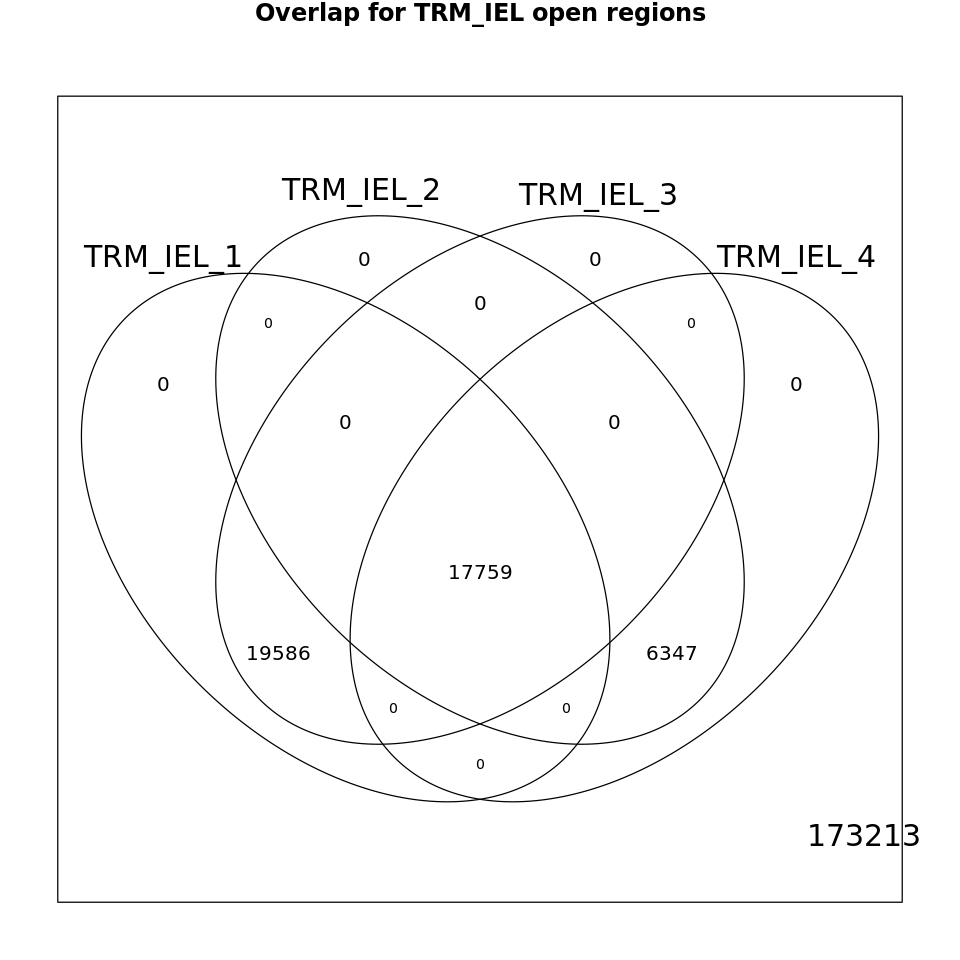

In [102]:
## overlap of open regions among replicates
options(repr.plot.width=8, repr.plot.height=8)
library(limma)
q <- "TRM_IEL"
as.data.frame(elementMetadata(consensusToCount)) %>% dplyr::select(starts_with(q)) %>% 
    vennDiagram(main = paste0("Overlap for ",q," open regions"))

In [5]:
## PCA of overlaps (occupancy analysis)
library(tidyr)
library(ggplot2)


Attaching package: ‘tidyr’


The following object is masked from ‘package:S4Vectors’:

    expand


The following object is masked from ‘package:magrittr’:

    extract




In [110]:
label.color <- c("#A6A6A6", "#FF0000", "#0007F4", "#FFA75C", "#00AAFE", "#009051", "#FEB5B5", "#E6CFFF", "#8AAA75")
mydata <- as.data.frame(elementMetadata(consensusToCount)) %>% dplyr::select(-consensusIDs) %>% 
    as.matrix %>% t %>% prcomp %>% .$x %>% data.frame %>% mutate(Samples = rownames(.)) %>% 
    mutate(Group = gsub("\\d","",gsub("_.*", "", Samples)))

In [342]:
head(mydata)
dim(mydata)

,MP_MilnerAug_Kaech_ATAC_rep1,MP_MilnerAug_Kaech_ATAC_rep2,MP_MilnerAug_Kaech_ATAC_rep3,TE_MilnerAug_Kaech_ATAC_rep1,TE_MilnerAug_Kaech_ATAC_rep2,TE_MilnerAug_Kaech_ATAC_rep3,TRM_IEL_3_ATAC_rep1,TRM_IEL_3_ATAC_rep2,MP_Kaech_Scott_ATAC_rep1,MP_Kaech_Scott_ATAC_rep2,⋯,TexProg_Hudson_Beltra_ATAC_rep2,TexProg_Hudson_Beltra_ATAC_rep3,TexProg_Hudson_Beltra_ATAC_rep4,TexProg_Hudson_Beltra_ATAC_rep5,TexTerm_Beltra_Chung_ATAC_rep1,TexTerm_Beltra_Chung_ATAC_rep2,TexTerm_Hudson_Beltra_ATAC_rep1,TexTerm_Hudson_Beltra_ATAC_rep2,TexTerm_Hudson_Beltra_ATAC_rep3,TRM_IEL_4_ATAC_rep1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ID_chr1_3505298_3505572,0.0,0.1428571,0.0,0.1428571,0.00,0.0,0.5714286,0.4285714,0.1428571,0.5714286,⋯,0.0,0.1428571,0.1428571,0.00,0.1428571,0.5714286,0.2857143,0.0,0.1428571,0.1428571
ID_chr1_3633064_3633264,0.2,0.2000000,0.0,0.2000000,0.20,0.0,0.0000000,0.0000000,0.2000000,0.4000000,⋯,0.4,0.0000000,0.0000000,0.00,0.4000000,0.0000000,0.0000000,0.0,0.0000000,0.0000000
ID_chr1_3691415_3691740,0.0,0.2000000,0.1,0.5000000,0.30,0.0,0.5000000,0.2000000,0.2000000,0.0000000,⋯,0.0,0.2000000,0.3000000,0.10,1.0000000,0.8000000,0.2000000,0.0,0.2000000,0.2000000
ID_chr1_3754397_3754762,0.2,0.6000000,0.0,0.6000000,0.20,0.0,1.0000000,0.8000000,0.4000000,0.2000000,⋯,0.0,0.0000000,0.0000000,0.00,1.0000000,0.2000000,0.4000000,0.0,0.0000000,0.2000000
ID_chr1_3852337_3852939,0.1,0.3000000,0.1,0.4000000,0.10,0.1,0.6000000,0.1000000,0.4000000,0.0000000,⋯,0.0,0.4000000,0.3000000,0.00,1.0000000,0.9000000,0.3000000,0.3,0.0000000,0.3000000
ID_chr1_3892151_3892356,0.0,0.2500000,0.0,0.2500000,0.25,0.0,0.5000000,0.7500000,0.0000000,0.5000000,⋯,0.0,0.5000000,0.0000000,0.25,0.7500000,1.0000000,0.0000000,0.0,0.0000000,0.2500000


[1] 171401     32

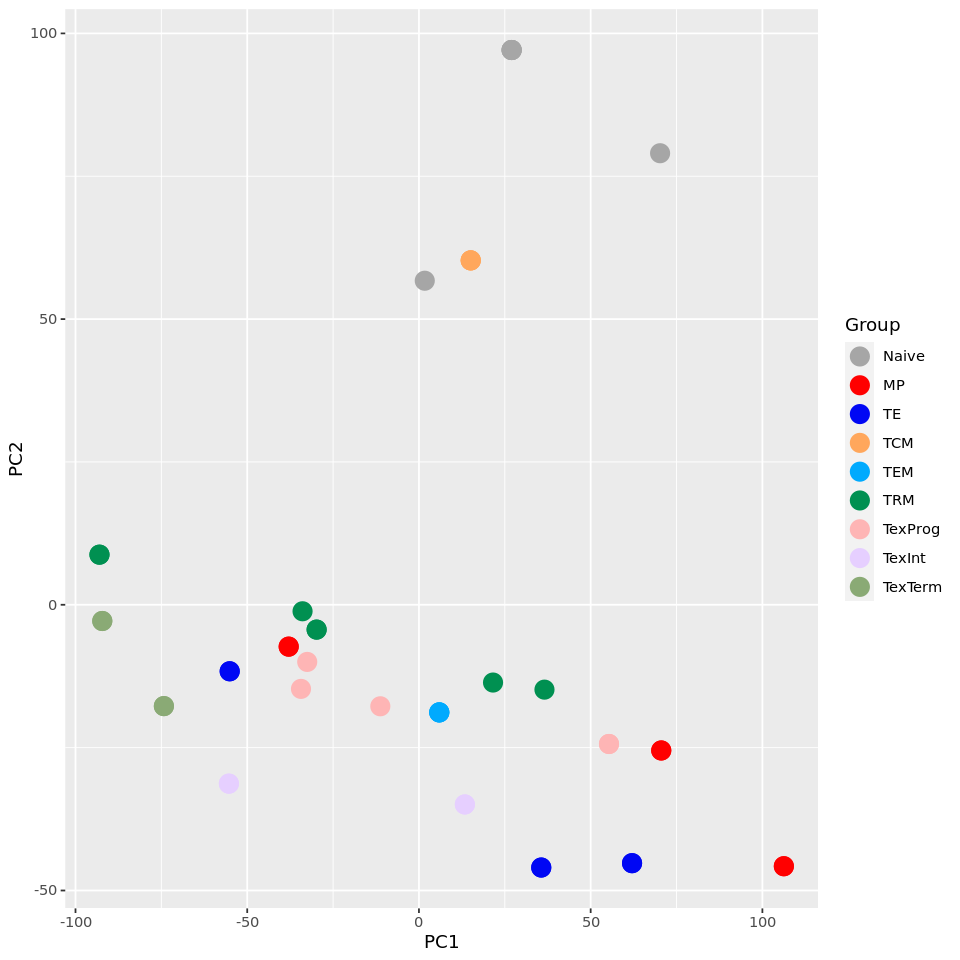

In [113]:
mydata$Group <- factor(mydata$Group, levels = c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm"))
myPlot <- ggplot(mydata, aes(x = PC1, y = PC2, colour = Group)) + geom_point(size = 5) + scale_color_manual(values = label.color)
myPlot

In [6]:
## counting for differential ATAC-seq
library(Rsubread)
occurrences <- elementMetadata(consensusToCount) %>% as.data.frame %>% dplyr::select(-consensusIDs) %>% rowSums

table(occurrences) %>% rev %>% cumsum

ERROR: Error in library(Rsubread): there is no package called ‘Rsubread’


In [128]:
### keep only peaks which are present in at least two replicates
consensusToCount <- consensusToCount[occurrences >= 2, ]

consensusToCount

GRanges object with 171401 ranges and 45 metadata columns:
                       seqnames          ranges strand | MP_Kaech_1 MP_Kaech_2
                          <Rle>       <IRanges>  <Rle> |  <numeric>  <numeric>
       [1]                 chr1 3505298-3505572      * |          0          0
       [2]                 chr1 3633064-3633264      * |          0          0
       [3]                 chr1 3691415-3691740      * |          0          0
       [4]                 chr1 3754397-3754762      * |          0          0
       [5]                 chr1 3852337-3852939      * |          0          0
       ...                  ...             ...    ... .        ...        ...
  [171397] chr1_GL456212_random     73564-73880      * |          0          0
  [171398] chr1_GL456212_random   100884-101497      * |          0          0
  [171399] chr1_GL456212_random   151418-151730      * |          0          0
  [171400] chr1_GL456221_random   102613-102858      * |          0     

In [213]:
save(consensusToCount, file = "consensusToCount.RData")

## count reads in consensus peaks

In [239]:
### use Rsubread to count paired reads landing in consensus peaks
### this step takes 1hr for 44 samples
setwd("~/Taiji/mouse_immune/mouse11/output/ATACSeq")
rawBam <- dir("./Bam", full.names = TRUE, pattern = "*.filt_dedup\\.bam$")
duplicate <- c("./Bam/MP_Milner_2_ATAC_rep1_filt_dedup.bam","./Bam/MP_Milner_2_ATAC_rep2_filt_dedup.bam",
               "./Bam/TE_Milner_2_ATAC_rep1_filt_dedup.bam","./Bam/TE_Milner_2_ATAC_rep2_filt_dedup.bam",
               "./Bam/TCM_Milner_ATAC_rep1_filt_dedup.bam","./Bam/TCM_Milner_ATAC_rep2_filt_dedup.bam",
               "./Bam/TCM_Renkema_ATAC_rep1_filt_dedup.bam","./Bam/TCM_Renkema_ATAC_rep2_filt_dedup.bam",
               "./Bam/TEM_Milner_ATAC_rep1_filt_dedup.bam","./Bam/TEM_Milner_ATAC_rep2_filt_dedup.bam",
               "./Bam/TEM_Renkema_ATAC_rep1_filt_dedup.bam","./Bam/TEM_Renkema_ATAC_rep2_filt_dedup.bam",
               "./Bam/Naive_Milner_ATAC_rep1_filt_dedup.bam","./Bam/Naive_Milner_ATAC_rep2_filt_dedup.bam",
               "./Bam/Naive_Mackay_ATAC_rep1_filt_dedup.bam","./Bam/Naive_Mackay_ATAC_rep2_filt_dedup.bam",
               "./Bam/Naive_Renkema_ATAC_rep1_filt_dedup.bam","./Bam/Naive_Renkema_ATAC_rep2_filt_dedup.bam")
bamsToCount <- setdiff(rawBam, duplicate)

In [294]:
length(bamsToCount)
bamsToCount

[1] 64

[1] "./Bam/MP_Kaech_1_ATAC_rep1_filt_dedup.bam"     
 [2] "./Bam/MP_Kaech_1_ATAC_rep2_filt_dedup.bam"     
 [3] "./Bam/MP_Kaech_1_ATAC_rep3_filt_dedup.bam"     
 [4] "./Bam/MP_Kaech_2_ATAC_rep1_filt_dedup.bam"     
 [5] "./Bam/MP_Kaech_2_ATAC_rep2_filt_dedup.bam"     
 [6] "./Bam/MP_Milner_1_ATAC_rep1_filt_dedup.bam"    
 [7] "./Bam/MP_Milner_1_ATAC_rep2_filt_dedup.bam"    
 [8] "./Bam/MP_Milner_1_ATAC_rep3_filt_dedup.bam"    
 [9] "./Bam/Naive_Kaech_1_ATAC_rep1_filt_dedup.bam"  
[10] "./Bam/Naive_Kaech_1_ATAC_rep2_filt_dedup.bam"  
[11] "./Bam/Naive_Kaech_1_ATAC_rep3_filt_dedup.bam"  
[12] "./Bam/Naive_Kaech_2_ATAC_rep1_filt_dedup.bam"  
[13] "./Bam/Naive_Kaech_2_ATAC_rep2_filt_dedup.bam"  
[14] "./Bam/Naive_Scott_ATAC_rep1_filt_dedup.bam"    
[15] "./Bam/Naive_Scott_ATAC_rep2_filt_dedup.bam"    
[16] "./Bam/Naive_Scott_ATAC_rep3_filt_dedup.bam"    
[17] "./Bam/Naive_Scott_ATAC_rep4_filt_dedup.bam"    
[18] "./Bam/Naive_Scott_ATAC_rep5_filt_dedup.bam"    
[19] "./Bam/TCM_Mackay_ATAC_rep1_filt_dedup.bam"     
[20] "./Bam/TCM_Mackay_ATAC_rep2_filt_dedup.bam"     
[21] "./Bam/TE_Kaech_1_ATAC_rep1_filt_dedup.bam"     
[22] "./Bam/TE_Kaech_1_ATAC_rep2_filt_dedup.bam"     
[23] "./Bam/TE_Kaech_1_ATAC_rep3_filt_dedup.bam"     
[24] "./Bam/TE_Kaech_2_ATAC_rep1_filt_dedup.bam"     
[25] "./Bam/TE_Kaech_2_ATAC_rep2_filt_dedup.bam"     
[26] "./Bam/TE_Milner_1_ATAC_rep1_filt_dedup.bam"    
[27] "./Bam/TE_Milner_1_ATAC_rep2_filt_dedup.bam"    
[28] "./Bam/TE_Milner_1_ATAC_rep3_filt_dedup.bam"    
[29] "./Bam/TEM_Mackay_ATAC_rep1_filt_dedup.bam"     
[30] "./Bam/TEM_Mackay_ATAC_rep2_filt_dedup.bam"     
[31] "./Bam/TexInt_Beltra_ATAC_rep1_filt_dedup.bam"  
[32] "./Bam/TexInt_Beltra_ATAC_rep2_filt_dedup.bam"  
[33] "./Bam/TexInt_Beltra_ATAC_rep3_filt_dedup.bam"  
[34] "./Bam/TexInt_Hudson_ATAC_rep1_filt_dedup.bam"  
[35] "./Bam/TexInt_Hudson_ATAC_rep2_filt_dedup.bam"  
[36] "./Bam/TexProg_Hudson_ATAC_rep1_filt_dedup.bam" 
[37] "./Bam/TexProg_Hudson_ATAC_rep2_filt_dedup.bam" 
[38] "./Bam/TexProg1_Beltra_ATAC_rep1_filt_dedup.bam"
[39] "./Bam/TexProg1_Beltra_ATAC_rep2_filt_dedup.bam"
[40] "./Bam/TexProg2_Beltra_ATAC_rep1_filt_dedup.bam"
[41] "./Bam/TexProg2_Beltra_ATAC_rep2_filt_dedup.bam"
[42] "./Bam/TexProg2_Beltra_ATAC_rep3_filt_dedup.bam"
[43] "./Bam/TexTerm_Beltra_ATAC_rep1_filt_dedup.bam" 
[44] "./Bam/TexTerm_Beltra_ATAC_rep2_filt_dedup.bam" 
[45] "./Bam/TexTerm_Beltra_ATAC_rep3_filt_dedup.bam" 
[46] "./Bam/TexTerm_Hudson_ATAC_rep1_filt_dedup.bam" 
[47] "./Bam/TexTerm_Hudson_ATAC_rep2_filt_dedup.bam" 
[48] "./Bam/TRM_IEL_1_ATAC_rep1_filt_dedup.bam"      
[49] "./Bam/TRM_IEL_1_ATAC_rep2_filt_dedup.bam"      
[50] "./Bam/TRM_IEL_2_ATAC_rep1_filt_dedup.bam"      
[51] "./Bam/TRM_liver_ATAC_rep1_filt_dedup.bam"      
[52] "./Bam/TRM_liver_ATAC_rep2_filt_dedup.bam"      
[53] "./Bam/TRM_lung_A_ATAC_rep1_filt_dedup.bam"     
[54] "./Bam/TRM_lung_A_ATAC_rep2_filt_dedup.bam"     
[55] "./Bam/TRM_lung_A_ATAC_rep3_filt_dedup.bam"     
[56] "./Bam/TRM_lung_A_ATAC_rep4_filt_dedup.bam"     
[57] "./Bam/TRM_lung_A_ATAC_rep5_filt_dedup.bam"     
[58] "./Bam/TRM_lung_A_ATAC_rep6_filt_dedup.bam"     
[59] "./Bam/TRM_lung_I_ATAC_rep1_filt_dedup.bam"     
[60] "./Bam/TRM_lung_I_ATAC_rep2_filt_dedup.bam"     
[61] "./Bam/TRM_lung_I_ATAC_rep3_filt_dedup.bam"     
[62] "./Bam/TRM_lung_I_ATAC_rep4_filt_dedup.bam"     
[63] "./Bam/TRM_lung_I_ATAC_rep5_filt_dedup.bam"     
[64] "./Bam/TRM_lung_I_ATAC_rep6_filt_dedup.bam"

In [241]:
### some bams are pair-end and some are single-end
bamsToCount_single <- c("./Bam/MP_Kaech_1_ATAC_rep1_filt_dedup.bam","./Bam/MP_Kaech_1_ATAC_rep2_filt_dedup.bam","./Bam/MP_Kaech_1_ATAC_rep3_filt_dedup.bam",
                        "./Bam/TE_Kaech_1_ATAC_rep1_filt_dedup.bam","./Bam/TE_Kaech_1_ATAC_rep2_filt_dedup.bam","./Bam/TE_Kaech_1_ATAC_rep3_filt_dedup.bam",
                        "./Bam/Naive_Kaech_1_ATAC_rep1_filt_dedup.bam","./Bam/Naive_Kaech_1_ATAC_rep2_filt_dedup.bam","./Bam/Naive_Kaech_1_ATAC_rep3_filt_dedup.bam",
                        "./Bam/TRM_IEL_1_ATAC_rep1_filt_dedup.bam","./Bam/TRM_IEL_1_ATAC_rep2_filt_dedup.bam")
bamsToCount_paired <- setdiff(bamsToCount, bamsToCount_single)

In [242]:
length(bamsToCount_paired)

[1] 53

In [243]:
# indexBam(bamsToCount)
regionsToCount <- data.frame(GeneID = paste("ID", seqnames(consensusToCount), 
    start(consensusToCount), end(consensusToCount), sep = "_"), Chr = seqnames(consensusToCount), 
    Start = start(consensusToCount), End = end(consensusToCount), Strand = strand(consensusToCount))
fcResults <- featureCounts(bamsToCount_single, annot.ext = regionsToCount, isPairedEnd = FALSE, 
    countMultiMappingReads = FALSE)
myCounts1 <- fcResults$counts

fcResults2 <- featureCounts(bamsToCount_paired, annot.ext = regionsToCount, isPairedEnd = TRUE, 
    countMultiMappingReads = FALSE, maxFragLength = 500)
myCounts2 <- fcResults2$counts


        ==========     _____ _    _ ____  _____  ______          _____  
        =====         / ____| |  | |  _ \|  __ \|  ____|   /\   |  __ \ 
          =====      | (___ | |  | | |_) | |__) | |__     /  \  | |  | |
            ====      \___ \| |  | |  _ <|  _  /|  __|   / /\ \ | |  | |
              ====    ____) | |__| | |_) | | \ \| |____ / ____ \| |__| |
        ==========   |_____/ \____/|____/|_|  \_\______/_/    \_\_____/
       Rsubread 2.8.2

//========================== featureCounts setting ===========================\\
||                                                                            ||
||             Input files : 11 BAM files                                     ||
||                                                                            ||
||                           MP_Kaech_1_ATAC_rep1_filt_dedup.bam              ||
||                           MP_Kaech_1_ATAC_rep2_filt_dedup.bam              ||
||                           MP_Kaech_1_ATAC_rep3_fil

In [244]:
myCounts <- cbind(myCounts1, myCounts2)
colnames(myCounts) <- gsub("_filt.*","",colnames(myCounts))


In [248]:
colnames(myCounts)

[1] "MP_Kaech_1_ATAC_rep1"      "MP_Kaech_1_ATAC_rep2"     
 [3] "MP_Kaech_1_ATAC_rep3"      "TE_Kaech_1_ATAC_rep1"     
 [5] "TE_Kaech_1_ATAC_rep2"      "TE_Kaech_1_ATAC_rep3"     
 [7] "Naive_Kaech_1_ATAC_rep1"   "Naive_Kaech_1_ATAC_rep2"  
 [9] "Naive_Kaech_1_ATAC_rep3"   "TRM_IEL_1_ATAC_rep1"      
[11] "TRM_IEL_1_ATAC_rep2"       "MP_Kaech_2_ATAC_rep1"     
[13] "MP_Kaech_2_ATAC_rep2"      "MP_Milner_1_ATAC_rep1"    
[15] "MP_Milner_1_ATAC_rep2"     "MP_Milner_1_ATAC_rep3"    
[17] "Naive_Kaech_2_ATAC_rep1"   "Naive_Kaech_2_ATAC_rep2"  
[19] "Naive_Scott_ATAC_rep1"     "Naive_Scott_ATAC_rep2"    
[21] "Naive_Scott_ATAC_rep3"     "Naive_Scott_ATAC_rep4"    
[23] "Naive_Scott_ATAC_rep5"     "TCM_Mackay_ATAC_rep1"     
[25] "TCM_Mackay_ATAC_rep2"      "TE_Kaech_2_ATAC_rep1"     
[27] "TE_Kaech_2_ATAC_rep2"      "TE_Milner_1_ATAC_rep1"    
[29] "TE_Milner_1_ATAC_rep2"     "TE_Milner_1_ATAC_rep3"    
[31] "TEM_Mackay_ATAC_rep1"      "TEM_Mackay_ATAC_rep2"     
[33] "TexInt_Beltra_ATAC_rep1"   "TexInt_Beltra_ATAC_rep2"  
[35] "TexInt_Beltra_ATAC_rep3"   "TexInt_Hudson_ATAC_rep1"  
[37] "TexInt_Hudson_ATAC_rep2"   "TexProg_Hudson_ATAC_rep1" 
[39] "TexProg_Hudson_ATAC_rep2"  "TexProg1_Beltra_ATAC_rep1"
[41] "TexProg1_Beltra_ATAC_rep2" "TexProg2_Beltra_ATAC_rep1"
[43] "TexProg2_Beltra_ATAC_rep2" "TexProg2_Beltra_ATAC_rep3"
[45] "TexTerm_Beltra_ATAC_rep1"  "TexTerm_Beltra_ATAC_rep2" 
[47] "TexTerm_Beltra_ATAC_rep3"  "TexTerm_Hudson_ATAC_rep1" 
[49] "TexTerm_Hudson_ATAC_rep2"  "TRM_IEL_2_ATAC_rep1"      
[51] "TRM_liver_ATAC_rep1"       "TRM_liver_ATAC_rep2"      
[53] "TRM_lung_A_ATAC_rep1"      "TRM_lung_A_ATAC_rep2"     
[55] "TRM_lung_A_ATAC_rep3"      "TRM_lung_A_ATAC_rep4"     
[57] "TRM_lung_A_ATAC_rep5"      "TRM_lung_A_ATAC_rep6"     
[59] "TRM_lung_I_ATAC_rep1"      "TRM_lung_I_ATAC_rep2"     
[61] "TRM_lung_I_ATAC_rep3"      "TRM_lung_I_ATAC_rep4"     
[63] "TRM_lung_I_ATAC_rep5"      "TRM_lung_I_ATAC_rep6"

In [249]:
createDir("ATAC_RData")

[1] "/stg2/data1/cong/Taiji/mouse_immune/mouse11_allcombn/output/ATACSeq/ATAC_RData"


In [250]:
save(myCounts, file = "countsFromATAC.RData")
write.csv(myCounts, "countsFromATAC.csv")

In [343]:
ncol(myCounts)

[1] 64

In [252]:
## k-means clustered heatmap of normalized counts at all peaks 
df <- scaleData(as.data.frame(myCounts))

In [253]:
head(df)
dim(df)

,MP_Kaech_1_ATAC_rep1,MP_Kaech_1_ATAC_rep2,MP_Kaech_1_ATAC_rep3,TE_Kaech_1_ATAC_rep1,TE_Kaech_1_ATAC_rep2,TE_Kaech_1_ATAC_rep3,Naive_Kaech_1_ATAC_rep1,Naive_Kaech_1_ATAC_rep2,Naive_Kaech_1_ATAC_rep3,TRM_IEL_1_ATAC_rep1,⋯,TRM_lung_A_ATAC_rep3,TRM_lung_A_ATAC_rep4,TRM_lung_A_ATAC_rep5,TRM_lung_A_ATAC_rep6,TRM_lung_I_ATAC_rep1,TRM_lung_I_ATAC_rep2,TRM_lung_I_ATAC_rep3,TRM_lung_I_ATAC_rep4,TRM_lung_I_ATAC_rep5,TRM_lung_I_ATAC_rep6
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ID_chr1_3505298_3505572,0.00000000,0.1428571,0.00000000,0.1428571,0.00000000,0.00000000,0.14285714,0.1428571,0.8571429,0.5714286,⋯,0.0000000,0.0,0.1428571,0,0.1428571,0.14285714,0,0,0.14285714,0.2857143
ID_chr1_3633064_3633264,0.20000000,0.2000000,0.00000000,0.2000000,0.20000000,0.00000000,0.20000000,0.0000000,0.4000000,0.0000000,⋯,0.0000000,0.0,0.2000000,0,0.0000000,0.00000000,0,0,0.20000000,0.0000000
ID_chr1_3691415_3691740,0.00000000,0.2000000,0.10000000,0.5000000,0.30000000,0.00000000,0.40000000,0.2000000,0.2000000,0.5000000,⋯,0.0000000,0.1,0.1000000,0,0.1000000,0.00000000,0,0,0.10000000,0.0000000
ID_chr1_3754397_3754762,0.11111111,0.3333333,0.00000000,0.3333333,0.11111111,0.00000000,0.11111111,0.2222222,0.2222222,0.5555556,⋯,0.0000000,0.0,0.0000000,0,0.0000000,0.00000000,0,0,0.22222222,0.1111111
ID_chr1_3852337_3852939,0.05882353,0.1764706,0.05882353,0.2352941,0.05882353,0.05882353,0.05882353,0.2941176,0.2352941,0.3529412,⋯,0.1176471,0.0,0.1764706,0,0.4705882,0.05882353,0,0,0.05882353,0.0000000
ID_chr1_3892151_3892356,0.00000000,0.1000000,0.00000000,0.1000000,0.10000000,0.00000000,0.00000000,0.3000000,0.1000000,0.2000000,⋯,0.0000000,0.0,0.1000000,0,0.0000000,0.00000000,0,0,0.00000000,0.0000000


[1] 171401     64

## prepare attribute file for bigwig visualization

In [7]:
### read group file
meta <- read.table("/stg2/data1/cong/Taiji/mouse_immune/mouse11_allcombn/output/group_file_v2.txt")

In [8]:
match(gsub("_ATAC.*","",rownames(info)),rownames(meta))

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'match': error in evaluating the argument 'x' in selecting a method for function 'gsub': error in evaluating the argument 'x' in selecting a method for function 'rownames': object 'info' not found


In [306]:
info <- data.frame(sample = colnames(df),group=gsub("\\d","",gsub("_.*","",colnames(df))), row.names = colnames(df)) %>%
        dplyr::mutate(study=meta[match(gsub("_ATAC.*","",colnames(df)),rownames(meta)),"ATACSource"])
# sort df make sure the order of info and df matched
df <- df[,match(rownames(info),names(df))]
annotation_col = data.frame(
  group = info$group,
  study = info$study
)
rownames(annotation_col) = names(df)

# set palette
n_study = length(unique(info$study))
mycolors <- list(group = label.color, study = RColorBrewer::brewer.pal(n_study,"Set1")[1:n_study])
names(mycolors$group) <- c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm")
names(mycolors$study) <- unique(info$study)

In [285]:
getwd()

[1] "/stg2/data1/cong/Taiji/mouse_immune/mouse11_allcombn/output/ATACSeq/ATAC_RData"

In [286]:
p1 <- pheatmap(df, kmeans_k = 100,
           fontsize = 7, show_rownames = F,
           angle_col = 90, show_colnames = F,
           cellwidth = 5, cellheight = 2,
           clustering_distance_cols = 'correlation', 
           clustering_distance_rows = 'correlation', 
           clustering_method = 'average',
           # treeheight_row = 0, treeheight_col = 0,
           # cutree_rows = 10, cutree_cols = 1,
           annotation_col = annotation_col,
           annotation_colors = mycolors, 
           border_color = NA,
           filename = paste0("hp_","atac",".pdf"))

In [288]:
## calculate scaling factors to better normalize bigwig file
library(edgeR)
NormFactor <- calcNormFactors(myCounts, method = "TMM")
LibSize <- colSums(myCounts)
SizeFactors <- NormFactor * LibSize / 1000000
SizeFactors.reciprocal <- 1/SizeFactors

In [299]:
SizeFactors.reciprocal
write.table(SizeFactors.reciprocal, "size_factors.csv", quote=F, col.names=F, sep = ",")

MP_Kaech_1_ATAC_rep1      MP_Kaech_1_ATAC_rep2      MP_Kaech_1_ATAC_rep3 
                0.7030174                 0.3994344                 0.4623560 
     TE_Kaech_1_ATAC_rep1      TE_Kaech_1_ATAC_rep2      TE_Kaech_1_ATAC_rep3 
                0.4641157                 0.6464724                 0.3345319 
  Naive_Kaech_1_ATAC_rep1   Naive_Kaech_1_ATAC_rep2   Naive_Kaech_1_ATAC_rep3 
                0.3545861                 0.4904392                 0.3247582 
      TRM_IEL_1_ATAC_rep1       TRM_IEL_1_ATAC_rep2      MP_Kaech_2_ATAC_rep1 
                0.3789584                 0.3444692                 0.1620240 
     MP_Kaech_2_ATAC_rep2     MP_Milner_1_ATAC_rep1     MP_Milner_1_ATAC_rep2 
                0.1121929                 0.2083140                 0.1655470 
    MP_Milner_1_ATAC_rep3   Naive_Kaech_2_ATAC_rep1   Naive_Kaech_2_ATAC_rep2 
                0.1789072                 0.4913588                 0.2812087 
    Naive_Scott_ATAC_rep1     Naive_Scott_ATAC_rep2     Naive_Scott_ATAC_rep3 
                0.2020254                 0.2026560                 0.3770240 
    Naive_Scott_ATAC_rep4     Naive_Scott_ATAC_rep5      TCM_Mackay_ATAC_rep1 
                0.1851176                 0.1787592                 0.2227038 
     TCM_Mackay_ATAC_rep2      TE_Kaech_2_ATAC_rep1      TE_Kaech_2_ATAC_rep2 
                0.3075477                 0.1618029                 0.1973882 
    TE_Milner_1_ATAC_rep1     TE_Milner_1_ATAC_rep2     TE_Milner_1_ATAC_rep3 
                0.1909829                 0.1813691                 0.2133374 
     TEM_Mackay_ATAC_rep1      TEM_Mackay_ATAC_rep2   TexInt_Beltra_ATAC_rep1 
                0.2307200                 0.4458620                 0.6411651 
  TexInt_Beltra_ATAC_rep2   TexInt_Beltra_ATAC_rep3   TexInt_Hudson_ATAC_rep1 
                1.8442422                 0.7197332                 0.2579989 
  TexInt_Hudson_ATAC_rep2  TexProg_Hudson_ATAC_rep1  TexProg_Hudson_ATAC_rep2 
                0.2636690                 0.1388880                 0.3210490 
TexProg1_Beltra_ATAC_rep1 TexProg1_Beltra_ATAC_rep2 TexProg2_Beltra_ATAC_rep1 
                0.6201369                 1.7212269                 0.4936392 
TexProg2_Beltra_ATAC_rep2 TexProg2_Beltra_ATAC_rep3  TexTerm_Beltra_ATAC_rep1 
                0.7925021                 1.3904018                 1.0274580 
 TexTerm_Beltra_ATAC_rep2  TexTerm_Beltra_ATAC_rep3  TexTerm_Hudson_ATAC_rep1 
                1.3963302                 1.2335641                 0.3811168 
 TexTerm_Hudson_ATAC_rep2       TRM_IEL_2_ATAC_rep1       TRM_liver_ATAC_rep1 
                0.3394814                 0.6377363                 0.3655437 
      TRM_liver_ATAC_rep2      TRM_lung_A_ATAC_rep1      TRM_lung_A_ATAC_rep2 
                0.3945882                 0.2555961                 0.5311575 
     TRM_lung_A_ATAC_rep3      TRM_lung_A_ATAC_rep4      TRM_lung_A_ATAC_rep5 
                0.2851157                 0.5175270                 0.2543070 
     TRM_lung_A_ATAC_rep6      TRM_lung_I_ATAC_rep1      TRM_lung_I_ATAC_rep2 
                0.5568459                 0.6733215                 1.5391393 
     TRM_lung_I_ATAC_rep3      TRM_lung_I_ATAC_rep4      TRM_lung_I_ATAC_rep5 
                0.4251127                 1.5263097                 0.1777760 
     TRM_lung_I_ATAC_rep6 
                0.3997837

In [307]:
## write track attribute file
info$sample <- paste0(info$sample,".TMM.bw")
info$sample2 <- gsub("_ATAC.*","",rownames(info))

,sample,group,study,sample2
,<chr>,<chr>,<chr>,<chr>
MP_Kaech_1_ATAC_rep1,MP_Kaech_1_ATAC_rep1.TMM.bw,MP,Kaech,MP_Kaech_1
MP_Kaech_1_ATAC_rep2,MP_Kaech_1_ATAC_rep2.TMM.bw,MP,Kaech,MP_Kaech_1
MP_Kaech_1_ATAC_rep3,MP_Kaech_1_ATAC_rep3.TMM.bw,MP,Kaech,MP_Kaech_1
TE_Kaech_1_ATAC_rep1,TE_Kaech_1_ATAC_rep1.TMM.bw,TE,Kaech,TE_Kaech_1
TE_Kaech_1_ATAC_rep2,TE_Kaech_1_ATAC_rep2.TMM.bw,TE,Kaech,TE_Kaech_1
TE_Kaech_1_ATAC_rep3,TE_Kaech_1_ATAC_rep3.TMM.bw,TE,Kaech,TE_Kaech_1
Naive_Kaech_1_ATAC_rep1,Naive_Kaech_1_ATAC_rep1.TMM.bw,Naive,Kaech,Naive_Kaech_1
Naive_Kaech_1_ATAC_rep2,Naive_Kaech_1_ATAC_rep2.TMM.bw,Naive,Kaech,Naive_Kaech_1
Naive_Kaech_1_ATAC_rep3,Naive_Kaech_1_ATAC_rep3.TMM.bw,Naive,Kaech,Naive_Kaech_1


In [336]:
sort(sprintf("T_%03d", 1:nrow(info)))

[1] "T_001" "T_002" "T_003" "T_004" "T_005" "T_006" "T_007" "T_008" "T_009"
[10] "T_010" "T_011" "T_012" "T_013" "T_014" "T_015" "T_016" "T_017" "T_018"
[19] "T_019" "T_020" "T_021" "T_022" "T_023" "T_024" "T_025" "T_026" "T_027"
[28] "T_028" "T_029" "T_030" "T_031" "T_032" "T_033" "T_034" "T_035" "T_036"
[37] "T_037" "T_038" "T_039" "T_040" "T_041" "T_042" "T_043" "T_044" "T_045"
[46] "T_046" "T_047" "T_048" "T_049" "T_050" "T_051" "T_052" "T_053" "T_054"
[55] "T_055" "T_056" "T_057" "T_058" "T_059" "T_060" "T_061" "T_062" "T_063"
[64] "T_064"

In [337]:
# customize column order
info$group <- factor(info$group, levels = c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm"))
info <- info[order(info$group),]
info$order <- sprintf("T_%03d", 1:nrow(info))

info

,sample,group,study,sample2,order
,<chr>,<fct>,<chr>,<chr>,<chr>
Naive_Kaech_1_ATAC_rep1,Naive_Kaech_1_ATAC_rep1.TMM.bw,Naive,Kaech,Naive_Kaech_1,T_001
Naive_Kaech_1_ATAC_rep2,Naive_Kaech_1_ATAC_rep2.TMM.bw,Naive,Kaech,Naive_Kaech_1,T_002
Naive_Kaech_1_ATAC_rep3,Naive_Kaech_1_ATAC_rep3.TMM.bw,Naive,Kaech,Naive_Kaech_1,T_003
Naive_Kaech_2_ATAC_rep1,Naive_Kaech_2_ATAC_rep1.TMM.bw,Naive,Chung,Naive_Kaech_2,T_004
Naive_Kaech_2_ATAC_rep2,Naive_Kaech_2_ATAC_rep2.TMM.bw,Naive,Chung,Naive_Kaech_2,T_005
Naive_Scott_ATAC_rep1,Naive_Scott_ATAC_rep1.TMM.bw,Naive,Scott,Naive_Scott,T_006
Naive_Scott_ATAC_rep2,Naive_Scott_ATAC_rep2.TMM.bw,Naive,Scott,Naive_Scott,T_007
Naive_Scott_ATAC_rep3,Naive_Scott_ATAC_rep3.TMM.bw,Naive,Scott,Naive_Scott,T_008
Naive_Scott_ATAC_rep4,Naive_Scott_ATAC_rep4.TMM.bw,Naive,Scott,Naive_Scott,T_009


In [338]:
write.table(info, "sample_info.txt", row.names = F, sep = "\t", quote = F)

In [339]:
color <- as.data.frame(t(col2rgb(mycolors$group)))
color$attr <- "group"
color$value <- rownames(color)
color$rgb <- paste0(color$red,",",color$green,",",color$blue)

color

,red,green,blue,attr,value,rgb
,<int>,<int>,<int>,<chr>,<chr>,<chr>
Naive,166,166,166,group,Naive,"166,166,166"
MP,255,0,0,group,MP,"255,0,0"
TE,0,7,244,group,TE,"0,7,244"
TCM,255,167,92,group,TCM,"255,167,92"
TEM,0,170,254,group,TEM,"0,170,254"
TRM,0,144,81,group,TRM,"0,144,81"
TexProg,254,181,181,group,TexProg,"254,181,181"
TexInt,230,207,255,group,TexInt,"230,207,255"
TexTerm,138,170,117,group,TexTerm,"138,170,117"


In [340]:
write("\n#colors",file="sample_info.txt",append=TRUE)
write.table(color[,4:6], "sample_info.txt", row.names = F, col.names = F, sep = "\t", quote = F, append = T)

In [325]:
print(mycolors$group)

    Naive        MP        TE       TCM       TEM       TRM   TexProg    TexInt 
"#A6A6A6" "#FF0000" "#0007F4" "#FFA75C" "#00AAFE" "#009051" "#FEB5B5" "#E6CFFF" 
  TexTerm 
"#8AAA75" 


## batch-effect correction using DESeq2

In [410]:
head(info)
dim(info)

,sample,group,study,sample2,order
,<chr>,<fct>,<chr>,<chr>,<chr>
Naive_Kaech_1_ATAC_rep1,Naive_Kaech_1_ATAC_rep1.TMM.bw,Naive,Kaech,Naive_Kaech_1,T_001
Naive_Kaech_1_ATAC_rep2,Naive_Kaech_1_ATAC_rep2.TMM.bw,Naive,Kaech,Naive_Kaech_1,T_002
Naive_Kaech_1_ATAC_rep3,Naive_Kaech_1_ATAC_rep3.TMM.bw,Naive,Kaech,Naive_Kaech_1,T_003
Naive_Kaech_2_ATAC_rep1,Naive_Kaech_2_ATAC_rep1.TMM.bw,Naive,Chung,Naive_Kaech_2,T_004
Naive_Kaech_2_ATAC_rep2,Naive_Kaech_2_ATAC_rep2.TMM.bw,Naive,Chung,Naive_Kaech_2,T_005
Naive_Scott_ATAC_rep1,Naive_Scott_ATAC_rep1.TMM.bw,Naive,Scott,Naive_Scott,T_006


[1] 64  5

In [411]:
head(myCounts)
dim(myCounts)

,MP_Kaech_1_ATAC_rep1,MP_Kaech_1_ATAC_rep2,MP_Kaech_1_ATAC_rep3,TE_Kaech_1_ATAC_rep1,TE_Kaech_1_ATAC_rep2,TE_Kaech_1_ATAC_rep3,Naive_Kaech_1_ATAC_rep1,Naive_Kaech_1_ATAC_rep2,Naive_Kaech_1_ATAC_rep3,TRM_IEL_1_ATAC_rep1,⋯,TRM_lung_A_ATAC_rep3,TRM_lung_A_ATAC_rep4,TRM_lung_A_ATAC_rep5,TRM_lung_A_ATAC_rep6,TRM_lung_I_ATAC_rep1,TRM_lung_I_ATAC_rep2,TRM_lung_I_ATAC_rep3,TRM_lung_I_ATAC_rep4,TRM_lung_I_ATAC_rep5,TRM_lung_I_ATAC_rep6
ID_chr1_3505298_3505572,0,1,0,1,0,0,1,1,6,4,⋯,0,0,1,0,1,1,0,0,1,2
ID_chr1_3633064_3633264,1,1,0,1,1,0,1,0,2,0,⋯,0,0,1,0,0,0,0,0,1,0
ID_chr1_3691415_3691740,0,2,1,5,3,0,4,2,2,5,⋯,0,1,1,0,1,0,0,0,1,0
ID_chr1_3754397_3754762,1,3,0,3,1,0,1,2,2,5,⋯,0,0,0,0,0,0,0,0,2,1
ID_chr1_3852337_3852939,1,3,1,4,1,1,1,5,4,6,⋯,2,0,3,0,8,1,0,0,1,0
ID_chr1_3892151_3892356,0,1,0,1,1,0,0,3,1,2,⋯,0,0,1,0,0,0,0,0,0,0


[1] 171401     64

In [417]:
library(DESeq2)
# make the countData and colData the same order
counts <- myCounts[,match(rownames(info), colnames(myCounts))]

# set up DESeq object
dds <- DESeqDataSetFromMatrix(countData=counts, colData=info, design = ~ study + group)

# standard DESeq2 process
dds <- DESeq(dds)
vsd <- vst(dds, blind=FALSE)
mat <- assay(vsd)

# remove batch effect for downstream analysis
mat <- limma::removeBatchEffect(mat, vsd$study)
assay(vsd) <- mat
counts_batch_corrected <- assay(vsd)
### takes 30min for 64 samples

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

-- replacing outliers and refitting for 1 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



In [480]:
write.csv(counts_batch_corrected, "countsFromATAC_batch_corrected.csv")

In [3]:
getwd()

[1] "/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/ATACSeq"

In [487]:
write.csv(counts_batch_corrected[,rownames(info)[info$study=="Chung"]], "ATAC_RData/countsFromATAC_batch_corrected_Chung.csv")

In [428]:
vsd@colData

DataFrame with 64 rows and 7 columns
                                         sample    group    study
                                    <character> <factor> <factor>
Naive_Kaech_1_ATAC_rep1  Naive_Kaech_1_ATAC_r..    Naive    Kaech
Naive_Kaech_1_ATAC_rep2  Naive_Kaech_1_ATAC_r..    Naive    Kaech
Naive_Kaech_1_ATAC_rep3  Naive_Kaech_1_ATAC_r..    Naive    Kaech
Naive_Kaech_2_ATAC_rep1  Naive_Kaech_2_ATAC_r..    Naive    Chung
Naive_Kaech_2_ATAC_rep2  Naive_Kaech_2_ATAC_r..    Naive    Chung
...                                         ...      ...      ...
TexTerm_Beltra_ATAC_rep1 TexTerm_Beltra_ATAC_..  TexTerm   Beltra
TexTerm_Beltra_ATAC_rep2 TexTerm_Beltra_ATAC_..  TexTerm   Beltra
TexTerm_Beltra_ATAC_rep3 TexTerm_Beltra_ATAC_..  TexTerm   Beltra
TexTerm_Hudson_ATAC_rep1 TexTerm_Hudson_ATAC_..  TexTerm   Chung 
TexTerm_Hudson_ATAC_rep2 TexTerm_Hudson_ATAC_..  TexTerm   Chung 
                                sample2       order sizeFactor replaceable
                            <c

In [433]:
### save size factor after batch normalization
tmp <- as.data.frame(vsd@colData[,c("sample","sizeFactor")]) %>% dplyr::mutate(sizeFactor = 1/sizeFactor) %>%
        dplyr::mutate(sample = rownames(.))
write.table(tmp, "size_factor_batch_corrected.csv", row.names = F, quote = F, col.names = F, sep = ",")

In [440]:
### save info after batch normalization
info$sample <- paste0(rownames(info),".TMM.batchCorrected.bw")
write.table(info, "sample_info_batchCorrected.txt", row.names = F, sep = "\t", quote = F)
write("\n#colors",file="sample_info_batchCorrected.txt",append=TRUE)
write.table(color[,4:6], "sample_info_batchCorrected.txt", row.names = F, col.names = F, sep = "\t", quote = F, append = T)

In [418]:
head(counts_batch_corrected)
dim(counts_batch_corrected)

,Naive_Kaech_1_ATAC_rep1,Naive_Kaech_1_ATAC_rep2,Naive_Kaech_1_ATAC_rep3,Naive_Kaech_2_ATAC_rep1,Naive_Kaech_2_ATAC_rep2,Naive_Scott_ATAC_rep1,Naive_Scott_ATAC_rep2,Naive_Scott_ATAC_rep3,Naive_Scott_ATAC_rep4,Naive_Scott_ATAC_rep5,⋯,TexInt_Beltra_ATAC_rep1,TexInt_Beltra_ATAC_rep2,TexInt_Beltra_ATAC_rep3,TexInt_Hudson_ATAC_rep1,TexInt_Hudson_ATAC_rep2,TexTerm_Beltra_ATAC_rep1,TexTerm_Beltra_ATAC_rep2,TexTerm_Beltra_ATAC_rep3,TexTerm_Hudson_ATAC_rep1,TexTerm_Hudson_ATAC_rep2
ID_chr1_3505298_3505572,4.924842,5.022926,5.296039,5.183807,4.610469,5.001607,4.865408,4.675090,5.044507,4.931124,⋯,5.537424,5.185969,5.049722,4.610469,4.790706,5.279753,4.440104,5.073558,4.970856,5.315795
ID_chr1_3633064_3633264,4.718510,4.442006,4.818040,4.558142,4.766143,4.558776,4.749094,4.851170,4.743863,4.739938,⋯,5.443675,4.510126,4.510126,4.558142,4.738379,4.510126,4.510126,4.510126,5.066498,4.558142
ID_chr1_3691415_3691740,5.034141,5.011913,4.859665,5.074051,4.500714,4.865147,4.945320,4.968758,4.937938,4.989736,⋯,4.962801,4.539503,4.539503,4.500714,4.500714,5.379153,4.539503,5.428428,5.615389,5.488738
ID_chr1_3754397_3754762,4.779437,5.031214,4.878966,4.918074,4.511338,4.804886,4.806421,4.908497,4.936246,4.977718,⋯,5.270683,4.674158,5.418083,4.691113,4.511338,5.513808,4.674158,4.674158,5.309082,4.866626
ID_chr1_3852337_3852939,4.800027,5.352051,5.053831,5.233333,4.842606,5.051771,5.054821,5.324442,5.126838,5.185087,⋯,5.387418,4.549605,4.549605,4.607450,4.682403,5.571067,5.717016,4.549605,5.542350,5.473202
ID_chr1_3892151_3892356,4.558316,5.203557,4.824588,4.472706,4.766611,4.623215,4.892170,4.623215,5.035957,4.936586,⋯,5.228378,4.631853,4.631853,4.472706,4.652943,4.631853,4.631853,4.631853,5.093733,5.178032


[1] 171401     64

## PCA and heatmap plots

In [435]:
# read processed data
counts_batch_corrected <- read.csv("ATAC_RData/countsFromATAC_batch_corrected.csv", row.names = 1)
head(counts_batch_corrected)
dim(counts_batch_corrected)

,Naive_Kaech_1_ATAC_rep1,Naive_Kaech_1_ATAC_rep2,Naive_Kaech_1_ATAC_rep3,Naive_Kaech_2_ATAC_rep1,Naive_Kaech_2_ATAC_rep2,Naive_Scott_ATAC_rep1,Naive_Scott_ATAC_rep2,Naive_Scott_ATAC_rep3,Naive_Scott_ATAC_rep4,Naive_Scott_ATAC_rep5,⋯,TexInt_Beltra_ATAC_rep1,TexInt_Beltra_ATAC_rep2,TexInt_Beltra_ATAC_rep3,TexInt_Hudson_ATAC_rep1,TexInt_Hudson_ATAC_rep2,TexTerm_Beltra_ATAC_rep1,TexTerm_Beltra_ATAC_rep2,TexTerm_Beltra_ATAC_rep3,TexTerm_Hudson_ATAC_rep1,TexTerm_Hudson_ATAC_rep2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ID_chr1_3505298_3505572,4.924842,5.022926,5.296039,5.183807,4.610469,5.001607,4.865408,4.675090,5.044507,4.931124,⋯,5.537424,5.185969,5.049722,4.610469,4.790706,5.279753,4.440104,5.073558,4.970856,5.315795
ID_chr1_3633064_3633264,4.718510,4.442006,4.818040,4.558142,4.766143,4.558776,4.749094,4.851170,4.743863,4.739938,⋯,5.443675,4.510126,4.510126,4.558142,4.738379,4.510126,4.510126,4.510126,5.066498,4.558142
ID_chr1_3691415_3691740,5.034141,5.011913,4.859665,5.074051,4.500714,4.865147,4.945320,4.968758,4.937938,4.989736,⋯,4.962801,4.539503,4.539503,4.500714,4.500714,5.379153,4.539503,5.428428,5.615389,5.488738
ID_chr1_3754397_3754762,4.779437,5.031214,4.878966,4.918074,4.511338,4.804886,4.806421,4.908497,4.936246,4.977718,⋯,5.270683,4.674158,5.418083,4.691113,4.511338,5.513808,4.674158,4.674158,5.309082,4.866626
ID_chr1_3852337_3852939,4.800027,5.352051,5.053831,5.233333,4.842606,5.051771,5.054821,5.324442,5.126838,5.185087,⋯,5.387418,4.549605,4.549605,4.607450,4.682403,5.571067,5.717016,4.549605,5.542350,5.473202
ID_chr1_3892151_3892356,4.558316,5.203557,4.824588,4.472706,4.766611,4.623215,4.892170,4.623215,5.035957,4.936586,⋯,5.228378,4.631853,4.631853,4.472706,4.652943,4.631853,4.631853,4.631853,5.093733,5.178032


[1] 171401     64

In [436]:
meta <- read.table("/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/group_file_v3.txt")
df <- counts_batch_corrected
info <- data.frame(sample = colnames(df),group=gsub("\\d","",gsub("_.*","",colnames(df))), row.names = colnames(df)) %>%
        dplyr::mutate(study=meta[match(gsub("_ATAC.*","",colnames(df)),rownames(meta)),"ATACSource"]) %>%
        na.omit()
# sort df make sure the order of info and data matched
df <- df[,match(rownames(info),names(df))]
annotation_col = data.frame(
  group = info$group,
  study = info$study
)
rownames(annotation_col) = names(df)

# set palette
n_study = length(unique(info$study))
label.color <- c("#A6A6A6", "#FF0000", "#0007F4", "#FFA75C", "#00AAFE", "#009051", "#FEB5B5", "#E6CFFF", "#8AAA75")
mycolors <- list(group = label.color, study = RColorBrewer::brewer.pal(n_study,"Set1")[1:n_study])
names(mycolors$group) <- c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm")
names(mycolors$study) <- unique(info$study)

png 
  2

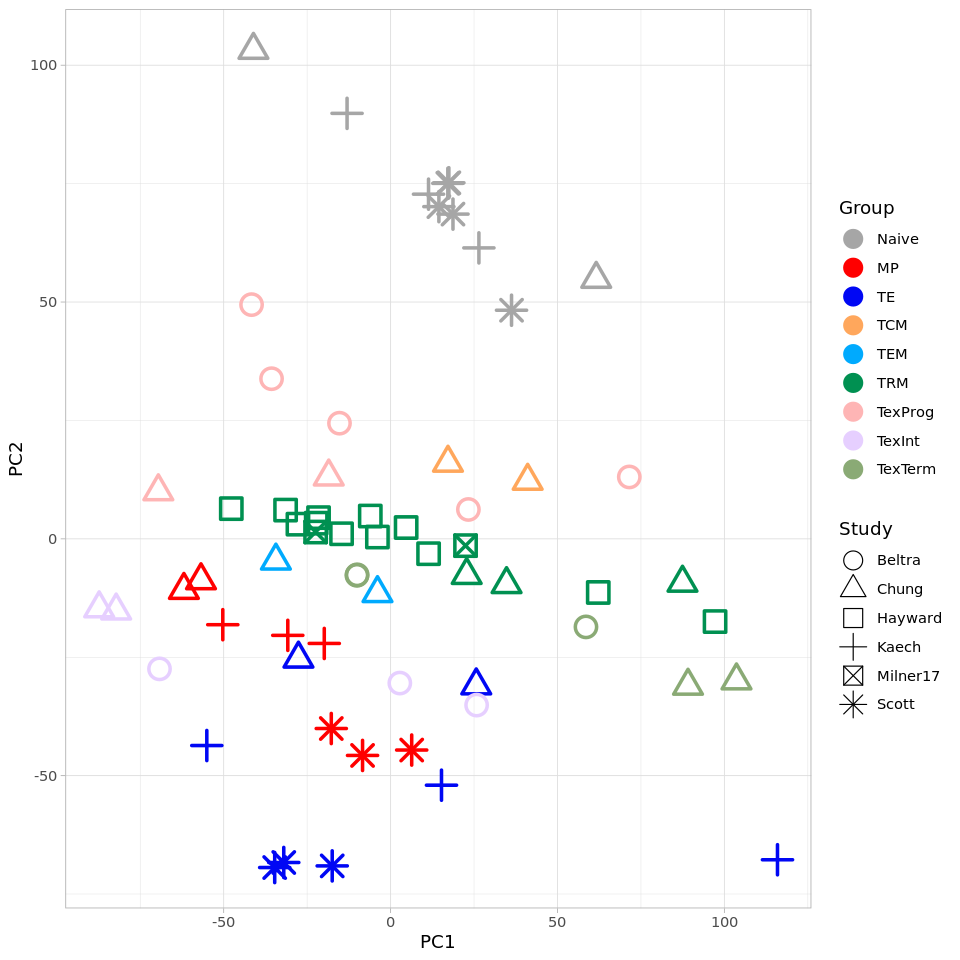

In [421]:
## PCA of library-size normalized ATAC-seq read counts in peaks with batch-effect correction
mydata <- as.data.frame(counts_batch_corrected) %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% data.frame %>% mutate(Samples = rownames(.)) %>% 
    mutate(Group = factor(gsub("\\d","",gsub("_.*", "", Samples)), levels = c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm"))) %>% 
    mutate(Study = info[match(rownames(.), rownames(info)),"study"])

myPlot <- ggplot(mydata, aes(x = PC1, y = PC2, colour = Group, shape=Study, stroke=1.5)) + geom_point(size = 5) + scale_color_manual(values = label.color) + 
        theme_light() + scale_shape(solid = FALSE)
myPlot
pdf("PCA_lib_norm_ATAC_counts_batch_corrected.pdf", width = 8, height = 5)
print(myPlot)
dev.off()

In [23]:
mydata

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC58,PC59,PC60,PC61,PC62,PC63,PC64,Samples,Group,Study
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<chr>
Naive_Kaech_1_ATAC_rep1,-57.823789,1.792001,-14.1778504,0.7147344,-4.5051643,7.4526513,-2.83487155,1.7517706,-4.13404985,2.9199258,⋯,-0.045386731,-9.962864e-14,-7.382983e-15,6.460110e-15,-7.337880e-15,3.337608e-15,-1.040834e-15,Naive_Kaech_1_ATAC_rep1,Naive,Kaech
Naive_Kaech_1_ATAC_rep2,-46.833864,4.949724,-1.9379352,1.0561976,-5.9308616,8.1909247,-0.18600998,-0.4338689,-2.97172781,0.2668915,⋯,0.010898839,-9.465345e-14,-1.075529e-15,1.439474e-14,3.026052e-14,-2.401248e-14,-8.291978e-15,Naive_Kaech_1_ATAC_rep2,Naive,Kaech
Naive_Kaech_1_ATAC_rep3,-51.966491,1.902692,-9.2117716,1.2516396,-4.1593728,8.2994119,-1.63564447,1.2656930,-3.95779866,0.4643210,⋯,0.092775705,-1.044026e-13,-9.985068e-15,-1.186551e-15,-2.066750e-14,2.725598e-14,1.970646e-15,Naive_Kaech_1_ATAC_rep3,Naive,Kaech
Naive_Kaech_2_ATAC_rep1,-53.478135,8.011918,1.0699002,9.3384727,1.6130658,-8.7910153,3.97141659,5.0325290,12.64369983,-5.5224557,⋯,-0.035023435,1.080299e-14,-9.173218e-15,3.919781e-14,-5.003636e-14,-2.491063e-14,1.013946e-15,Naive_Kaech_2_ATAC_rep1,Naive,Chung
Naive_Kaech_2_ATAC_rep2,-67.136994,-2.773384,-26.4218414,6.7173919,3.4760207,-7.7764265,-3.57799542,10.9556019,11.90394315,-2.6574519,⋯,-0.092185159,1.345452e-14,-9.381385e-15,4.967554e-14,-5.434195e-14,-3.493733e-14,-3.971216e-15,Naive_Kaech_2_ATAC_rep2,Naive,Chung
Naive_Scott_ATAC_rep1,-51.725322,1.596648,-4.0047988,1.6674817,-0.2112226,1.7922977,-2.76479126,-4.6429601,-0.94987546,1.3573478,⋯,0.219357579,1.614507e-14,-1.245531e-15,4.916553e-14,9.338363e-14,-3.642052e-14,-1.078304e-14,Naive_Scott_ATAC_rep1,Naive,Scott
Naive_Scott_ATAC_rep2,-51.288158,2.244222,-3.1587467,1.7099060,-0.4519272,1.7359589,-2.55973273,-4.8064997,-0.72998158,1.4169970,⋯,0.251498119,1.260797e-14,-3.035766e-15,4.536302e-14,8.474471e-14,-2.759511e-14,-2.291570e-15,Naive_Scott_ATAC_rep2,Naive,Scott
Naive_Scott_ATAC_rep3,-41.884343,3.743204,1.4671352,1.9516910,-4.0767535,0.9344304,-0.17261951,-3.1051728,-0.08477273,-2.4558056,⋯,-0.201806948,1.333135e-14,-6.175616e-15,3.594347e-14,5.829018e-14,1.783296e-15,-3.691342e-15,Naive_Scott_ATAC_rep3,Naive,Scott
Naive_Scott_ATAC_rep4,-51.564752,4.613555,-6.9733920,0.7466265,-3.5307751,-1.1457382,-1.02665087,-2.2138307,-2.26901503,2.7828947,⋯,-0.207615326,2.470246e-15,-1.242756e-14,2.615529e-14,2.222181e-14,2.389061e-14,5.182486e-15,Naive_Scott_ATAC_rep4,Naive,Scott


Selecting by CV


png 
  2

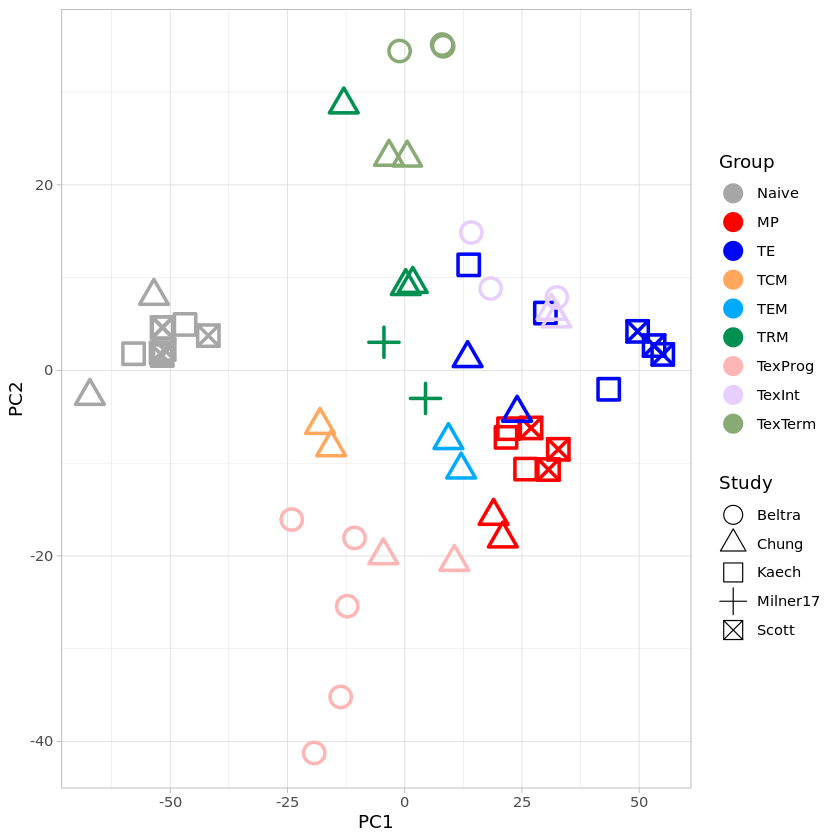

In [5]:
## PCA of library-size normalized ATAC-seq read counts in peaks with batch-effect correction using 10000 most variable peaks 
mydata <- as.data.frame(counts_batch_corrected) %>% 
    dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
    dplyr::top_n(10000) %>%
    dplyr::select(-CV) %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% data.frame %>% mutate(Samples = rownames(.)) %>% 
    mutate(Group = factor(gsub("\\d","",gsub("_.*", "", Samples)), levels = c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm"))) %>% 
    mutate(Study = info[match(rownames(.), rownames(info)),"study"]) %>% 
    na.omit()
myPlot <- ggplot(mydata, aes(x = PC1, y = PC2, colour = Group, shape=Study, stroke = 1.5)) + geom_point(size = 5) + scale_color_manual(values = label.color) + 
        theme_light() + scale_shape(solid = FALSE)
myPlot
pdf("ATAC_RData/PCA_lib_norm_ATAC_counts_batch_corrected_mv10000_Hayward_removed.pdf", width = 5, height = 5)
print(myPlot)
dev.off()

Selecting by CV


png 
  2

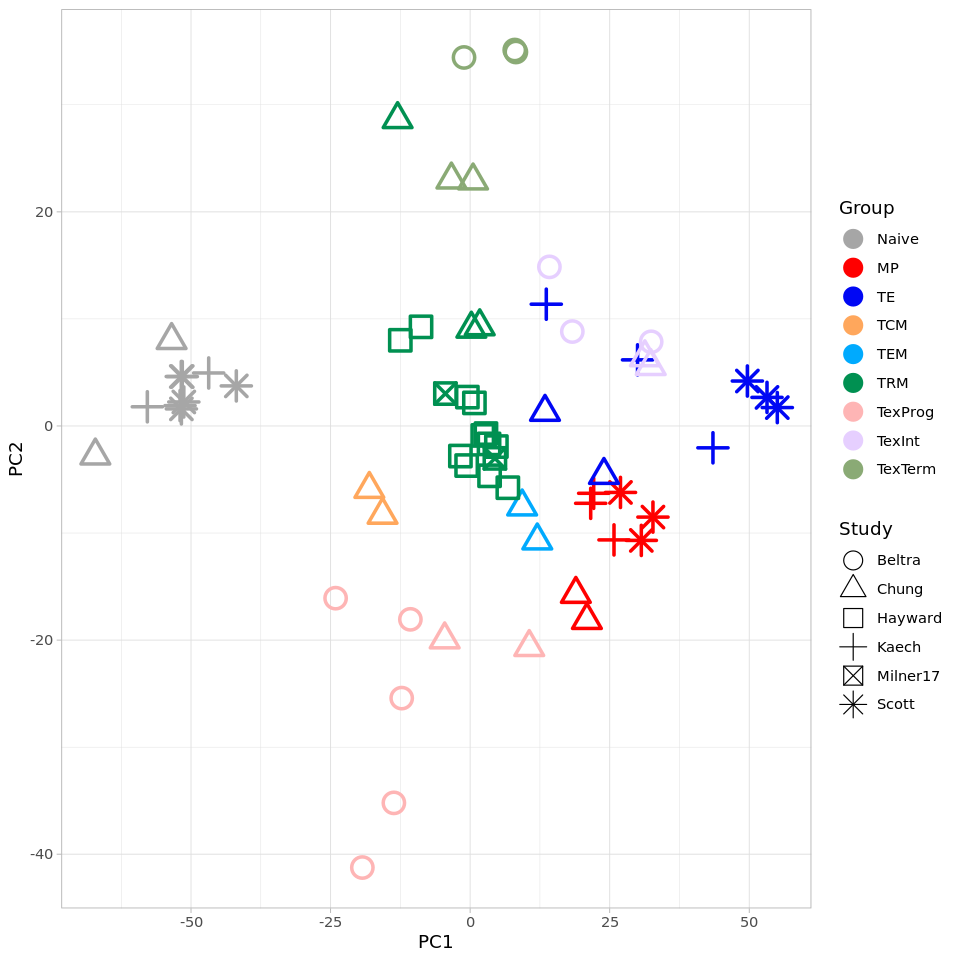

In [423]:
## PCA of library-size normalized ATAC-seq read counts in peaks with batch-effect correction using 10000 most variable peaks 
mydata <- as.data.frame(counts_batch_corrected) %>% 
    dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
    dplyr::top_n(10000) %>%
    dplyr::select(-CV) %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% data.frame %>% mutate(Samples = rownames(.)) %>% 
    mutate(Group = factor(gsub("\\d","",gsub("_.*", "", Samples)), levels = c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm"))) %>% 
    mutate(Study = info[match(rownames(.), rownames(info)),"study"])
myPlot <- ggplot(mydata, aes(x = PC1, y = PC2, colour = Group, shape=Study, stroke = 1.5)) + geom_point(size = 5) + scale_color_manual(values = label.color) + 
        theme_light() + scale_shape(solid = FALSE)
myPlot
pdf("PCA_lib_norm_ATAC_counts_batch_corrected_mv10000.pdf", width = 5, height = 5)
print(myPlot)
dev.off()

In [399]:
## PCA of library-size normalized ATAC-seq read counts in peaks without batch-effect correction
mydata <- as.data.frame(myCounts) %>% dplyr::mutate_if(is.numeric, funs(./sum(.))) %>% 
    as.matrix %>% t %>% prcomp %>% .$x %>% data.frame %>% mutate(Samples = rownames(.)) %>% 
    mutate(Group = factor(gsub("\\d","",gsub("_.*", "", Samples)), levels = c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm"))) %>% 
    mutate(Study = info[match(rownames(.), rownames(info)),"study"])

In [400]:
head(mydata)
dim(mydata)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC58,PC59,PC60,PC61,PC62,PC63,PC64,Samples,Group,Study
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<chr>
MP_Kaech_1_ATAC_rep1,-0.0019244064,-0.0014510783,0.0006559022,-0.0009602328,0.0009202166,-3.614484e-04,0.0004279721,-1.224157e-04,2.677826e-05,3.130949e-04,⋯,5.652543e-08,6.133067e-06,-5.943509e-07,-7.311415e-07,-3.850069e-06,-1.581394e-06,1.367667e-18,MP_Kaech_1_ATAC_rep1,MP,Kaech
MP_Kaech_1_ATAC_rep2,-0.0013721030,-0.0014329267,0.0002892045,-0.0008222405,0.0009276226,-5.354137e-04,0.0003102338,7.970865e-05,1.730596e-04,3.073852e-04,⋯,-3.047945e-06,5.951671e-06,7.077612e-07,-3.626307e-06,-1.043946e-06,-2.810042e-06,2.155859e-17,MP_Kaech_1_ATAC_rep2,MP,Kaech
MP_Kaech_1_ATAC_rep3,-0.0012862359,-0.0013141622,0.0005237504,-0.0008078358,0.0007646353,-6.201403e-04,0.0003387976,1.346884e-04,1.499099e-04,3.282918e-04,⋯,7.285263e-07,1.437915e-05,6.723618e-07,2.742357e-06,3.666122e-07,-4.177576e-06,-2.974471e-17,MP_Kaech_1_ATAC_rep3,MP,Kaech
TE_Kaech_1_ATAC_rep1,-0.0003296581,-0.0008032728,-0.0017453630,-0.0007312191,0.0016796003,-1.917978e-05,-0.0005481069,-2.753991e-04,5.521544e-06,-9.541977e-05,⋯,-1.312596e-06,-9.425727e-06,-2.527952e-06,-4.677039e-07,-2.710772e-06,3.857584e-06,-1.520269e-18,TE_Kaech_1_ATAC_rep1,TE,Kaech
TE_Kaech_1_ATAC_rep2,-0.0016031929,-0.0010205065,0.0002232517,-0.0011148775,0.0011979992,-2.766713e-05,-0.0001423512,-3.483226e-05,1.663889e-04,1.851463e-04,⋯,-1.232090e-06,-6.493959e-06,-2.072750e-08,1.266756e-07,-6.247939e-07,-7.777372e-07,1.394778e-17,TE_Kaech_1_ATAC_rep2,TE,Kaech
TE_Kaech_1_ATAC_rep3,-0.0005935024,-0.0009618854,0.0005510522,-0.0010328189,0.0008867109,-5.702001e-04,0.0001263996,4.660917e-04,3.454107e-04,3.397710e-04,⋯,1.052724e-07,-1.470437e-05,-3.973619e-06,4.641497e-06,1.227613e-05,-4.057681e-06,-2.073059e-17,TE_Kaech_1_ATAC_rep3,TE,Kaech


[1] 64 67

png 
  2

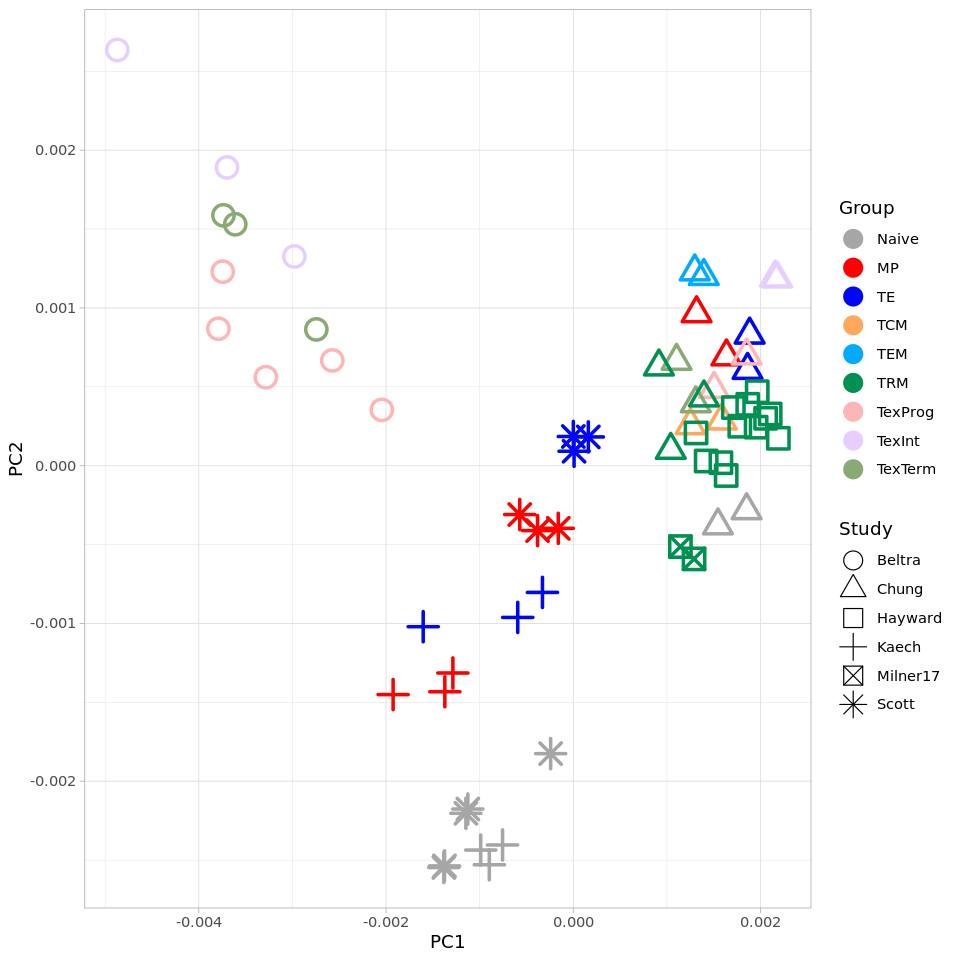

In [402]:
myPlot <- ggplot(mydata, aes(x = PC1, y = PC2, colour = Group, shape=Study, stroke=1.5)) + geom_point(size = 5) + scale_color_manual(values = label.color) + 
        theme_light() + scale_shape(solid = FALSE)
myPlot
pdf("PCA_lib_norm_ATAC_counts.pdf", width = 8, height = 5)
print(myPlot)
dev.off()

In [408]:
## PCA of library-size normalized ATAC-seq read counts in peaks without batch-effect correction using selected peaks 
co.var <- function(x) ( matrixStats::rowSds(x) / matrixStats::rowMeans2(x) )

png 
  2

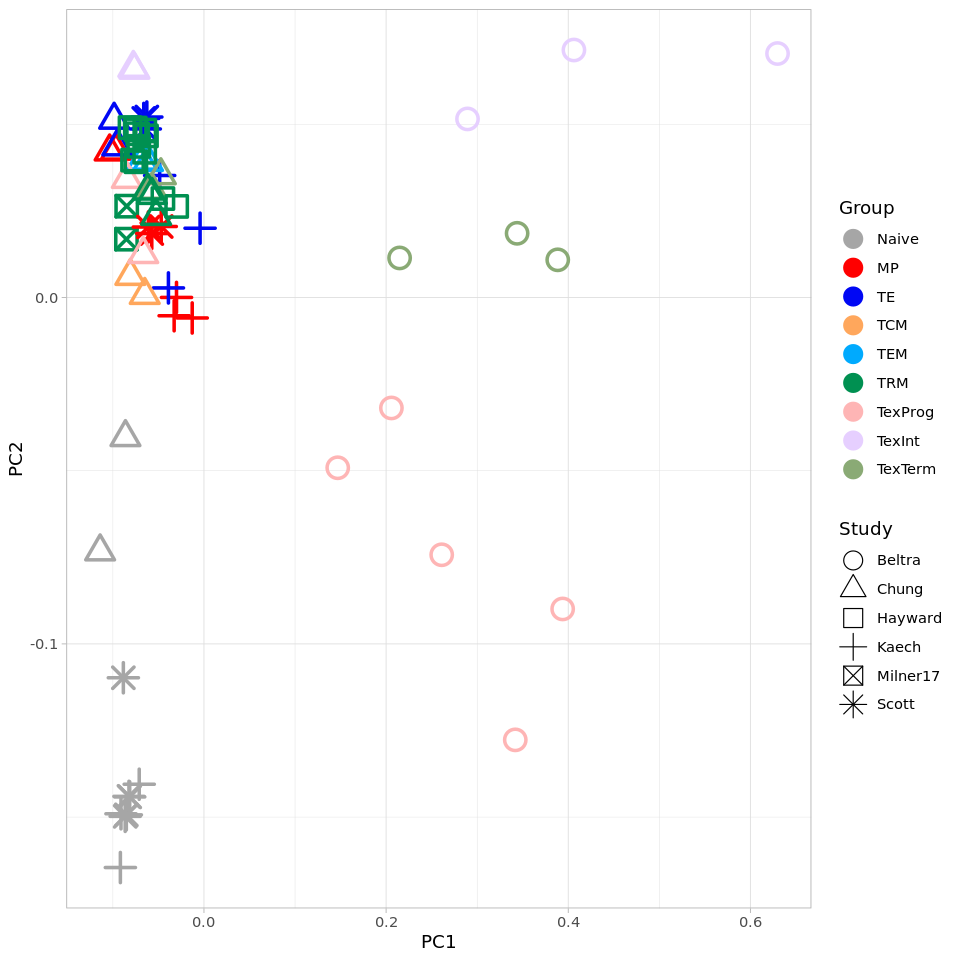

In [409]:
mydata <- as.data.frame(myCounts) %>% dplyr::mutate_if(is.numeric, funs(./sum(.)*200)) %>%
    dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
    dplyr::filter(CV > 1 & CV < 1.5) %>% 
    # dplyr::top_n(10000) %>%
    dplyr::select(-CV) %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% data.frame %>% mutate(Samples = rownames(.)) %>% 
    mutate(Group = factor(gsub("\\d","",gsub("_.*", "", Samples)), levels = c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm"))) %>% 
    mutate(Study = info[match(rownames(.), rownames(info)),"study"])
myPlot <- ggplot(mydata, aes(x = PC1, y = PC2, colour = Group, shape=Study, stroke = 1.5)) + geom_point(size = 5) + scale_color_manual(values = label.color) + 
        theme_light() + scale_shape(solid = FALSE)
myPlot
pdf("PCA_lib_norm_ATAC_counts_cv_1_to1.5_60000peaks.pdf", width = 8, height = 5)
print(myPlot)
dev.off()

In [ ]:
# read processed data
counts_batch_corrected <- read.csv("ATAC_RData/countsFromATAC_batch_corrected.csv", row.names = 1)
head(counts_batch_corrected)
dim(counts_batch_corrected)

In [38]:
meta <- read.table("/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/group_file_v3.txt")
df <- counts_batch_corrected
info <- data.frame(sample = colnames(df),group=gsub("\\d","",gsub("_.*","",colnames(df))), row.names = colnames(df)) %>%
        dplyr::mutate(study=meta[match(gsub("_ATAC.*","",colnames(df)),rownames(meta)),"ATACSource"]) %>%
        na.omit() %>% arrange(match(group,c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm")), study)

head(info)
print(info)

,sample,group,study
,<chr>,<chr>,<chr>
Naive_Kaech_2_ATAC_rep1,Naive_Kaech_2_ATAC_rep1,Naive,Chung
Naive_Kaech_2_ATAC_rep2,Naive_Kaech_2_ATAC_rep2,Naive,Chung
Naive_Kaech_1_ATAC_rep1,Naive_Kaech_1_ATAC_rep1,Naive,Kaech
Naive_Kaech_1_ATAC_rep2,Naive_Kaech_1_ATAC_rep2,Naive,Kaech
Naive_Kaech_1_ATAC_rep3,Naive_Kaech_1_ATAC_rep3,Naive,Kaech
Naive_Scott_ATAC_rep1,Naive_Scott_ATAC_rep1,Naive,Scott


                                             sample   group    study
Naive_Kaech_2_ATAC_rep1     Naive_Kaech_2_ATAC_rep1   Naive    Chung
Naive_Kaech_2_ATAC_rep2     Naive_Kaech_2_ATAC_rep2   Naive    Chung
Naive_Kaech_1_ATAC_rep1     Naive_Kaech_1_ATAC_rep1   Naive    Kaech
Naive_Kaech_1_ATAC_rep2     Naive_Kaech_1_ATAC_rep2   Naive    Kaech
Naive_Kaech_1_ATAC_rep3     Naive_Kaech_1_ATAC_rep3   Naive    Kaech
Naive_Scott_ATAC_rep1         Naive_Scott_ATAC_rep1   Naive    Scott
Naive_Scott_ATAC_rep2         Naive_Scott_ATAC_rep2   Naive    Scott
Naive_Scott_ATAC_rep3         Naive_Scott_ATAC_rep3   Naive    Scott
Naive_Scott_ATAC_rep4         Naive_Scott_ATAC_rep4   Naive    Scott
Naive_Scott_ATAC_rep5         Naive_Scott_ATAC_rep5   Naive    Scott
MP_Kaech_2_ATAC_rep1           MP_Kaech_2_ATAC_rep1      MP    Chung
MP_Kaech_2_ATAC_rep2           MP_Kaech_2_ATAC_rep2      MP    Chung
MP_Kaech_1_ATAC_rep1           MP_Kaech_1_ATAC_rep1      MP    Kaech
MP_Kaech_1_ATAC_rep2           MP_

In [7]:
library(RColorBrewer)

In [10]:
## heatmap using batch correcte values
df <- as.data.frame(counts_batch_corrected) %>% select(info$sample) %>%
    dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
    dplyr::top_n(10000) %>%
    dplyr::select(-CV) %>%
    scaleData

p1 <- pheatmap(df, kmeans_k = 50,
           color = colorRampPalette(rev(brewer.pal(n = 7, name = "YlGnBu")))(100),
           fontsize = 7, show_rownames = F,
           angle_col = 90, show_colnames = F,
           cellwidth = 5, cellheight = 3,
           cluster_cols = T, cluster_rows = T,
           clustering_distance_cols = 'correlation', 
           clustering_distance_rows = 'correlation', 
           clustering_method = 'average',
           # treeheight_row = 0, treeheight_col = 0,
           # cutree_rows = 10, cutree_cols = 1,
           annotation_col = annotation_col,
           annotation_colors = mycolors, 
           border_color = NA,
           filename = paste0("ATAC_RData/hp_","atac_batch_corrected_mv10000_no_Hayward",".pdf"))

Selecting by CV


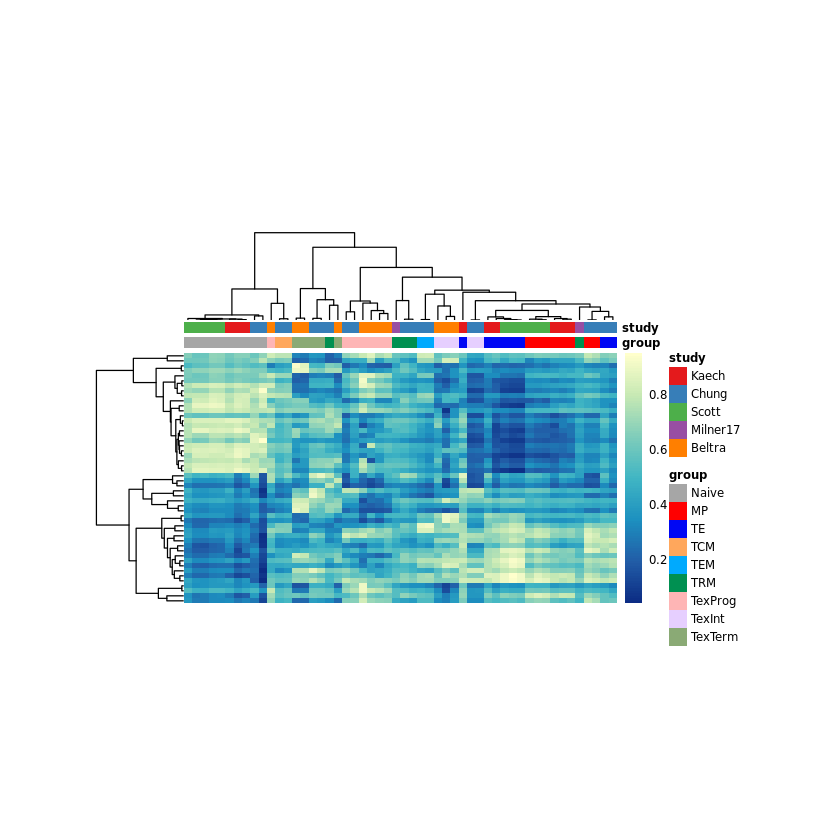

In [11]:
print(p1)

In [441]:
## heatmap using batch correcte values with customized column orders
df <- as.data.frame(counts_batch_corrected) %>% 
    dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
    dplyr::top_n(10000) %>%
    dplyr::select(-CV) %>%
    scaleData
p1 <- pheatmap(df, kmeans_k = 50,
           fontsize = 7, show_rownames = F,
           angle_col = 90, show_colnames = F,
           cellwidth = 5, cellheight = 2,
           clustering_distance_cols = 'correlation', 
           clustering_distance_rows = 'correlation', 
           clustering_method = 'average',
           # treeheight_row = 0, treeheight_col = 0,
           # cutree_rows = 10, cutree_cols = 1,
           annotation_col = annotation_col,
           annotation_colors = mycolors, 
           border_color = NA,
           filename = paste0("hp_","atac_batch_corrected_mv10000",".pdf"))

Selecting by CV


## correlation matrix betweeen cell states

In [416]:
# read processed data
counts_batch_corrected <- read.csv("ATAC_RData/countsFromATAC_batch_corrected.csv", row.names = 1)
head(counts_batch_corrected)
dim(counts_batch_corrected)

,Naive_Kaech_1_ATAC_rep1,Naive_Kaech_1_ATAC_rep2,Naive_Kaech_1_ATAC_rep3,Naive_Kaech_2_ATAC_rep1,Naive_Kaech_2_ATAC_rep2,Naive_Scott_ATAC_rep1,Naive_Scott_ATAC_rep2,Naive_Scott_ATAC_rep3,Naive_Scott_ATAC_rep4,Naive_Scott_ATAC_rep5,⋯,TexInt_Beltra_ATAC_rep1,TexInt_Beltra_ATAC_rep2,TexInt_Beltra_ATAC_rep3,TexInt_Hudson_ATAC_rep1,TexInt_Hudson_ATAC_rep2,TexTerm_Beltra_ATAC_rep1,TexTerm_Beltra_ATAC_rep2,TexTerm_Beltra_ATAC_rep3,TexTerm_Hudson_ATAC_rep1,TexTerm_Hudson_ATAC_rep2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ID_chr1_3505298_3505572,4.924842,5.022926,5.296039,5.183807,4.610469,5.001607,4.865408,4.675090,5.044507,4.931124,⋯,5.537424,5.185969,5.049722,4.610469,4.790706,5.279753,4.440104,5.073558,4.970856,5.315795
ID_chr1_3633064_3633264,4.718510,4.442006,4.818040,4.558142,4.766143,4.558776,4.749094,4.851170,4.743863,4.739938,⋯,5.443675,4.510126,4.510126,4.558142,4.738379,4.510126,4.510126,4.510126,5.066498,4.558142
ID_chr1_3691415_3691740,5.034141,5.011913,4.859665,5.074051,4.500714,4.865147,4.945320,4.968758,4.937938,4.989736,⋯,4.962801,4.539503,4.539503,4.500714,4.500714,5.379153,4.539503,5.428428,5.615389,5.488738
ID_chr1_3754397_3754762,4.779437,5.031214,4.878966,4.918074,4.511338,4.804886,4.806421,4.908497,4.936246,4.977718,⋯,5.270683,4.674158,5.418083,4.691113,4.511338,5.513808,4.674158,4.674158,5.309082,4.866626
ID_chr1_3852337_3852939,4.800027,5.352051,5.053831,5.233333,4.842606,5.051771,5.054821,5.324442,5.126838,5.185087,⋯,5.387418,4.549605,4.549605,4.607450,4.682403,5.571067,5.717016,4.549605,5.542350,5.473202
ID_chr1_3892151_3892356,4.558316,5.203557,4.824588,4.472706,4.766611,4.623215,4.892170,4.623215,5.035957,4.936586,⋯,5.228378,4.631853,4.631853,4.472706,4.652943,4.631853,4.631853,4.631853,5.093733,5.178032


[1] 171401     64

In [417]:
# most updated which removed Hayward dataset completely
meta <- read.table("/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/group_file_v3.txt")
df <- counts_batch_corrected
info <- data.frame(sample = colnames(df),group=gsub("\\d","",gsub("_.*","",colnames(df))), row.names = colnames(df)) %>%
        dplyr::mutate(study=meta[match(gsub("_ATAC.*","",colnames(df)),rownames(meta)),"ATACSource"]) %>%
        na.omit()
# sort df make sure the order of info and data matched
df <- df[,match(rownames(info),names(df))]
annotation_col = data.frame(
  group = info$group,
  study = info$study
)
rownames(annotation_col) = names(df)

# set palette
n_study = length(unique(info$study))
label.color <- c("#A6A6A6", "#FF0000", "#0007F4", "#FFA75C", "#00AAFE", "#009051", "#FEB5B5", "#E6CFFF", "#8AAA75")
mycolors <- list(group = label.color, study = RColorBrewer::brewer.pal(n_study,"Set1")[1:n_study])
names(mycolors$group) <- c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm")
names(mycolors$study) <- unique(info$study)

In [418]:
df <- as.data.frame(counts_batch_corrected) %>% select(info$sample) %>%
    dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
    dplyr::top_n(10000) %>%
    dplyr::select(-CV) %>%
    scaleData

Selecting by CV


In [419]:
head(df)
dim(df)

,Naive_Kaech_1_ATAC_rep1,Naive_Kaech_1_ATAC_rep2,Naive_Kaech_1_ATAC_rep3,Naive_Kaech_2_ATAC_rep1,Naive_Kaech_2_ATAC_rep2,Naive_Scott_ATAC_rep1,Naive_Scott_ATAC_rep2,Naive_Scott_ATAC_rep3,Naive_Scott_ATAC_rep4,Naive_Scott_ATAC_rep5,⋯,TexInt_Beltra_ATAC_rep1,TexInt_Beltra_ATAC_rep2,TexInt_Beltra_ATAC_rep3,TexInt_Hudson_ATAC_rep1,TexInt_Hudson_ATAC_rep2,TexTerm_Beltra_ATAC_rep1,TexTerm_Beltra_ATAC_rep2,TexTerm_Beltra_ATAC_rep3,TexTerm_Hudson_ATAC_rep1,TexTerm_Hudson_ATAC_rep2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ID_chr12_28833997_28834923,0.7756312,0.8278994,0.7962872,0.8528319,0.9999743,0.8577018,0.8608692,0.7919899,0.8039537,0.8277680,⋯,0.2002670,0.1782880,0.28539907,0.2096372,0.2290496,0.2441655,0.1639930,0.0000000,0.2453727,0.3866894
ID_chr1_66552338_66553241,0.8716311,0.8717138,0.8790095,0.8392868,1.0000000,0.9065731,0.9100991,0.6813445,0.8692658,0.8957722,⋯,0.1454638,0.1981223,0.04183439,0.2347670,0.2539384,0.2641412,0.2297670,0.1585369,0.3188102,0.4257312
ID_chrY_1244861_1246457,1.0000000,0.7521014,0.2638993,0.4290073,0.5830656,0.8227960,0.7960565,0.7714684,0.8417033,0.8256235,⋯,0.4125542,0.4125542,0.41255421,0.5864660,0.5518823,0.4125542,0.4125542,0.4125542,0.5047380,0.4589303
ID_chrY_1285702_1286841,1.0000000,0.6856578,0.3239351,0.4355077,0.5677572,0.7390834,0.7663778,0.7026677,0.7959266,0.7843815,⋯,0.3598552,0.3598552,0.35985523,0.4841029,0.4953637,0.3598552,0.3598552,0.3598552,0.3803030,0.5122798
ID_chr16_23181050_23182049,0.6980643,0.7184715,0.7293396,0.8590311,1.0000000,0.7372403,0.7640998,0.7162151,0.6433233,0.7067685,⋯,0.1406137,0.1406137,0.35880109,0.1238920,0.1429982,0.2930097,0.3154956,0.1406137,0.3174992,0.3583494
ID_chr9_31270852_31271855,0.7281605,0.6794105,0.6981767,0.7338553,0.8748049,0.7642185,0.7653714,0.6147116,0.7228905,0.7014662,⋯,0.2247477,0.3483542,0.33376449,0.2306606,0.1901572,0.2021418,0.0000000,0.0000000,0.2678505,0.2827654


[1] 10000    52

In [420]:
names(df)

[1] "Naive_Kaech_1_ATAC_rep1"   "Naive_Kaech_1_ATAC_rep2"  
 [3] "Naive_Kaech_1_ATAC_rep3"   "Naive_Kaech_2_ATAC_rep1"  
 [5] "Naive_Kaech_2_ATAC_rep2"   "Naive_Scott_ATAC_rep1"    
 [7] "Naive_Scott_ATAC_rep2"     "Naive_Scott_ATAC_rep3"    
 [9] "Naive_Scott_ATAC_rep4"     "Naive_Scott_ATAC_rep5"    
[11] "MP_Kaech_1_ATAC_rep1"      "MP_Kaech_1_ATAC_rep2"     
[13] "MP_Kaech_1_ATAC_rep3"      "MP_Kaech_2_ATAC_rep1"     
[15] "MP_Kaech_2_ATAC_rep2"      "MP_Milner_1_ATAC_rep1"    
[17] "MP_Milner_1_ATAC_rep2"     "MP_Milner_1_ATAC_rep3"    
[19] "TE_Kaech_1_ATAC_rep1"      "TE_Kaech_1_ATAC_rep2"     
[21] "TE_Kaech_1_ATAC_rep3"      "TE_Kaech_2_ATAC_rep1"     
[23] "TE_Kaech_2_ATAC_rep2"      "TE_Milner_1_ATAC_rep1"    
[25] "TE_Milner_1_ATAC_rep2"     "TE_Milner_1_ATAC_rep3"    
[27] "TCM_Mackay_ATAC_rep1"      "TCM_Mackay_ATAC_rep2"     
[29] "TEM_Mackay_ATAC_rep1"      "TEM_Mackay_ATAC_rep2"     
[31] "TRM_IEL_1_ATAC_rep1"       "TRM_IEL_1_ATAC_rep2"      
[33] "TRM_IEL_2_ATAC_rep1"       "TRM_liver_ATAC_rep1"      
[35] "TRM_liver_ATAC_rep2"       "TexProg_Hudson_ATAC_rep1" 
[37] "TexProg_Hudson_ATAC_rep2"  "TexProg1_Beltra_ATAC_rep1"
[39] "TexProg1_Beltra_ATAC_rep2" "TexProg2_Beltra_ATAC_rep1"
[41] "TexProg2_Beltra_ATAC_rep2" "TexProg2_Beltra_ATAC_rep3"
[43] "TexInt_Beltra_ATAC_rep1"   "TexInt_Beltra_ATAC_rep2"  
[45] "TexInt_Beltra_ATAC_rep3"   "TexInt_Hudson_ATAC_rep1"  
[47] "TexInt_Hudson_ATAC_rep2"   "TexTerm_Beltra_ATAC_rep1" 
[49] "TexTerm_Beltra_ATAC_rep2"  "TexTerm_Beltra_ATAC_rep3" 
[51] "TexTerm_Hudson_ATAC_rep1"  "TexTerm_Hudson_ATAC_rep2"

In [421]:
subsets <- c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm")
df2 <- do.call("cbind", lapply(paste0(subsets,"_"), function(x) df %>% select(contains(x)) %>% rowMeans())) %>% as.data.frame
names(df2) <- subsets

In [422]:
head(df2)
dim(df2)

,Naive,MP,TE,TCM,TEM,TRM,TexProg,TexInt,TexTerm
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ID_chr12_28833997_28834923,0.8394906,0.42252238,0.2142353,0.7094123,0.5221239,0.4486420,0.8147946,0.2205282,0.2080441
ID_chr1_66552338_66553241,0.8724696,0.31543964,0.1516348,0.6442188,0.4480988,0.3901396,0.5028130,0.1748252,0.2793973
ID_chrY_1244861_1246457,0.7085721,0.12899026,0.2026089,0.4990746,0.5677903,0.4724971,0.2889880,0.4752022,0.4402662
ID_chrY_1285702_1286841,0.6801295,0.08744217,0.1360813,0.4137005,0.4550380,0.4113979,0.2490331,0.4118065,0.3944297
ID_chr16_23181050_23182049,0.7572554,0.23194752,0.1264066,0.5398062,0.2890446,0.3403585,0.3296249,0.1813837,0.2849935
ID_chr9_31270852_31271855,0.7283066,0.50739281,0.2417274,0.7348432,0.6657371,0.4363076,0.6568100,0.2655368,0.1505515


[1] 10000     9

In [305]:
res <- cor(df2, method = "pearson")

In [306]:
res
write.csv(res, paste0(maindir,"ATAC_RData/corr_btw_cell_states_based_on_countsFromATAC_batch_corrected.csv"))

,Naive,MP,TE,TCM,TEM,TRM,TexProg,TexInt,TexTerm
Naive,1.00000000,-0.6292445,-0.7637224,0.4733410,-0.23233267,0.01892790,-0.12024976,-0.5088288,-0.08886782
MP,-0.62924453,1.0000000,0.8201075,0.0522049,0.58270398,0.34739692,0.55096788,0.6193777,0.14568617
TE,-0.76372237,0.8201075,1.0000000,-0.1318677,0.54971961,0.32551247,0.30376669,0.8092174,0.22842593
TCM,0.47334098,0.0522049,-0.1318677,1.0000000,0.50649509,0.28079574,0.12547965,-0.1381359,-0.18754477
TEM,-0.23233267,0.5827040,0.5497196,0.5064951,1.00000000,0.34821672,0.21816442,0.4823258,-0.08131037
TRM,0.01892790,0.3473969,0.3255125,0.2807957,0.34821672,1.00000000,0.09168365,0.2668725,0.53589324
TexProg,-0.12024976,0.5509679,0.3037667,0.1254796,0.21816442,0.09168365,1.00000000,0.2558155,-0.06314006
TexInt,-0.50882883,0.6193777,0.8092174,-0.1381359,0.48232582,0.26687251,0.25581550,1.0000000,0.22562309
TexTerm,-0.08886782,0.1456862,0.2284259,-0.1875448,-0.08131037,0.53589324,-0.06314006,0.2256231,1.00000000


In [433]:
res <- read.csv(paste0(maindir,"ATAC_RData/corr_btw_cell_states_based_on_countsFromATAC_batch_corrected.csv"), row.names = 1) %>% as.matrix
res

,Naive,MP,TE,TCM,TEM,TRM,TexProg,TexInt,TexTerm
Naive,1.00000000,-0.6292445,-0.7637224,0.4733410,-0.23233267,0.01892790,-0.12024976,-0.5088288,-0.08886782
MP,-0.62924453,1.0000000,0.8201075,0.0522049,0.58270398,0.34739692,0.55096788,0.6193777,0.14568617
TE,-0.76372237,0.8201075,1.0000000,-0.1318677,0.54971961,0.32551247,0.30376669,0.8092174,0.22842593
TCM,0.47334098,0.0522049,-0.1318677,1.0000000,0.50649509,0.28079574,0.12547965,-0.1381359,-0.18754477
TEM,-0.23233267,0.5827040,0.5497196,0.5064951,1.00000000,0.34821672,0.21816442,0.4823258,-0.08131037
TRM,0.01892790,0.3473969,0.3255125,0.2807957,0.34821672,1.00000000,0.09168365,0.2668725,0.53589324
TexProg,-0.12024976,0.5509679,0.3037667,0.1254796,0.21816442,0.09168365,1.00000000,0.2558155,-0.06314006
TexInt,-0.50882883,0.6193777,0.8092174,-0.1381359,0.48232582,0.26687251,0.25581550,1.0000000,0.22562309
TexTerm,-0.08886782,0.1456862,0.2284259,-0.1875448,-0.08131037,0.53589324,-0.06314006,0.2256231,1.00000000


In [434]:
pdf(paste0(maindir,"ATAC_RData/corr_btw_cell_states_based_on_countsFromATAC_batch_corrected_hclust_order.pdf"))
# corrplot(res, type = "upper", order = "hclust", tl.col = "black", tl.srt = 45)
corrplot.mixed(res, order = "hclust", tl.col = "black", tl.srt = 45, 
               lower.col = colorRampPalette(rev(brewer.pal(n = 11, name ="RdBu")))(100),
               upper.col = colorRampPalette(rev(brewer.pal(n = 11, name ="RdBu")))(100))
dev.off()

png 
  2

png 
  2

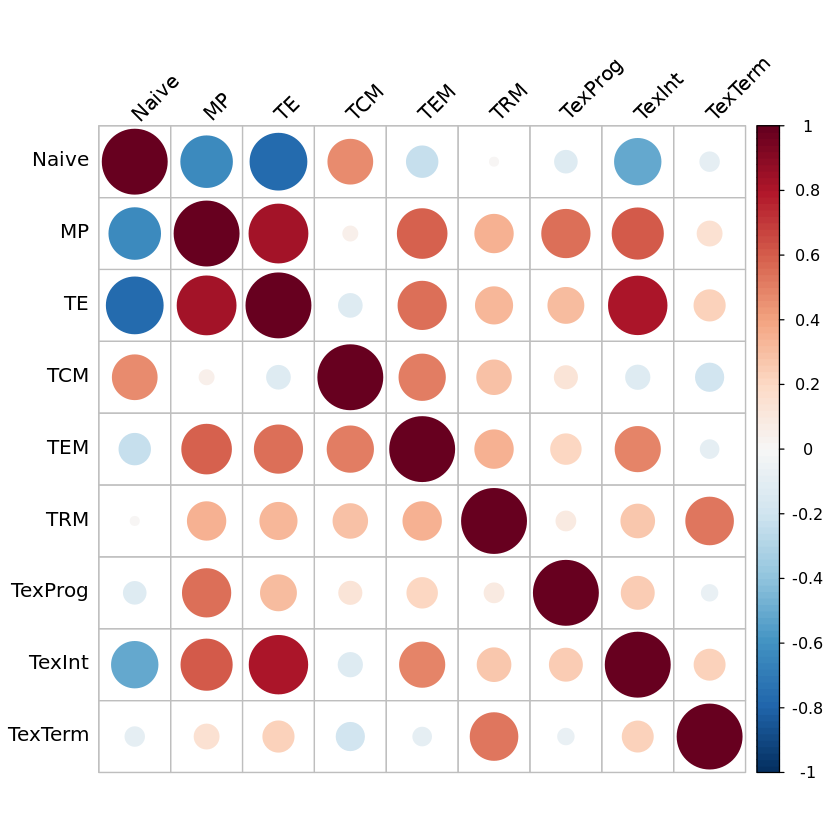

In [427]:
pdf(paste0(maindir,"ATAC_RData/corr_btw_cell_states_based_on_countsFromATAC_batch_corrected.pdf"))
# corrplot(res, type = "upper", order = "hclust", tl.col = "black", tl.srt = 45)
corrplot.mixed(res, tl.col = "black", tl.srt = 45, 
               lower.col = colorRampPalette(rev(brewer.pal(n = 11, name ="RdBu")))(100),
               upper.col = colorRampPalette(rev(brewer.pal(n = 11, name ="RdBu")))(100))
dev.off()

corrplot(res, tl.col = "black", tl.srt = 45, col=colorRampPalette(rev(brewer.pal(n = 11, name ="RdBu")))(100))

In [248]:
# only show Naive, TexTerm and TRM correlation
df3 <- df2 %>% select(Naive, TRM, TexTerm)
head(df3)
dim(df3)

res2 <- cor(df3, method = "pearson")
res2

,Naive,TRM,TexTerm
,<dbl>,<dbl>,<dbl>
ID_chr12_28833997_28834923,0.8394906,0.4486420,0.2080441
ID_chr1_66552338_66553241,0.8724696,0.3901396,0.2793973
ID_chrY_1244861_1246457,0.7085721,0.4724971,0.4402662
ID_chrY_1285702_1286841,0.6801295,0.4113979,0.3944297
ID_chr16_23181050_23182049,0.7572554,0.3403585,0.2849935
ID_chr9_31270852_31271855,0.7283066,0.4363076,0.1505515


[1] 10000     3

,Naive,TRM,TexTerm
Naive,1.00000000,0.0189279,-0.08886782
TRM,0.01892790,1.0000000,0.53589324
TexTerm,-0.08886782,0.5358932,1.00000000


png 
  2

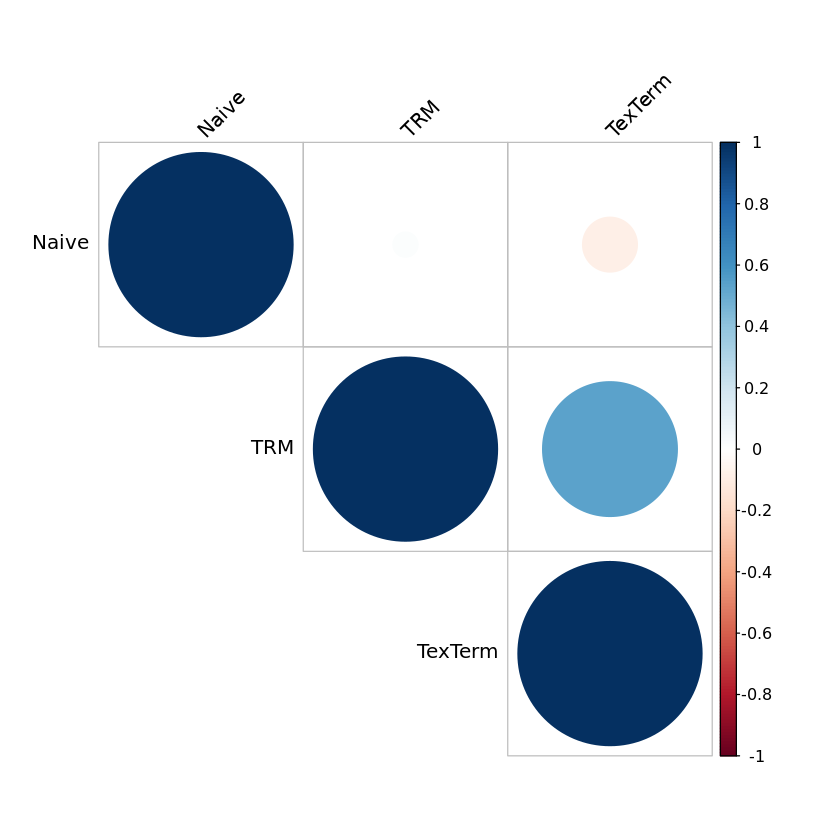

In [251]:
pdf(paste0(maindir,"ATAC_RData/corr_btw_3_cell_states_based_on_countsFromATAC_batch_corrected.pdf"))
corrplot(res2, type = "upper", order = "hclust", 
         tl.col = "black", tl.srt = 45)
dev.off()
corrplot(res2, type = "upper", order = "hclust", 
         tl.col = "black", tl.srt = 45)

## TF motif enrichment analysis

This analysis is kind of independent of the above analysis. We used findMotifsGenome.pl function from Homer with the default parameters. We used the negative log p-value in knownResults.txt as the enrichment score. The narrowPeak file from macs2 output is used as input. And in total 44 samples are being analysed. We take the average enrichment score for each subset to plot the heatmap

In [40]:
setwd("/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/ATACSeq/Homer/")

In [45]:
files <- list.files("./", pattern = "knownResults.txt", recursive = T, full.names = TRUE)
files
length(files)

[1] ".//MP_Kaech_1/knownResults.txt"           
 [2] ".//MP_Kaech_2/knownResults.txt"           
 [3] ".//MP_Kaech_Scott/knownResults.txt"       
 [4] ".//MP_Milner_1/knownResults.txt"          
 [5] ".//MP_Milner_2/knownResults.txt"          
 [6] ".//MP_MilnerAug_Kaech/knownResults.txt"   
 [7] ".//Naive_Kaech_1/knownResults.txt"        
 [8] ".//Naive_Kaech_2/knownResults.txt"        
 [9] ".//Naive_Mackay/knownResults.txt"         
[10] ".//Naive_Milner/knownResults.txt"         
[11] ".//Naive_Renkema/knownResults.txt"        
[12] ".//Naive_Scott/knownResults.txt"          
[13] ".//TCM_Mackay/knownResults.txt"           
[14] ".//TCM_Milner/knownResults.txt"           
[15] ".//TCM_Renkema/knownResults.txt"          
[16] ".//TE_Kaech_1/knownResults.txt"           
[17] ".//TE_Kaech_2/knownResults.txt"           
[18] ".//TE_Kaech_Scott/knownResults.txt"       
[19] ".//TE_Milner_1/knownResults.txt"          
[20] ".//TE_Milner_2/knownResults.txt"          
[21] ".//TE_MilnerAug_Kaech/knownResults.txt"   
[22] ".//TEM_Mackay/knownResults.txt"           
[23] ".//TEM_Milner/knownResults.txt"           
[24] ".//TEM_Renkema/knownResults.txt"          
[25] ".//TexInt_Beltra_Chung/knownResults.txt"  
[26] ".//TexInt_Beltra/knownResults.txt"        
[27] ".//TexInt_Hudson_Beltra/knownResults.txt" 
[28] ".//TexInt_Hudson/knownResults.txt"        
[29] ".//TexProg_Beltra_Chung/knownResults.txt" 
[30] ".//TexProg_Hudson_Beltra/knownResults.txt"
[31] ".//TexProg_Hudson/knownResults.txt"       
[32] ".//TexProg1_Beltra/knownResults.txt"      
[33] ".//TexProg2_Beltra/knownResults.txt"      
[34] ".//TexTerm_Beltra_Chung/knownResults.txt" 
[35] ".//TexTerm_Beltra/knownResults.txt"       
[36] ".//TexTerm_Hudson_Beltra/knownResults.txt"
[37] ".//TexTerm_Hudson/knownResults.txt"       
[38] ".//TRM_IEL_1/knownResults.txt"            
[39] ".//TRM_IEL_2/knownResults.txt"            
[40] ".//TRM_IEL_3/knownResults.txt"            
[41] ".//TRM_IEL_4/knownResults.txt"            
[42] ".//TRM_liver/knownResults.txt"            
[43] ".//TRM_lung_A/knownResults.txt"           
[44] ".//TRM_lung_I/knownResults.txt"

[1] 44

In [51]:
i <- 1
file <- files[i]
df <- read.delim(file)
head(df)
dim(df)

,Motif.Name,Consensus,P.value,Log.P.value,q.value..Benjamini.,X..of.Target.Sequences.with.Motif.of.49197.,X..of.Target.Sequences.with.Motif,X..of.Background.Sequences.with.Motif.of.48108.,X..of.Background.Sequences.with.Motif
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>
1,CTCF(Zf)/CD4+-CTCF-ChIP-Seq(Barski_et_al.)/Homer,AYAGTGCCMYCTRGTGGCCA,0,-8124,0,5884,11.96%,625.4,1.30%
2,BORIS(Zf)/K562-CTCFL-ChIP-Seq(GSE32465)/Homer,CNNBRGCGCCCCCTGSTGGC,0,-5570,0,6491,13.20%,1267.9,2.63%
3,ETS1(ETS)/Jurkat-ETS1-ChIP-Seq(GSE17954)/Homer,ACAGGAAGTG,0,-4051,0,12400,25.21%,5192.5,10.78%
4,Fli1(ETS)/CD8-FLI-ChIP-Seq(GSE20898)/Homer,NRYTTCCGGH,0,-3939,0,13912,28.28%,6310.2,13.10%
5,Etv2(ETS)/ES-ER71-ChIP-Seq(GSE59402)/Homer,NNAYTTCCTGHN,0,-3867,0,10771,21.90%,4240.4,8.80%
6,ETV1(ETS)/GIST48-ETV1-ChIP-Seq(GSE22441)/Homer,AACCGGAAGT,0,-3585,0,14646,29.78%,7114.6,14.77%


[1] 440   9

## no Naive sample version

In [443]:
# read processed data
counts_batch_corrected <- read.csv("ATAC_RData/countsFromATAC_batch_corrected.csv", row.names = 1)
head(counts_batch_corrected)
dim(counts_batch_corrected)

,Naive_Kaech_1_ATAC_rep1,Naive_Kaech_1_ATAC_rep2,Naive_Kaech_1_ATAC_rep3,Naive_Kaech_2_ATAC_rep1,Naive_Kaech_2_ATAC_rep2,Naive_Scott_ATAC_rep1,Naive_Scott_ATAC_rep2,Naive_Scott_ATAC_rep3,Naive_Scott_ATAC_rep4,Naive_Scott_ATAC_rep5,⋯,TexInt_Beltra_ATAC_rep1,TexInt_Beltra_ATAC_rep2,TexInt_Beltra_ATAC_rep3,TexInt_Hudson_ATAC_rep1,TexInt_Hudson_ATAC_rep2,TexTerm_Beltra_ATAC_rep1,TexTerm_Beltra_ATAC_rep2,TexTerm_Beltra_ATAC_rep3,TexTerm_Hudson_ATAC_rep1,TexTerm_Hudson_ATAC_rep2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ID_chr1_3505298_3505572,4.924842,5.022926,5.296039,5.183807,4.610469,5.001607,4.865408,4.675090,5.044507,4.931124,⋯,5.537424,5.185969,5.049722,4.610469,4.790706,5.279753,4.440104,5.073558,4.970856,5.315795
ID_chr1_3633064_3633264,4.718510,4.442006,4.818040,4.558142,4.766143,4.558776,4.749094,4.851170,4.743863,4.739938,⋯,5.443675,4.510126,4.510126,4.558142,4.738379,4.510126,4.510126,4.510126,5.066498,4.558142
ID_chr1_3691415_3691740,5.034141,5.011913,4.859665,5.074051,4.500714,4.865147,4.945320,4.968758,4.937938,4.989736,⋯,4.962801,4.539503,4.539503,4.500714,4.500714,5.379153,4.539503,5.428428,5.615389,5.488738
ID_chr1_3754397_3754762,4.779437,5.031214,4.878966,4.918074,4.511338,4.804886,4.806421,4.908497,4.936246,4.977718,⋯,5.270683,4.674158,5.418083,4.691113,4.511338,5.513808,4.674158,4.674158,5.309082,4.866626
ID_chr1_3852337_3852939,4.800027,5.352051,5.053831,5.233333,4.842606,5.051771,5.054821,5.324442,5.126838,5.185087,⋯,5.387418,4.549605,4.549605,4.607450,4.682403,5.571067,5.717016,4.549605,5.542350,5.473202
ID_chr1_3892151_3892356,4.558316,5.203557,4.824588,4.472706,4.766611,4.623215,4.892170,4.623215,5.035957,4.936586,⋯,5.228378,4.631853,4.631853,4.472706,4.652943,4.631853,4.631853,4.631853,5.093733,5.178032


[1] 171401     64

In [444]:
meta <- read.table("/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/group_file_v3_no_Naive.txt")
df <- counts_batch_corrected
info <- data.frame(sample = colnames(df),group=gsub("\\d","",gsub("_.*","",colnames(df))), row.names = colnames(df)) %>%
        dplyr::mutate(study=meta[match(gsub("_ATAC.*","",colnames(df)),rownames(meta)),"ATACSource"]) %>%
        na.omit()
# sort df make sure the order of info and data matched
df <- df[,match(rownames(info),names(df))]
annotation_col = data.frame(
  group = info$group,
  study = info$study
)
rownames(annotation_col) = names(df)

# set palette
n_study = length(unique(info$study))
subsets <- c("MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm")
label.color <- c("#FF0000", "#0007F4", "#FFA75C", "#00AAFE", "#009051", "#FEB5B5", "#E6CFFF", "#8AAA75")
mycolors <- list(group = label.color, study = RColorBrewer::brewer.pal(n_study,"Set1")[1:n_study])
names(mycolors$group) <- subsets
names(mycolors$study) <- unique(info$study)

Selecting by CV


png 
  2

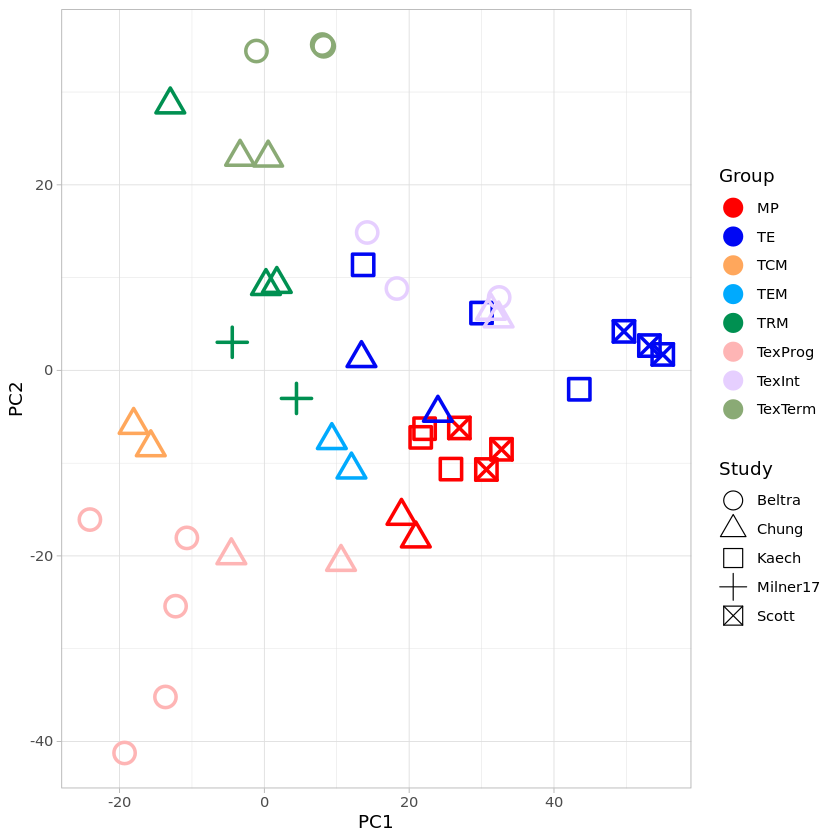

In [445]:
## PCA of library-size normalized ATAC-seq read counts in peaks with batch-effect correction using 10000 most variable peaks 
mydata <- as.data.frame(counts_batch_corrected) %>% 
    dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
    dplyr::top_n(10000) %>%
    dplyr::select(-CV) %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% data.frame %>% mutate(Samples = rownames(.)) %>% 
    mutate(Group = factor(gsub("\\d","",gsub("_.*", "", Samples)), levels = subsets)) %>% 
    mutate(Study = info[match(rownames(.), rownames(info)),"study"]) %>% 
    na.omit()
myPlot <- ggplot(mydata, aes(x = PC1, y = PC2, colour = Group, shape=Study, stroke = 1.5)) + geom_point(size = 5) + scale_color_manual(values = label.color) + 
        theme_light() + scale_shape(solid = FALSE)
myPlot
pdf("ATAC_RData/PCA_lib_norm_ATAC_counts_batch_corrected_mv10000_Hayward_removed_Naive_removed.pdf", width = 5, height = 5)
print(myPlot)
dev.off()

In [447]:
df <- as.data.frame(counts_batch_corrected) %>% select(info$sample) %>%
    dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
    dplyr::top_n(10000) %>%
    dplyr::select(-CV) %>%
    scaleData

Selecting by CV


In [448]:
df2 <- do.call("cbind", lapply(paste0(subsets,"_"), function(x) df %>% select(contains(x)) %>% rowMeans())) %>% as.data.frame
names(df2) <- subsets

In [449]:
res <- cor(df2, method = "pearson")
prefix <- "corr_btw_cell_states_based_on_countsFromATAC_batch_corrected_no_Naive"
pdf(paste0("ATAC_RData/",prefix,".pdf"))
corrplot.mixed(res, tl.col = "black", tl.srt = 45, 
               lower.col = colorRampPalette(rev(brewer.pal(n = 11, name ="RdBu")))(100),
               upper.col = colorRampPalette(rev(brewer.pal(n = 11, name ="RdBu")))(100))
dev.off()


png 
  2

## prepare for Taiji run

In [3]:
# read processed data
counts_batch_corrected <- read.csv("ATAC_RData/countsFromATAC_batch_corrected.csv", row.names = 1)
head(counts_batch_corrected)
dim(counts_batch_corrected)

,Naive_Kaech_1_ATAC_rep1,Naive_Kaech_1_ATAC_rep2,Naive_Kaech_1_ATAC_rep3,Naive_Kaech_2_ATAC_rep1,Naive_Kaech_2_ATAC_rep2,Naive_Scott_ATAC_rep1,Naive_Scott_ATAC_rep2,Naive_Scott_ATAC_rep3,Naive_Scott_ATAC_rep4,Naive_Scott_ATAC_rep5,⋯,TexInt_Beltra_ATAC_rep1,TexInt_Beltra_ATAC_rep2,TexInt_Beltra_ATAC_rep3,TexInt_Hudson_ATAC_rep1,TexInt_Hudson_ATAC_rep2,TexTerm_Beltra_ATAC_rep1,TexTerm_Beltra_ATAC_rep2,TexTerm_Beltra_ATAC_rep3,TexTerm_Hudson_ATAC_rep1,TexTerm_Hudson_ATAC_rep2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ID_chr1_3505298_3505572,4.924842,5.022926,5.296039,5.183807,4.610469,5.001607,4.865408,4.675090,5.044507,4.931124,⋯,5.537424,5.185969,5.049722,4.610469,4.790706,5.279753,4.440104,5.073558,4.970856,5.315795
ID_chr1_3633064_3633264,4.718510,4.442006,4.818040,4.558142,4.766143,4.558776,4.749094,4.851170,4.743863,4.739938,⋯,5.443675,4.510126,4.510126,4.558142,4.738379,4.510126,4.510126,4.510126,5.066498,4.558142
ID_chr1_3691415_3691740,5.034141,5.011913,4.859665,5.074051,4.500714,4.865147,4.945320,4.968758,4.937938,4.989736,⋯,4.962801,4.539503,4.539503,4.500714,4.500714,5.379153,4.539503,5.428428,5.615389,5.488738
ID_chr1_3754397_3754762,4.779437,5.031214,4.878966,4.918074,4.511338,4.804886,4.806421,4.908497,4.936246,4.977718,⋯,5.270683,4.674158,5.418083,4.691113,4.511338,5.513808,4.674158,4.674158,5.309082,4.866626
ID_chr1_3852337_3852939,4.800027,5.352051,5.053831,5.233333,4.842606,5.051771,5.054821,5.324442,5.126838,5.185087,⋯,5.387418,4.549605,4.549605,4.607450,4.682403,5.571067,5.717016,4.549605,5.542350,5.473202
ID_chr1_3892151_3892356,4.558316,5.203557,4.824588,4.472706,4.766611,4.623215,4.892170,4.623215,5.035957,4.936586,⋯,5.228378,4.631853,4.631853,4.472706,4.652943,4.631853,4.631853,4.631853,5.093733,5.178032


[1] 171401     64

In [567]:
output_dir <- "/new-stg/home/cong/Taiji/mouse_immune/mouse11_batch_correction/input/ATAC/Peaks/"
x = colnames(counts_batch_corrected)[1]
tmp = counts_batch_corrected[,x,drop=F] 
names(tmp) = "score"
tmp = tmp %>% tibble::rownames_to_column("id") %>%
    mutate(end = stringi::stri_extract_last_regex(str = id, pattern = "[0-9]+"),
           start = sub("_","",stringi::stri_extract_first_regex(str = id, pattern = "_[0-9]+")),
           chr = sub("ID_","",gsub("_[0-9]+","",id))) %>% select(chr, start, end, id, score) %>% 
    mutate_at(c("start","end"), as.numeric) %>%
    mutate(strand = ".", signalValue = score, pValue = signalValue, qValue = signalValue, peak = as.integer((end-start)/2)) 
head(tmp)
dim(tmp)
write.table(tmp, paste0(output_dir,x,".narrowPeak"), sep = "\t", col.names = F, row.names = T, quote = F)

,chr,start,end,id,score,strand,signalValue,pValue,qValue,peak
,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<int>
1,chr1,3505298,3505572,ID_chr1_3505298_3505572,4.924842,.,4.924842,4.924842,4.924842,137
2,chr1,3633064,3633264,ID_chr1_3633064_3633264,4.718510,.,4.718510,4.718510,4.718510,100
3,chr1,3691415,3691740,ID_chr1_3691415_3691740,5.034141,.,5.034141,5.034141,5.034141,162
4,chr1,3754397,3754762,ID_chr1_3754397_3754762,4.779437,.,4.779437,4.779437,4.779437,182
5,chr1,3852337,3852939,ID_chr1_3852337_3852939,4.800027,.,4.800027,4.800027,4.800027,301
6,chr1,3892151,3892356,ID_chr1_3892151_3892356,4.558316,.,4.558316,4.558316,4.558316,102


[1] 171401     10

In [576]:
# write to individual tsv file
output_dir <- "/new-stg/home/cong/Taiji/mouse_immune/mouse11_batch_correction/input/ATAC/Peaks/"
write_to_peak <- function(x){
    df = counts_batch_corrected[,x,drop=F] 
    names(df) = "score"
    df2 = df %>% tibble::rownames_to_column("id") %>%
        mutate(end = stringi::stri_extract_last_regex(str = id, pattern = "[0-9]+"),
               start = sub("_","",stringi::stri_extract_first_regex(str = id, pattern = "_[0-9]+")),
               chr = sub("ID_","",gsub("_[0-9]+","",id))) %>% select(chr, start, end, id, score) %>% 
        mutate_at(c("start","end"), as.numeric) %>%
        mutate(strand = ".", signalValue = score, pValue = score, qValue = score, peak = as.integer((end-start)/2))
    write.table(df2, paste0(output_dir,x,".narrowPeak"), sep = "\t", col.names = F, row.names = F, quote = F)
}
t <- lapply(colnames(counts_batch_corrected), write_to_peak)

# differential RNA-seq

we follow the tutorial http://bioconductor.org/packages/devel/bioc/vignettes/DESeq2/inst/doc/DESeq2.html#differential-expression-analysis and https://bioconductor.org/packages/release/bioc/vignettes/tximport/inst/doc/tximport.html#RSEM

## get input for DESeq2

the main output of this step is txi

In [1]:
library(tximport)
library(DESeq2)
# library(tximeta)
setwd("~/Taiji/mouse_immune/mouse11_allcombn/output/RNASeq/RNA_RData/")

Loading required package: S4Vectors

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which.max, which.min



Attaching package: ‘S4Vectors’


The following objects are masked from ‘package:base’:

    expand.grid, I, unname


Loading required package: IRanges

Loading required package: GenomicRanges

Loading required package: GenomeInfoDb

Loading required package: SummarizedExperiment

Loading required package: MatrixGe

In [178]:
#### tximeta didn't work, comment out the following code blocks

[1] 78

MP_Kaech_1_RNA_rep1 
"/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Kaech_1_RNA_rep1.bam.genes.results" 
                                                                                 MP_Kaech_1_RNA_rep2 
"/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Kaech_1_RNA_rep2.bam.genes.results" 
                                                                                 MP_Kaech_1_RNA_rep3 
"/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Kaech_1_RNA_rep3.bam.genes.results" 
                                                                                 MP_Kaech_2_RNA_rep1 
"/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Kaech_2_RNA_rep1.bam.genes.results" 
                                                                                 MP_Kaech_2_RNA_rep2 
"/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Kaech_2_RNA_rep2.bam.genes.results" 
                                                                                 MP_Kaech_2_RNA_rep3 
"/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Kaech_2_RNA_rep3.bam.genes.results"

In [174]:
# # load meta data of the samples
# meta <- read.table("/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/group_file_v3.txt") %>% 
#         tibble::rownames_to_column("id")
# head(meta)
# dim(meta)

,id,Group,RNASource,ATACSource,newName
,<chr>,<chr>,<chr>,<chr>,<chr>
1,MP_Kaech_1,MP,Kaech,Kaech,MP_Kaech_Kaech
2,MP_Kaech_2,MP,Kaech,Chung,MP_Kaech_Chung
3,MP_Kaech_Scott,MP,Kaech,Scott,MP_Kaech_Scott
4,MP_MilnerAug_Kaech,MP,MilnerAug,Kaech,MP_MilnerAug_Kaech
5,MP_Milner_1,MP,MilnerAug,Scott,MP_MilnerAug_Scott
6,MP_Milner_2,MP,MilnerAug,Chung,MP_MilnerAug_Chung


[1] 42  5

In [176]:
# coldata <- data.frame("files" = files2, "id" = sub(".*/","",sub("\\_RNA.*","",files2))) %>% left_join(meta, by = "id") %>%
#             mutate(names = sub(".*/","",sub("\\.bam.*","",files)))
# head(coldata)
# dim(coldata)

,files,id,Group,RNASource,ATACSource,newName,names
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Kaech_1_RNA_rep1.bam.genes.results,MP_Kaech_1,MP,Kaech,Kaech,MP_Kaech_Kaech,MP_Kaech_1_RNA_rep1
2,/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Kaech_1_RNA_rep2.bam.genes.results,MP_Kaech_1,MP,Kaech,Kaech,MP_Kaech_Kaech,MP_Kaech_1_RNA_rep2
3,/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Kaech_1_RNA_rep3.bam.genes.results,MP_Kaech_1,MP,Kaech,Kaech,MP_Kaech_Kaech,MP_Kaech_1_RNA_rep3
4,/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Kaech_2_RNA_rep1.bam.genes.results,MP_Kaech_2,MP,Kaech,Chung,MP_Kaech_Chung,MP_Kaech_2_RNA_rep1
5,/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Kaech_2_RNA_rep2.bam.genes.results,MP_Kaech_2,MP,Kaech,Chung,MP_Kaech_Chung,MP_Kaech_2_RNA_rep2
6,/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Kaech_2_RNA_rep3.bam.genes.results,MP_Kaech_2,MP,Kaech,Chung,MP_Kaech_Chung,MP_Kaech_2_RNA_rep3


[1] 78  7

In [177]:
# se <- tximeta(coldata)

ERROR: Error: lexical error: invalid char in json text.
                                      /new-stg/home/cong/Taiji/mouse_i
                     (right here) ------^



In [475]:
# Taiji uses RSEM for gene quantification, we use tximport to get the original count matrix first
duplicates <- c("MP_Milner_2","TE_Milner_2","MP_Kaech_2","TE_Kaech_2","Naive_Kaech_2","TRM_lung_A","TRM_lung_I")
files <- list.files("~/Taiji/mouse_immune/mouse11/output/RNASeq/", "*bam.genes.results", full.names = T)
files2 <- files[!grepl(paste0(duplicates, collapse = "|"),files)]
names(files2) <- sub(".*/","",sub("\\.bam.*","",files2))
length(files)
length(files2)
head(files2)

[1] 88

[1] 69

MP_Kaech_1_RNA_rep1 
   "/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Kaech_1_RNA_rep1.bam.genes.results" 
                                                                                    MP_Kaech_1_RNA_rep2 
   "/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Kaech_1_RNA_rep2.bam.genes.results" 
                                                                                    MP_Kaech_1_RNA_rep3 
   "/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Kaech_1_RNA_rep3.bam.genes.results" 
                                                                                   MP_Milner_1_RNA_rep1 
  "/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Milner_1_RNA_rep1.bam.genes.results" 
                                                                                   MP_Milner_1_RNA_rep2 
  "/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//MP_Milner_1_RNA_rep2.bam.genes.results" 
                                                                                 Naive_Kaech_1_RNA_rep1 
"/new-stg/home/cong/Taiji/mouse_immune/mouse11/output/RNASeq//Naive_Kaech_1_RNA_rep1.bam.genes.results"

In [478]:
txi <- tximport(files2, type = "rsem", txIn = FALSE, txOut = FALSE)
head(txi$counts)
dim(txi$counts)

reading in files with read_tsv

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 
17 
18 
19 
20 
21 
22 
23 
24 
25 
26 
27 
28 
29 
30 
31 
32 
33 
34 
35 
36 
37 
38 
39 
40 
41 
42 
43 
44 
45 
46 
47 
48 
49 
50 
51 
52 
53 
54 
55 
56 
57 
58 
59 
60 
61 
62 
63 
64 
65 
66 
67 
68 
69 




,MP_Kaech_1_RNA_rep1,MP_Kaech_1_RNA_rep2,MP_Kaech_1_RNA_rep3,MP_Milner_1_RNA_rep1,MP_Milner_1_RNA_rep2,Naive_Kaech_1_RNA_rep1,Naive_Kaech_1_RNA_rep2,Naive_Kaech_1_RNA_rep3,Naive_Mackay_RNA_rep1,Naive_Mackay_RNA_rep2,⋯,TexTerm_Beltra_RNA_rep3,TexTerm_Hudson_RNA_rep1,TexTerm_Hudson_RNA_rep2,TexTerm_Hudson_RNA_rep3,TRM_IEL_1_RNA_rep1,TRM_IEL_1_RNA_rep2,TRM_IEL_2_RNA_rep1,TRM_IEL_2_RNA_rep2,TRM_liver_RNA_rep1,TRM_liver_RNA_rep2
ENSMUSG00000000001.4,4828,3920,3441,861,973,3021,3626,1716,6505,5758,⋯,566,3602,2896,3048,614,340,142,168,3937,3945
ENSMUSG00000000003.14,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000000028.13,108,63,70,57,47,37,64,1,81,39,⋯,21,244,80,244,44,51,44,34,162,102
ENSMUSG00000000031.14,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,1,0
ENSMUSG00000000037.15,3,2,0,0,0,41,0,0,0,2,⋯,0,0,0,3,0,0,0,0,1,1
ENSMUSG00000000049.10,0,0,0,0,0,30,0,0,0,0,⋯,0,0,0,0,0,0,0,0,2,5


[1] 46517    69

In [479]:
# edit the 0 lengths to be 1 to avoid "Error: all(lengths > 0) is not TRUE"
txi$length[txi$length==0] <- 1

In [480]:
# load meta data of the samples
meta <- read.table("/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/group_file_v3.txt")
df <- txi$counts
info <- data.frame(sample = colnames(df),group=gsub("\\d","",gsub("_.*","",colnames(df))), row.names = colnames(df)) %>%
        dplyr::mutate(study=meta[match(gsub("_RNA.*","",colnames(df)),rownames(meta)),"RNASource"]) %>%
        dplyr::mutate(across(c(group, study), factor)) %>%
        na.omit()

# sort df make sure the order of info and data matched
df <- df[,match(rownames(info),colnames(df))]

In [189]:
head(info)
head(df)

,sample,group,study
,<chr>,<fct>,<fct>
MP_Kaech_1_RNA_rep1,MP_Kaech_1_RNA_rep1,MP,Kaech
MP_Kaech_1_RNA_rep2,MP_Kaech_1_RNA_rep2,MP,Kaech
MP_Kaech_1_RNA_rep3,MP_Kaech_1_RNA_rep3,MP,Kaech
MP_Kaech_2_RNA_rep1,MP_Kaech_2_RNA_rep1,MP,Kaech
MP_Kaech_2_RNA_rep2,MP_Kaech_2_RNA_rep2,MP,Kaech
MP_Kaech_2_RNA_rep3,MP_Kaech_2_RNA_rep3,MP,Kaech


,MP_Kaech_1_RNA_rep1,MP_Kaech_1_RNA_rep2,MP_Kaech_1_RNA_rep3,MP_Kaech_2_RNA_rep1,MP_Kaech_2_RNA_rep2,MP_Kaech_2_RNA_rep3,MP_Milner_1_RNA_rep1,MP_Milner_1_RNA_rep2,Naive_Kaech_1_RNA_rep1,Naive_Kaech_1_RNA_rep2,⋯,TexTerm_Beltra_RNA_rep3,TexTerm_Hudson_RNA_rep1,TexTerm_Hudson_RNA_rep2,TexTerm_Hudson_RNA_rep3,TRM_IEL_1_RNA_rep1,TRM_IEL_1_RNA_rep2,TRM_IEL_2_RNA_rep1,TRM_IEL_2_RNA_rep2,TRM_liver_RNA_rep1,TRM_liver_RNA_rep2
ENSMUSG00000000001.4,4828,3920,3441,4828,3920,3441,861,973,3021,3626,⋯,566,3602,2896,3048,614,340,142,168,3937,3945
ENSMUSG00000000003.14,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000000028.13,108,63,70,108,63,70,57,47,37,64,⋯,21,244,80,244,44,51,44,34,162,102
ENSMUSG00000000031.14,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,1,0
ENSMUSG00000000037.15,3,2,0,3,2,0,0,0,41,0,⋯,0,0,0,3,0,0,0,0,1,1
ENSMUSG00000000049.10,0,0,0,0,0,0,0,0,30,0,⋯,0,0,0,0,0,0,0,0,2,5


,group,study
,<fct>,<fct>
1,MP,Kaech
2,MP,Kaech
3,MP,Kaech
4,MP,Kaech
5,MP,Kaech
6,MP,Kaech


In [191]:
print(info)

                                           sample   group     study
MP_Kaech_1_RNA_rep1           MP_Kaech_1_RNA_rep1      MP     Kaech
MP_Kaech_1_RNA_rep2           MP_Kaech_1_RNA_rep2      MP     Kaech
MP_Kaech_1_RNA_rep3           MP_Kaech_1_RNA_rep3      MP     Kaech
MP_Kaech_2_RNA_rep1           MP_Kaech_2_RNA_rep1      MP     Kaech
MP_Kaech_2_RNA_rep2           MP_Kaech_2_RNA_rep2      MP     Kaech
MP_Kaech_2_RNA_rep3           MP_Kaech_2_RNA_rep3      MP     Kaech
MP_Milner_1_RNA_rep1         MP_Milner_1_RNA_rep1      MP MilnerAug
MP_Milner_1_RNA_rep2         MP_Milner_1_RNA_rep2      MP MilnerAug
Naive_Kaech_1_RNA_rep1     Naive_Kaech_1_RNA_rep1   Naive     Kaech
Naive_Kaech_1_RNA_rep2     Naive_Kaech_1_RNA_rep2   Naive     Kaech
Naive_Kaech_1_RNA_rep3     Naive_Kaech_1_RNA_rep3   Naive     Kaech
Naive_Kaech_2_RNA_rep1     Naive_Kaech_2_RNA_rep1   Naive     Kaech
Naive_Kaech_2_RNA_rep2     Naive_Kaech_2_RNA_rep2   Naive     Kaech
Naive_Kaech_2_RNA_rep3     Naive_Kaech_2_RNA_rep

In [481]:
dds <- DESeqDataSetFromTximport(txi, info, design = ~study+group)

ERROR: Error in checkFullRank(modelMatrix): the model matrix is not full rank, so the model cannot be fit as specified.
  One or more variables or interaction terms in the design formula are linear
  combinations of the others and must be removed.

  Please read the vignette section 'Model matrix not full rank':

  vignette('DESeq2')


In [482]:
# # Downstream DGE using DESeq2
# dds <- DESeqDataSetFromTximport(txi, info, design = ~group)
# # standard DESeq2 process
# dds <- DESeq(dds)
# vsd <- vst(dds, blind=FALSE)
# mat <- assay(vsd)

# # remove batch effect for downstream analysis
# mat <- limma::removeBatchEffect(mat, vsd$study)
# assay(vsd) <- mat
# counts_batch_corrected <- assay(vsd)


using counts and average transcript lengths from tximport

estimating size factors

using 'avgTxLength' from assays(dds), correcting for library size

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

-- replacing outliers and refitting for 270 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



## old results

In [56]:
rna <- readRNA("~/Taiji/mouse_immune/mouse11_allcombn/output/RNASeq/")

In [57]:
# remove duplicated columns
rna <- rna[!duplicated(as.list(rna))]

In [64]:
rna["UBL5",]

,MP_MilnerAug_Kaech,MP_MilnerAug_Kaech.1,TE_MilnerAug_Kaech,TE_MilnerAug_Kaech.1,MP_Kaech_Scott,MP_Kaech_Scott.1,MP_Kaech_Scott.2,TE_Kaech_Scott,TE_Kaech_Scott.1,TE_Kaech_Scott.2,⋯,TEM_Renkema,TEM_Renkema.1,TEM_Renkema.2,Naive_Renkema,Naive_Renkema.1,Naive_Renkema.2,Naive_Scott,Naive_Scott.1,Naive_Scott.2,Naive_Scott.3
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UBL5,571.1694,398.0997,434.5902,394.0125,352.5033,378.3664,392.4425,366.9851,380.5848,387.6228,⋯,117.4648,226.5033,200.2892,193.7708,123.4079,97.95721,165.8954,164.8563,140.9141,168.0679


In [58]:
colnames(rna)

[1] "MP_MilnerAug_Kaech"      "MP_MilnerAug_Kaech.1"   
 [3] "TE_MilnerAug_Kaech"      "TE_MilnerAug_Kaech.1"   
 [5] "MP_Kaech_Scott"          "MP_Kaech_Scott.1"       
 [7] "MP_Kaech_Scott.2"        "TE_Kaech_Scott"         
 [9] "TE_Kaech_Scott.1"        "TE_Kaech_Scott.2"       
[11] "TRM_IEL_4"               "TRM_IEL_4.1"            
[13] "TRM_IEL_3"               "TRM_IEL_3.1"            
[15] "TexProg_Beltra_Chung"    "TexProg_Beltra_Chung.1" 
[17] "TexProg_Beltra_Chung.2"  "TexProg_Beltra_Chung.3" 
[19] "TexProg_Beltra_Chung.4"  "TexProg_Beltra_Chung.5" 
[21] "TexInt_Beltra_Chung"     "TexInt_Beltra_Chung.1"  
[23] "TexInt_Beltra_Chung.2"   "TexTerm_Beltra_Chung"   
[25] "TexTerm_Beltra_Chung.1"  "TexTerm_Beltra_Chung.2" 
[27] "TexProg_Hudson_Beltra"   "TexProg_Hudson_Beltra.1"
[29] "TexProg_Hudson_Beltra.2" "TexInt_Hudson_Beltra"   
[31] "TexInt_Hudson_Beltra.1"  "TexInt_Hudson_Beltra.2" 
[33] "TexTerm_Hudson_Beltra"   "TexTerm_Hudson_Beltra.1"
[35] "TexTerm_Hudson_Beltra.2" "Naive_Kaech_1"          
[37] "Naive_Kaech_1.1"         "Naive_Kaech_1.2"        
[39] "TRM_lung_A"              "TRM_lung_A.1"           
[41] "TRM_lung_A.2"            "TRM_lung_I"             
[43] "TRM_lung_I.1"            "TRM_lung_I.2"           
[45] "Naive_Mackay"            "Naive_Mackay.1"         
[47] "Naive_Mackay.2"          "Naive_Mackay.3"         
[49] "TCM_Mackay"              "TCM_Mackay.1"           
[51] "TEM_Mackay"              "TEM_Mackay.1"           
[53] "TRM_liver"               "TRM_liver.1"            
[55] "TEM_Milner"              "TEM_Milner.1"           
[57] "TEM_Milner.2"            "TEM_Milner.3"           
[59] "TCM_Milner"              "TCM_Milner.1"           
[61] "Naive_Milner"            "Naive_Milner.1"         
[63] "TCM_Renkema"             "TCM_Renkema.1"          
[65] "TCM_Renkema.2"           "TEM_Renkema"            
[67] "TEM_Renkema.1"           "TEM_Renkema.2"          
[69] "Naive_Renkema"           "Naive_Renkema.1"        
[71] "Naive_Renkema.2"         "Naive_Scott"            
[73] "Naive_Scott.1"           "Naive_Scott.2"          
[75] "Naive_Scott.3"

In [459]:
head(rna)
dim(rna)

,MP_MilnerAug_Kaech,MP_MilnerAug_Kaech.1,TE_MilnerAug_Kaech,TE_MilnerAug_Kaech.1,MP_Kaech_Scott,MP_Kaech_Scott.1,MP_Kaech_Scott.2,TE_Kaech_Scott,TE_Kaech_Scott.1,TE_Kaech_Scott.2,⋯,TEM_Renkema,TEM_Renkema.1,TEM_Renkema.2,Naive_Renkema,Naive_Renkema.1,Naive_Renkema.2,Naive_Scott,Naive_Scott.1,Naive_Scott.2,Naive_Scott.3
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UBL5,571.169441,398.09966,434.59019,394.01251,352.503308,378.3664100,392.442498,366.985058,380.5848332,387.6227612,⋯,117.4648,226.50327,200.2892,193.770834,123.40792,97.95721,165.89539,164.856340,140.914061,168.067934
GM38348,0.000000,0.00000,0.00000,0.00000,0.000000,0.0000000,0.000000,0.000000,0.0000000,0.0000000,⋯,0.0000,0.00000,0.0000,0.000000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000
E330014E10RIK,0.000000,0.00000,0.00000,0.00000,0.000000,0.0000000,0.000000,0.000000,0.0000000,0.0000000,⋯,0.0000,0.00000,0.0000,0.000000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000
TTC32,4.990082,23.20056,13.09061,13.11042,11.090733,11.4608000,10.180843,8.770599,9.7806382,6.3703741,⋯,0.0000,0.00000,0.0000,0.000000,0.00000,0.00000,8.94029,7.680295,6.750195,9.660456
GM14719,0.000000,0.00000,0.00000,12.39039,1.430095,0.9900691,2.490206,0.000000,0.9800639,0.5000294,⋯,0.0000,0.00000,0.0000,0.000000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000
1700037H04RIK,23.890395,31.52076,28.09130,36.15115,28.641894,20.8814575,22.841892,22.561541,24.1215739,21.8712843,⋯,0.0000,13.39735,0.0000,6.612313,38.51425,0.00000,39.28128,39.111504,38.431108,41.311950


[1] 35595    75

In [463]:
maindir <- "~/Taiji/mouse_immune/mouse11_allcombn/output/post-analysis/"
setwd(maindir)
createDir("heatmap")

[1] "/stg2/data1/cong/Taiji/mouse_immune/mouse11_allcombn/output/post-analysis/heatmap"


In [13]:
head(meta)

,Group,RNASource,ATACSource,newName
,<chr>,<chr>,<chr>,<chr>
MP_Kaech_1,MP,Kaech,Kaech,MP_Kaech_Kaech
MP_Kaech_2,MP,Kaech,Chung,MP_Kaech_Chung
MP_Kaech_Scott,MP,Kaech,Scott,MP_Kaech_Scott
MP_MilnerAug_Kaech,MP,MilnerAug,Kaech,MP_MilnerAug_Kaech
MP_Milner_1,MP,MilnerAug,Scott,MP_MilnerAug_Scott
MP_Milner_2,MP,MilnerAug,Chung,MP_MilnerAug_Chung


In [471]:
df <- scaleData(rna)
info_rna <- data.frame(sample = colnames(df),group=gsub("\\d","",gsub("_.*","",colnames(df))), row.names = colnames(df)) %>%
        dplyr::mutate(study=meta[match(gsub("\\.\\d","",colnames(df)),rownames(meta)),"RNASource"])
# sort df make sure the order of info and df matched
df <- df[,match(rownames(info_rna),names(df))]
annotation_col_rna = data.frame(
  group = info_rna$group,
  study = info_rna$study
)
rownames(annotation_col_rna) = names(df)

# set palette
n_study = length(unique(info_rna$study))
mycolors <- list(group = label.color, study = RColorBrewer::brewer.pal(n_study,"Set1")[1:n_study])
names(mycolors$group) <- c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm")
names(mycolors$study) <- unique(info_rna$study)

In [472]:
p1 <- pheatmap(df, kmeans_k = 100,
           fontsize = 7, show_rownames = F,
           angle_col = 90, show_colnames = F,
           cellwidth = 5, cellheight = 2,
           clustering_distance_cols = 'correlation', 
           clustering_distance_rows = 'correlation', 
           clustering_method = 'average',
           # treeheight_row = 0, treeheight_col = 0,
           # cutree_rows = 10, cutree_cols = 1,
           annotation_col = annotation_col_rna,
           annotation_colors = mycolors, 
           border_color = NA,
           filename = paste0("hp_","rna",".pdf"))

In [473]:
head(info_rna)
dim(info_rna)

,sample,group,study
,<chr>,<chr>,<chr>
MP_MilnerAug_Kaech,MP_MilnerAug_Kaech,MP,MilnerAug
MP_MilnerAug_Kaech.1,MP_MilnerAug_Kaech.1,MP,MilnerAug
TE_MilnerAug_Kaech,TE_MilnerAug_Kaech,TE,MilnerAug
TE_MilnerAug_Kaech.1,TE_MilnerAug_Kaech.1,TE,MilnerAug
MP_Kaech_Scott,MP_Kaech_Scott,MP,Kaech
MP_Kaech_Scott.1,MP_Kaech_Scott.1,MP,Kaech


[1] 75  3

Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.



png 
  2

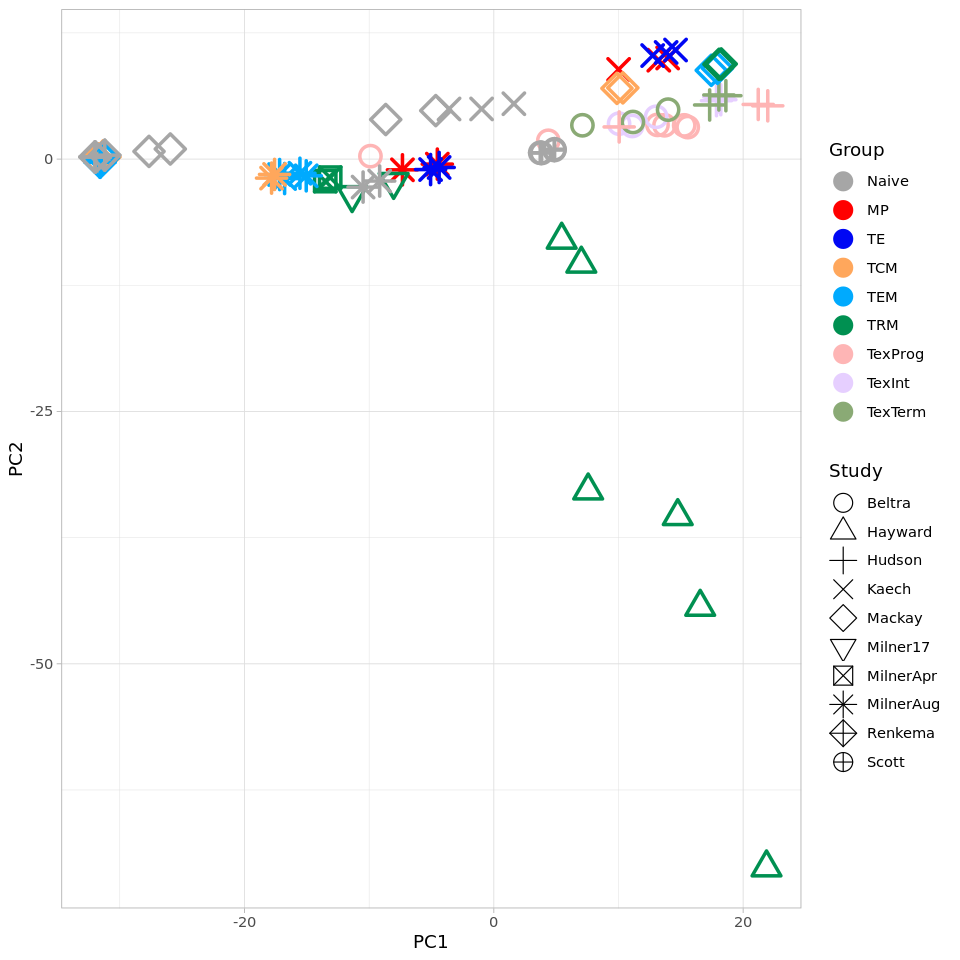

In [479]:
## PCA of TPM normalized RNA-seq counts without batch-effect correction
mydata <- rna %>% scaleData %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% data.frame %>% mutate(Samples = rownames(.)) %>% 
    mutate(Group = factor(gsub("\\d","",gsub("_.*", "", Samples)), levels = c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm"))) %>% 
    mutate(Study = factor(info_rna[match(rownames(.), rownames(info_rna)),"study"]))

myPlot <- ggplot(mydata, aes(x = PC1, y = PC2, colour = Group, shape=Study, stroke=1.5)) + geom_point(size = 5) + scale_color_manual(values = label.color) + 
        theme_light() + scale_shape(solid = FALSE) + scale_shape_manual(values = 1:nlevels(mydata$Study))
myPlot
pdf("PCA_TPM_RNA_counts.pdf", width = 8, height = 5)
print(myPlot)
dev.off()

In [475]:
mydata

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC69,PC70,PC71,PC72,PC73,PC74,PC75,Samples,Group,Study
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<chr>
MP_MilnerAug_Kaech,-35240.74,-12295.8312,-9828.745,-1550.0125,9052.364,-11189.305,9272.9934,-674.10622,6265.8518,-7026.3774,⋯,29.61117949,10.84934354,20.953711,18.1710064,8.8356756,1.6923450,4.405284e-11,MP_MilnerAug_Kaech,MP,MilnerAug
MP_MilnerAug_Kaech.1,-24832.75,-15115.7624,-8934.166,-3584.1137,6362.392,-4825.832,4434.7281,3508.40348,2538.6330,-2108.1969,⋯,-91.58252040,-1.07020449,-9.266444,5.3109308,-3.2576687,-2.0222020,3.272094e-10,MP_MilnerAug_Kaech.1,MP,MilnerAug
TE_MilnerAug_Kaech,-30082.50,-14083.3130,-9643.065,906.3359,-1507.952,-10680.490,11310.8980,-3632.40065,8670.9461,-11176.0201,⋯,-10.43381659,-4.01895687,-14.296870,-14.1945064,10.7592480,5.6508045,-3.746628e-10,TE_MilnerAug_Kaech,TE,MilnerAug
TE_MilnerAug_Kaech.1,-16826.81,-17798.4906,-9060.028,-994.9947,-2948.952,-7383.637,11421.1499,-1263.58330,5712.7365,-6546.5126,⋯,88.01144715,3.01103943,2.989564,-17.9457766,-8.7987506,-4.4454819,3.012006e-10,TE_MilnerAug_Kaech.1,TE,MilnerAug
MP_Kaech_Scott,-61438.26,-3278.5192,-9640.530,4814.8445,8624.561,7259.822,-6774.1313,-8224.99610,-601.1174,-1859.1334,⋯,-13.42554590,-203.39204279,-344.162205,-469.4375749,-57.7534122,-71.2036518,-3.145641e-10,MP_Kaech_Scott,MP,Kaech
MP_Kaech_Scott.1,-61285.95,-3466.5788,-10034.045,4670.6474,11974.832,9212.729,-5432.6364,-8660.01601,-766.2827,-1598.0473,⋯,-374.55696689,337.68917784,-137.847995,177.5895517,41.3687681,40.7757416,-4.961462e-10,MP_Kaech_Scott.1,MP,Kaech
MP_Kaech_Scott.2,-61343.27,-3262.7089,-9705.374,5091.4357,8225.638,7620.415,-6118.4380,-8213.24858,-407.6032,-1929.6332,⋯,458.39337728,-149.35052573,471.021656,295.8692031,26.7800761,27.8773702,-2.699435e-10,MP_Kaech_Scott.2,MP,Kaech
TE_Kaech_Scott,-62017.27,-4194.3952,-9938.408,7508.6012,-2484.234,10238.567,371.6892,-9408.39811,2315.3962,-5638.7240,⋯,-582.67369815,38.74458154,268.387887,133.1992627,104.8620906,13.4172765,-4.493279e-10,TE_Kaech_Scott,TE,Kaech
TE_Kaech_Scott.1,-61915.80,-4068.5138,-9832.716,7447.3728,-1966.902,8878.945,-892.5605,-9095.92121,2404.9540,-5711.7031,⋯,170.31479017,277.27707946,-293.517720,46.7942338,-44.0678481,19.7191456,-5.646973e-10,TE_Kaech_Scott.1,TE,Kaech


## batch-effect correction

In [483]:
# Downstream DGE using DESeq2
dds <- DESeqDataSetFromTximport(txi, info, design = ~group)
# standard DESeq2 process
dds <- DESeq(dds)
vsd <- vst(dds, blind=FALSE)
mat <- assay(vsd)

using counts and average transcript lengths from tximport

estimating size factors

using 'avgTxLength' from assays(dds), correcting for library size

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

-- replacing outliers and refitting for 270 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



In [484]:
counts(dds)

,MP_Kaech_1_RNA_rep1,MP_Kaech_1_RNA_rep2,MP_Kaech_1_RNA_rep3,MP_Milner_1_RNA_rep1,MP_Milner_1_RNA_rep2,Naive_Kaech_1_RNA_rep1,Naive_Kaech_1_RNA_rep2,Naive_Kaech_1_RNA_rep3,Naive_Mackay_RNA_rep1,Naive_Mackay_RNA_rep2,⋯,TexTerm_Beltra_RNA_rep3,TexTerm_Hudson_RNA_rep1,TexTerm_Hudson_RNA_rep2,TexTerm_Hudson_RNA_rep3,TRM_IEL_1_RNA_rep1,TRM_IEL_1_RNA_rep2,TRM_IEL_2_RNA_rep1,TRM_IEL_2_RNA_rep2,TRM_liver_RNA_rep1,TRM_liver_RNA_rep2
ENSMUSG00000000001.4,4828,3920,3441,861,973,3021,3626,1716,6505,5758,⋯,566,3602,2896,3048,614,340,142,168,3937,3945
ENSMUSG00000000003.14,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000000028.13,108,63,70,57,47,37,64,1,81,39,⋯,21,244,80,244,44,51,44,34,162,102
ENSMUSG00000000031.14,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,1,0
ENSMUSG00000000037.15,3,2,0,0,0,41,0,0,0,2,⋯,0,0,0,3,0,0,0,0,1,1
ENSMUSG00000000049.10,0,0,0,0,0,30,0,0,0,0,⋯,0,0,0,0,0,0,0,0,2,5
ENSMUSG00000000056.7,2061,1275,1447,219,241,763,842,232,647,738,⋯,114,806,712,781,133,96,115,98,910,905
ENSMUSG00000000058.6,17,2,11,0,0,0,0,0,0,0,⋯,0,4,6,6,0,4,0,0,35,57
ENSMUSG00000000078.6,5690,10121,4156,531,389,2579,3338,1112,4265,3284,⋯,628,1752,1786,1731,1426,493,8313,6240,4392,3938
ENSMUSG00000000085.15,91,79,51,4,12,285,384,177,404,437,⋯,10,9,14,16,7,6,27,25,59,48


In [485]:
write.csv(counts(dds), "countsFromRNA_DESeq2.csv")

In [486]:
# doesn't work because study is confounded with treatment
# it's the same reason that 'dds <- DESeqDataSetFromTximport(txi, info, design = ~study+group)' didn't work
mm <- model.matrix(~group, colData(vsd))
mat2 <- limma::removeBatchEffect(mat, vsd$study, design = mm)
write.csv(mat2, "countsFromRNA_batch_corrected_v2.csv")

Coefficients not estimable: batch8 


Warning message:
"Partial NA coefficients for 46517 probe(s)"


In [487]:
# remove batch effect for downstream analysis
mat2 <- limma::removeBatchEffect(mat, vsd$study)
write.csv(mat2, "countsFromRNA_batch_corrected.csv")

In [488]:
vsd@colData

DataFrame with 69 rows and 4 columns
                                   sample    group     study replaceable
                              <character> <factor>  <factor>   <logical>
MP_Kaech_1_RNA_rep1   MP_Kaech_1_RNA_rep1       MP Kaech           FALSE
MP_Kaech_1_RNA_rep2   MP_Kaech_1_RNA_rep2       MP Kaech           FALSE
MP_Kaech_1_RNA_rep3   MP_Kaech_1_RNA_rep3       MP Kaech           FALSE
MP_Milner_1_RNA_rep1 MP_Milner_1_RNA_rep1       MP MilnerAug       FALSE
MP_Milner_1_RNA_rep2 MP_Milner_1_RNA_rep2       MP MilnerAug       FALSE
...                                   ...      ...       ...         ...
TRM_IEL_1_RNA_rep2     TRM_IEL_1_RNA_rep2      TRM Milner17        FALSE
TRM_IEL_2_RNA_rep1     TRM_IEL_2_RNA_rep1      TRM MilnerApr       FALSE
TRM_IEL_2_RNA_rep2     TRM_IEL_2_RNA_rep2      TRM MilnerApr       FALSE
TRM_liver_RNA_rep1     TRM_liver_RNA_rep1      TRM Mackay          FALSE
TRM_liver_RNA_rep2     TRM_liver_RNA_rep2      TRM Mackay          FALSE

In [ ]:
## heatmap using 10000 most variable genes
df <- rna %>% 
    dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
    dplyr::top_n(10000) %>%
    dplyr::select(-CV) %>%
    scaleData
p1 <- pheatmap(df, kmeans_k = 50,
           fontsize = 7, show_rownames = F,
           angle_col = 90, show_colnames = F,
           cellwidth = 5, cellheight = 2,
           clustering_distance_cols = 'correlation', 
           clustering_distance_rows = 'correlation', 
           clustering_method = 'average',
           # treeheight_row = 0, treeheight_col = 0,
           # cutree_rows = 10, cutree_cols = 1,
           annotation_col = annotation_col_rna,
           annotation_colors = mycolors, 
           border_color = NA,
           filename = paste0("hp_","rna_mv10000",".pdf"))

## PCA and heatmap plots

In [491]:
# read processed data
prefix <- "batch_corrected"
counts_batch_corrected <- read.csv(paste0("countsFromRNA_",prefix,".csv"), row.names = 1)
# counts_batch_corrected <- read.csv("countsFromRNA_batch_corrected.csv", row.names = 1)
# counts_batch_corrected <- read.csv("countsFromRNA_batch_corrected_v2.csv", row.names = 1)
# counts_batch_corrected <- read.csv("countsFromRNA_DESeq2.csv", row.names = 1)

head(counts_batch_corrected)
dim(counts_batch_corrected)

,MP_Kaech_1_RNA_rep1,MP_Kaech_1_RNA_rep2,MP_Kaech_1_RNA_rep3,MP_Milner_1_RNA_rep1,MP_Milner_1_RNA_rep2,Naive_Kaech_1_RNA_rep1,Naive_Kaech_1_RNA_rep2,Naive_Kaech_1_RNA_rep3,Naive_Mackay_RNA_rep1,Naive_Mackay_RNA_rep2,⋯,TexTerm_Beltra_RNA_rep3,TexTerm_Hudson_RNA_rep1,TexTerm_Hudson_RNA_rep2,TexTerm_Hudson_RNA_rep3,TRM_IEL_1_RNA_rep1,TRM_IEL_1_RNA_rep2,TRM_IEL_2_RNA_rep1,TRM_IEL_2_RNA_rep2,TRM_liver_RNA_rep1,TRM_liver_RNA_rep2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSMUSG00000000001.4,9.081818,9.038332,9.039626,10.125208,10.278872,9.256898,9.197754,9.572627,9.731909,9.504936,⋯,9.044327,9.097146,8.970981,9.022842,9.277536,9.123472,9.062163,9.338845,8.966225,8.957398
ENSMUSG00000000003.14,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,⋯,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111
ENSMUSG00000000028.13,6.414839,6.225612,6.354439,6.563030,6.527068,6.261398,6.379093,5.736870,6.394415,6.146541,⋯,5.672649,6.362647,5.768063,6.464164,5.989108,6.632354,6.303998,6.317463,6.692705,6.500778
ENSMUSG00000000031.14,4.974448,4.974448,4.974448,4.974448,4.974448,4.974448,4.974448,4.974448,4.962412,4.962412,⋯,4.974448,4.974448,4.974448,4.974448,4.974448,4.974448,4.974448,4.974448,5.082768,4.962412
ENSMUSG00000000037.15,5.040492,4.993169,4.888779,5.010978,5.010978,5.641940,4.888779,4.888779,4.957163,5.223369,⋯,4.933141,4.924025,4.924025,5.388213,5.010978,5.010978,5.010978,5.010978,5.035595,5.058211
ENSMUSG00000000049.10,4.960022,4.960022,4.960022,5.007136,5.007136,5.384048,4.960022,4.960022,4.981144,4.981144,⋯,4.988424,4.899671,4.899671,4.899671,5.007136,5.007136,5.007136,5.007136,5.072943,5.149261


[1] 46517    69

In [492]:
meta <- read.table("/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/group_file_v3.txt")
df <- counts_batch_corrected
info <- data.frame(sample = colnames(df),group=gsub("\\d","",gsub("_.*","",colnames(df))), row.names = colnames(df)) %>%
        dplyr::mutate(study=meta[match(gsub("_RNA.*","",colnames(df)),rownames(meta)),"RNASource"]) %>%
        na.omit()
# sort df make sure the order of info and data matched
df <- df[,match(rownames(info),names(df))]
annotation_col = data.frame(
  group = info$group,
  study = info$study
)
rownames(annotation_col) = names(df)

# set palette
n_study = length(unique(info$study))
label.color <- c("#A6A6A6", "#FF0000", "#0007F4", "#FFA75C", "#00AAFE", "#009051", "#FEB5B5", "#E6CFFF", "#8AAA75")
mycolors <- list(group = label.color, study = RColorBrewer::brewer.pal(n_study,"Set1")[1:n_study])
names(mycolors$group) <- c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm")
names(mycolors$study) <- unique(info$study)

png 
  2

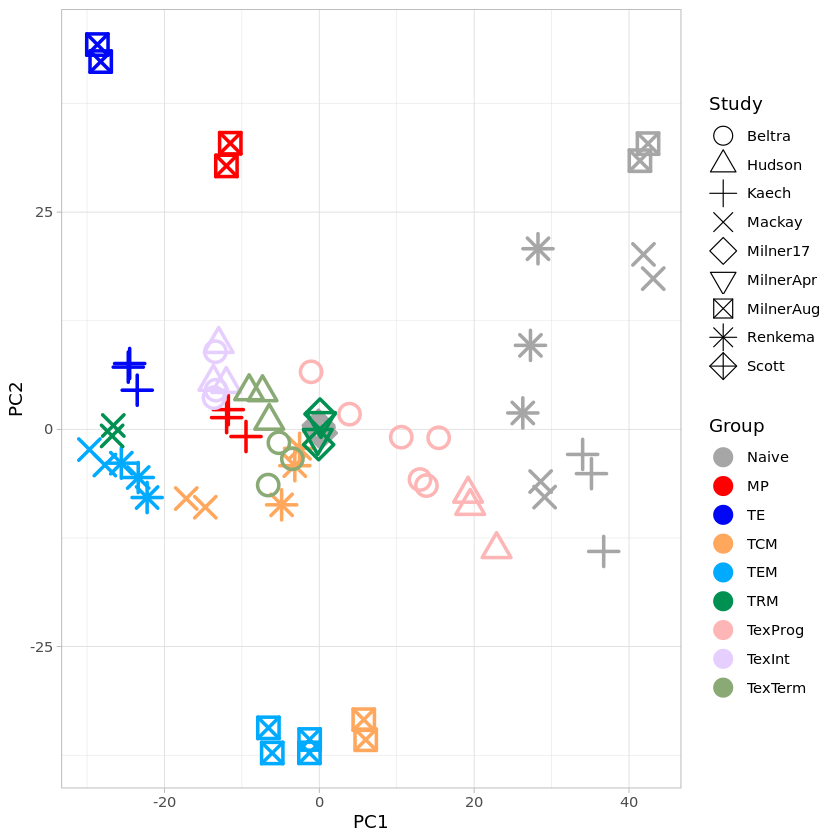

In [493]:
## PCA of normalized RNA-seq read counts in peaks with batch-effect correction
mydata <- as.data.frame(counts_batch_corrected) %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% data.frame %>% mutate(Samples = rownames(.)) %>% 
    mutate(Group = factor(gsub("\\d","",gsub("_.*", "", Samples)), levels = c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm"))) %>% 
    mutate(Study = info[match(rownames(.), rownames(info)),"study"])

myPlot <- ggplot(mydata, aes(x = PC1, y = PC2, colour = Group, shape=Study, stroke=1.5)) + geom_point(size = 5) + scale_color_manual(values = label.color) + 
        theme_light() + scale_shape_manual(values=1:n_study)
myPlot
pdf(paste0("PCA_RNA_counts_",prefix,".pdf"), width = 8, height = 5)
print(myPlot)
dev.off()


Selecting by CV


png 
  2

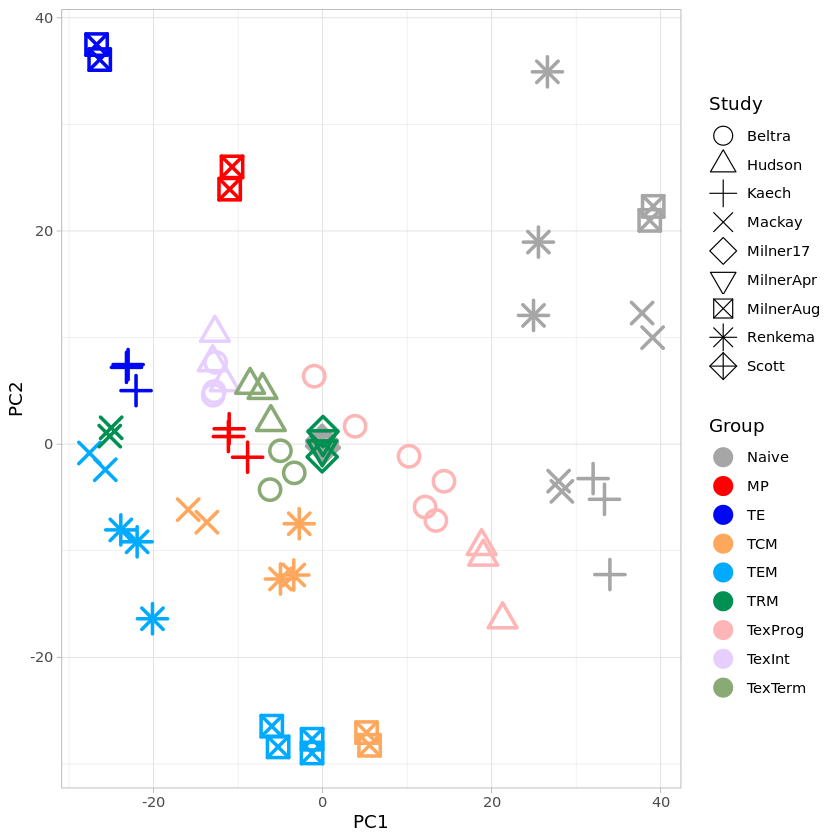

In [494]:
## PCA of library-size normalized ATAC-seq read counts in peaks with batch-effect correction using 10000 most variable peaks 
mydata <- as.data.frame(counts_batch_corrected) %>% 
    dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
    dplyr::top_n(10000) %>%
    dplyr::select(-CV) %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% data.frame %>% mutate(Samples = rownames(.)) %>% 
    mutate(Group = factor(gsub("\\d","",gsub("_.*", "", Samples)), levels = c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm"))) %>% 
    mutate(Study = info[match(rownames(.), rownames(info)),"study"]) %>% 
    na.omit()
myPlot <- ggplot(mydata, aes(x = PC1, y = PC2, colour = Group, shape=Study, stroke = 1.5)) + geom_point(size = 5) + scale_color_manual(values = label.color) + 
        theme_light() + scale_shape_manual(values=1:n_study)
myPlot
pdf(paste0("PCA_RNA_counts_",prefix,"_mv10000.pdf"), width = 5, height = 5)
print(myPlot)
dev.off()

In [495]:
## heatmap using batch correcte values
df <- as.data.frame(counts_batch_corrected) %>% select(info$sample) %>%
    dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
    dplyr::top_n(10000) %>%
    dplyr::select(-CV) %>%
    scaleData

p1 <- pheatmap(df, kmeans_k = 50,
           color = colorRampPalette(rev(brewer.pal(n = 7, name = "YlGnBu")))(100),
           fontsize = 7, show_rownames = F,
           angle_col = 90, show_colnames = F,
           cellwidth = 3, cellheight = 3,
           cluster_cols = T, cluster_rows = T,
           clustering_distance_cols = 'correlation', 
           clustering_distance_rows = 'correlation', 
           clustering_method = 'average',
           # treeheight_row = 0, treeheight_col = 0,
           # cutree_rows = 10, cutree_cols = 1,
           annotation_col = annotation_col,
           annotation_colors = mycolors, 
           border_color = NA,
           filename = paste0("hp_","rna_",prefix,"_mv10000",".pdf"))

Selecting by CV


In [496]:
## heatmap using PCA results
df <- as.data.frame(counts_batch_corrected) %>% select(info$sample) %>%
    dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
    dplyr::top_n(10000) %>%
    dplyr::select(-CV) %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% t %>% data.frame %>% scaleData 

p1 <- pheatmap(df, 
           color = colorRampPalette(rev(brewer.pal(n = 7, name = "YlGnBu")))(100),
           fontsize = 7, show_rownames = F,
           angle_col = 90, show_colnames = F,
           cellwidth = 3, cellheight = 3,
           cluster_cols = T, cluster_rows = T,
           clustering_distance_cols = 'correlation', 
           clustering_distance_rows = 'correlation', 
           clustering_method = 'average',
           # treeheight_row = 0, treeheight_col = 0,
           # cutree_rows = 10, cutree_cols = 1,
           annotation_col = annotation_col,
           annotation_colors = mycolors, 
           border_color = NA,
           filename = paste0("hp_","rna_",prefix,"_PCA",".pdf"))


Selecting by CV


In [497]:
## heatmap using batch correcte values with customized column orders
df <- as.data.frame(counts_batch_corrected) %>% 
    dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
    dplyr::top_n(10000) %>%
    dplyr::select(-CV) %>%
    scaleData
p1 <- pheatmap(df, kmeans_k = 50,
               color = colorRampPalette(rev(brewer.pal(n = 7, name = "YlGnBu")))(100),
               fontsize = 7, show_rownames = F,
               angle_col = 90, show_colnames = F,
               cellwidth = 3, cellheight = 3,
               clustering_distance_cols = 'correlation', 
               clustering_distance_rows = 'correlation', 
               clustering_method = 'average',
               cluster_cols = F, cluster_rows = T,
               # treeheight_row = 0, treeheight_col = 0,
               # cutree_rows = 10, cutree_cols = 1,
               annotation_col = annotation_col,
               annotation_colors = mycolors, 
               border_color = NA,
               filename = paste0("hp_","rna_",prefix,"_mv10000_no_col_cluster",".pdf"))

Selecting by CV


## old results

In [360]:
library(dplyr)
library(ggplot2)

maindir <- '/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/post-analysis/'
label.color <- c("#A6A6A6", "#FF0000", "#0007F4", "#FFA75C", "#00AAFE", "#009051", "#FEB5B5", "#E6CFFF", "#8AAA75")
meta <- read.table("/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/group_file_v2.txt")
setwd(maindir)

In [361]:
# group info
group_sorted <- read.table('../group_file_v3.txt',header = T, row.names = 1)
group_sorted$oldName <- rownames(group_sorted)
rownames(group_sorted) <- group_sorted$newName

In [362]:
## ------------- load rna data ----------------------------------
readRNA <- function(dir){
  
  # read raw file
  fl <- paste0(dir,"/expression_profile.tsv")
  rna <- read.table(fl, check.names = F)
  row.names(rna) <- toupper(rownames(rna))
  row.names(rna) <- gsub("\\(.*","",toupper(rownames(rna))) # remove "(UNKNOWN_TAIJI)"
  rna <- rna[complete.cases(rna),]
  names(rna) <- group_sorted$newName[match(names(rna),group_sorted$oldName)]
  rna <- rna[,rownames(group_sorted)]
  
  # column-wise TPM-normalized
  ## remove columns whose expression values are all zeroes
  rna <- rna[,colSums(rna)>0]
  rna <- 10^6 * as.data.frame(scale(as.matrix(rna), center = F, scale = colSums(as.matrix(rna))))
  # remove rows whose expression levels are all zeroes
  rna <- rna[rowSums(rna)>0,]
  
  return(rna)
}

In [363]:
rna <- readRNA("../")
head(rna)
dim(rna)

,MP_Kaech_Kaech,MP_Kaech_Chung,MP_Kaech_Scott,MP_MilnerAug_Kaech,MP_MilnerAug_Scott,MP_MilnerAug_Chung,Naive_Kaech_Kaech,Naive_Kaech_Chung,Naive_Mackay_Chung,Naive_MilnerAug_Chung,⋯,TexInt_Hudson_Beltra,TexProg1_Beltra_Beltra,TexProg2_Beltra_Beltra,TexProg_Beltra_Chung,TexProg_Hudson_Chung,TexProg_Hudson_Beltra,TexTerm_Beltra_Beltra,TexTerm_Beltra_Chung,TexTerm_Hudson_Chung,TexTerm_Hudson_Beltra
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UBL5,352.503308,352.503308,352.503308,571.169441,571.169441,571.169441,318.260257,318.260257,273.6429488,230.2685458,⋯,304.075608,266.1430207,384.017688,266.1430207,311.717487,311.717487,411.9404487,411.9404487,379.34142520,379.34142520
TTC32,11.090733,11.090733,11.090733,4.990082,4.990082,4.990082,6.980444,6.980444,7.1103365,9.7107821,⋯,9.440485,11.3601289,8.760404,11.3601289,15.780885,15.780885,9.4904711,9.4904711,9.37052925,9.37052925
GM14719,1.430095,1.430095,1.430095,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,⋯,2.440125,0.0000000,29.401354,0.0000000,1.100062,1.100062,0.7700382,0.7700382,1.79010110,1.79010110
1700037H04RIK,28.641894,28.641894,28.641894,23.890395,23.890395,23.890395,24.501560,24.501560,16.5107813,13.6010954,⋯,44.472283,52.6905980,48.162218,52.6905980,55.493113,55.493113,33.5216640,33.5216640,40.03226102,40.03226102
LRP2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,⋯,0.000000,0.0000000,0.000000,0.0000000,0.000000,0.000000,0.0000000,0.0000000,0.00000000,0.00000000
IQCK,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.2500118,0.2500201,⋯,0.000000,0.3700042,0.000000,0.3700042,1.040058,1.040058,0.3600179,0.3600179,0.05000282,0.05000282


[1] 27392    42

In [364]:
colnames(rna)

[1] "MP_Kaech_Kaech"             "MP_Kaech_Chung"            
 [3] "MP_Kaech_Scott"             "MP_MilnerAug_Kaech"        
 [5] "MP_MilnerAug_Scott"         "MP_MilnerAug_Chung"        
 [7] "Naive_Kaech_Kaech"          "Naive_Kaech_Chung"         
 [9] "Naive_Mackay_Chung"         "Naive_MilnerAug_Chung"     
[11] "Naive_Renkema_Chung"        "Naive_Scott_Scott"         
[13] "TCM_Mackay_Chung"           "TCM_MilnerAug_Chung"       
[15] "TCM_Renkema_Chung"          "TEM_Mackay_Chung"          
[17] "TEM_MilnerAug_Chung"        "TEM_Renkema_Chung"         
[19] "TE_Kaech_Kaech"             "TE_Kaech_Chung"            
[21] "TE_Kaech_Scott"             "TE_MilnerAug_Kaech"        
[23] "TE_MilnerAug_Scott"         "TE_MilnerAug_Chung"        
[25] "TRM.IEL_Milner17_Milner17"  "TRM.IEL_MilnerApr_Chung"   
[27] "TRM.IEL_MilnerApr_Milner17" "TRM.IEL_Milner17_Chung"    
[29] "TRM.liver_Mackay_Chung"     "TexInt_Beltra_Beltra"      
[31] "TexInt_Beltra_Chung"        "TexInt_Hudson_Chung"       
[33] "TexInt_Hudson_Beltra"       "TexProg1_Beltra_Beltra"    
[35] "TexProg2_Beltra_Beltra"     "TexProg_Beltra_Chung"      
[37] "TexProg_Hudson_Chung"       "TexProg_Hudson_Beltra"     
[39] "TexTerm_Beltra_Beltra"      "TexTerm_Beltra_Chung"      
[41] "TexTerm_Hudson_Chung"       "TexTerm_Hudson_Beltra"

png 
  2

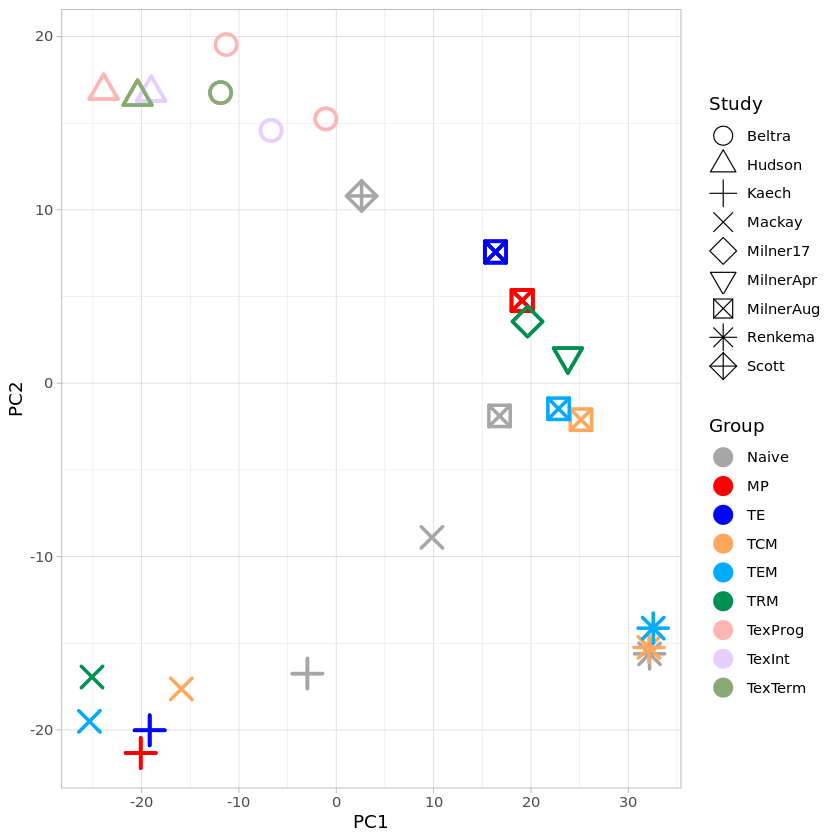

In [366]:
## PCA of library-size normalized ATAC-seq read counts in peaks with batch-effect correction
mydata <- as.data.frame(rna) %>% scaleData %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% data.frame %>% mutate(Samples = rownames(.)) %>% 
    mutate(Group = factor(gsub("\\d","",gsub("\\..*","",gsub("_.*", "", Samples))), levels = c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm"))) %>% 
    mutate(Study = factor(sapply(strsplit(Samples, "_"), "[", 2)))

myPlot <- ggplot(mydata, aes(x = PC1, y = PC2, colour = Group, shape=Study, stroke=1.5)) + geom_point(size = 5) + scale_color_manual(values = label.color) + 
        # scale_shape(solid = FALSE) + 
        scale_shape_manual(values=1:nlevels(mydata$Study)) +
        theme_light() 
myPlot
pdf("PCA_rna_norm_Taiji_output.pdf", width = 8, height = 5)
print(myPlot)
dev.off()

In [386]:
## heatmap using batch correcte values
df <- as.data.frame(rna) %>% 
    dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
    dplyr::top_n(10000) %>%
    dplyr::select(-CV) %>%
    scaleData

info <- read.table("/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/group_file_v3.txt")

# sort df make sure the order of info and data matched
df <- df[,match(info$newName,names(df))]
annotation_col = data.frame(
  group = info$Group
)
rownames(annotation_col) = colnames(df)

# set palette
label.color <- c("#A6A6A6", "#FF0000", "#0007F4", "#FFA75C", "#00AAFE", "#009051", "#FEB5B5", "#E6CFFF", "#8AAA75")
mycolors <- list(Group = label.color)
names(mycolors$Group) <- c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm")

p1 <- pheatmap(df, kmeans_k = 50,
           color = colorRampPalette(rev(brewer.pal(n = 7, name = "YlGnBu")))(100),
           fontsize = 7, show_rownames = F,
           angle_col = 90, show_colnames = F,
           cellwidth = 3, cellheight = 3,
           cluster_cols = T, cluster_rows = T,
           clustering_distance_cols = 'correlation', 
           clustering_distance_rows = 'correlation', 
           clustering_method = 'average',
           # treeheight_row = 0, treeheight_col = 0,
           # cutree_rows = 10, cutree_cols = 1,
           annotation_col = annotation_col,
           annotation_colors = mycolors, 
           border_color = NA,
           filename = paste0("hp_","rna_Taiji_output",".pdf"))

Selecting by CV


## correlation matrix between cell states

In [39]:
library(corrplot)
library(dplyr)
library(RColorBrewer)
# prefix <- "corr_btw_cell_states_based_on_Taiji_output_RNA"
prefix <- "corr_btw_cell_states_based_on_countsFromRNA_batch_corrected_PCA"
source('/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/post-analysis/scripts/function/utils.R')


In [29]:
# read processed data
# counts_batch_corrected <- read.csv("countsFromRNA_batch_corrected_PCA.csv", row.names = 1)
counts_batch_corrected <- readRNA("../")
head(counts_batch_corrected)
dim(counts_batch_corrected)

,MP_MilnerAug_Kaech,MP_MilnerAug_Kaech.1,TE_MilnerAug_Kaech,TE_MilnerAug_Kaech.1,MP_Kaech_Scott,MP_Kaech_Scott.1,MP_Kaech_Scott.2,TE_Kaech_Scott,TE_Kaech_Scott.1,TE_Kaech_Scott.2,⋯,TexInt_Hudson,TexInt_Hudson.1,TexInt_Hudson.2,TexTerm_Hudson,TexTerm_Hudson.1,TexTerm_Hudson.2,Naive_Scott,Naive_Scott.1,Naive_Scott.2,Naive_Scott.3
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UBL5,571.169441,398.09966,434.59019,394.01251,352.503308,378.3664100,392.442498,366.985058,380.5848332,387.6227612,⋯,304.075608,308.695660,299.719886,379.341425,384.68093,408.42056,165.89539,164.856340,140.914061,168.067934
GM38348,0.000000,0.00000,0.00000,0.00000,0.000000,0.0000000,0.000000,0.000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000
E330014E10RIK,0.000000,0.00000,0.00000,0.00000,0.000000,0.0000000,0.000000,0.000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000
TTC32,4.990082,23.20056,13.09061,13.11042,11.090733,11.4608000,10.180843,8.770599,9.7806382,6.3703741,⋯,9.440485,10.090512,12.250813,9.370529,14.10077,13.47068,8.94029,7.680295,6.750195,9.660456
GM14719,0.000000,0.00000,0.00000,12.39039,1.430095,0.9900691,2.490206,0.000000,0.9800639,0.5000294,⋯,2.440125,1.590081,1.790119,1.790101,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000
1700037H04RIK,23.890395,31.52076,28.09130,36.15115,28.641894,20.8814575,22.841892,22.561541,24.1215739,21.8712843,⋯,44.472283,43.442204,42.292806,40.032261,42.71232,37.78190,39.28128,39.111504,38.431108,41.311950


[1] 35595   123

In [314]:
# counts_batch_corrected <- counts(dds)
# counts_batch_corrected <- readRNA("../")
# head(counts_batch_corrected)
# dim(counts_batch_corrected)


,MP_MilnerAug_Kaech,MP_MilnerAug_Kaech.1,TE_MilnerAug_Kaech,TE_MilnerAug_Kaech.1,MP_Kaech_Scott,MP_Kaech_Scott.1,MP_Kaech_Scott.2,TE_Kaech_Scott,TE_Kaech_Scott.1,TE_Kaech_Scott.2,⋯,TexInt_Hudson,TexInt_Hudson.1,TexInt_Hudson.2,TexTerm_Hudson,TexTerm_Hudson.1,TexTerm_Hudson.2,Naive_Scott,Naive_Scott.1,Naive_Scott.2,Naive_Scott.3
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
UBL5,571.169441,398.09966,434.59019,394.01251,352.503308,378.3664100,392.442498,366.985058,380.5848332,387.6227612,⋯,304.075608,308.695660,299.719886,379.341425,384.68093,408.42056,165.89539,164.856340,140.914061,168.067934
GM38348,0.000000,0.00000,0.00000,0.00000,0.000000,0.0000000,0.000000,0.000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000
E330014E10RIK,0.000000,0.00000,0.00000,0.00000,0.000000,0.0000000,0.000000,0.000000,0.0000000,0.0000000,⋯,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000
TTC32,4.990082,23.20056,13.09061,13.11042,11.090733,11.4608000,10.180843,8.770599,9.7806382,6.3703741,⋯,9.440485,10.090512,12.250813,9.370529,14.10077,13.47068,8.94029,7.680295,6.750195,9.660456
GM14719,0.000000,0.00000,0.00000,12.39039,1.430095,0.9900691,2.490206,0.000000,0.9800639,0.5000294,⋯,2.440125,1.590081,1.790119,1.790101,0.00000,0.00000,0.00000,0.000000,0.000000,0.000000
1700037H04RIK,23.890395,31.52076,28.09130,36.15115,28.641894,20.8814575,22.841892,22.561541,24.1215739,21.8712843,⋯,44.472283,43.442204,42.292806,40.032261,42.71232,37.78190,39.28128,39.111504,38.431108,41.311950


[1] 35595   123

In [31]:
meta <- read.table("/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/group_file_v3.txt")
df <- counts_batch_corrected
info <- data.frame(sample = colnames(df),group=gsub("\\d","",gsub("_.*","",colnames(df))), row.names = colnames(df)) %>%
        dplyr::mutate(study=meta[match(gsub("_RNA.*","",colnames(df)),rownames(meta)),"RNASource"]) %>%
        na.omit()

In [32]:
# # 10k most variable peaks
# df <- as.data.frame(counts_batch_corrected) %>% select(info$sample) %>%
#     dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
#     dplyr::top_n(10000) %>%
#     dplyr::select(-CV) %>%
#     scaleData

Selecting by CV


In [ ]:
# df <- as.data.frame(counts_batch_corrected) %>% select(info$sample)

df <- as.data.frame(counts_batch_corrected) %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% t %>% data.frame 
head(df)
dim(df)
# write.csv(df,"countsFromRNA_batch_corrected_PCA.csv")

Selecting by CV


,MP_Kaech_1_RNA_rep1,MP_Kaech_1_RNA_rep2,MP_Kaech_1_RNA_rep3,MP_Milner_1_RNA_rep1,MP_Milner_1_RNA_rep2,Naive_Kaech_1_RNA_rep1,Naive_Kaech_1_RNA_rep2,Naive_Kaech_1_RNA_rep3,Naive_Mackay_RNA_rep1,Naive_Mackay_RNA_rep2,⋯,TexTerm_Beltra_RNA_rep3,TexTerm_Hudson_RNA_rep1,TexTerm_Hudson_RNA_rep2,TexTerm_Hudson_RNA_rep3,TRM_IEL_1_RNA_rep1,TRM_IEL_1_RNA_rep2,TRM_IEL_2_RNA_rep1,TRM_IEL_2_RNA_rep2,TRM_liver_RNA_rep1,TRM_liver_RNA_rep2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PC4,0.5215493,0.5206191,0.5213072,0.5005596,0.4955530,0.5331020,0.5327636,0.5202726,0.4806941,0.4907900,⋯,0.5207107,0.5188423,0.5200829,0.5116874,0.5176170,0.5185447,0.5219292,0.5142325,0.5073197,0.5111386
PC50,0.5945600,0.5922187,0.6466858,0.5353607,0.5272162,0.5345216,0.5354531,0.5282920,0.5250486,0.5520773,⋯,0.5107193,0.3527691,0.6542806,0.5989938,0.5243470,0.5270490,0.5309540,0.5204420,0.0000000,1.0000000
PC7,0.5178188,0.5198377,0.5190498,0.5272961,0.5316854,0.5294795,0.5321394,0.5413196,0.5399922,0.5341672,⋯,0.5251374,0.5229888,0.5239367,0.5224832,0.5227790,0.5250990,0.5244659,0.5234122,0.5170165,0.5173410
PC11,0.4613902,0.4845073,0.4734646,0.6811962,0.7077731,0.6438248,0.6871534,0.8043261,0.9239146,0.8166595,⋯,0.3972810,0.3970691,0.3790374,0.4460931,0.5169427,0.5707966,0.5378075,0.5499318,0.5134711,0.4637163
PC8,0.4156701,0.4137453,0.4141501,0.4116108,0.4096794,0.4178957,0.4155496,0.4150742,0.3856923,0.3949508,⋯,0.4163094,0.4128346,0.4128069,0.4067465,0.4146543,0.4122750,0.4140772,0.4128520,0.4024008,0.4014257
PC19,0.4635068,0.4827799,0.4629716,0.5943883,0.5679296,0.6121418,0.5809506,0.4379106,0.5209454,0.5864905,⋯,0.5666165,0.4984478,0.5165413,0.4807373,0.7057948,0.3073032,0.4923434,0.5207545,0.4470682,0.4559939


[1] 69 69

In [33]:
head(df)
dim(df)
# write.csv(df,"countsFromRNA_batch_corrected_PCA.csv")

,MP_MilnerAug_Kaech,TE_MilnerAug_Kaech,MP_Kaech_Scott,TE_Kaech_Scott,TRM_IEL_4,TRM_IEL_3,TexProg_Beltra_Chung,TexInt_Beltra_Chung,TexTerm_Beltra_Chung,TexProg_Hudson_Beltra,⋯,TEM_Renkema,Naive_Renkema,TexProg1_Beltra,TexProg2_Beltra,TexInt_Beltra,TexTerm_Beltra,TexProg_Hudson,TexInt_Hudson,TexTerm_Hudson,Naive_Scott
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
GM28502,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
C330018A13RIK,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
GM13391,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
GM11804,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
GM11702,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,1
RP24-365I5.1,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


[1] 10000    42

In [25]:
df <- read.csv("countsFromRNA_batch_corrected_PCA.csv", row.names = 1)
head(df)

,MP_Kaech_1_RNA_rep1,MP_Kaech_1_RNA_rep2,MP_Kaech_1_RNA_rep3,MP_Milner_1_RNA_rep1,MP_Milner_1_RNA_rep2,Naive_Kaech_1_RNA_rep1,Naive_Kaech_1_RNA_rep2,Naive_Kaech_1_RNA_rep3,Naive_Mackay_RNA_rep1,Naive_Mackay_RNA_rep2,⋯,TexTerm_Beltra_RNA_rep3,TexTerm_Hudson_RNA_rep1,TexTerm_Hudson_RNA_rep2,TexTerm_Hudson_RNA_rep3,TRM_IEL_1_RNA_rep1,TRM_IEL_1_RNA_rep2,TRM_IEL_2_RNA_rep1,TRM_IEL_2_RNA_rep2,TRM_liver_RNA_rep1,TRM_liver_RNA_rep2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PC1,-11.7535286,-9.4698710,-11.9725689,-12.000483,-11.501801,34.0095259,35.147254,36.7284801,29.098752,28.583583,⋯,-3.4838350,-7.33779206,-6.4677996,-9.06686283,0.08725233,-0.08725233,0.20327149,-0.20327149,-26.6085069,-26.7620338
PC2,2.2697175,-0.8259670,1.3504770,30.320243,32.930603,-2.8848664,-5.099184,-14.0531832,-7.797560,-6.009971,⋯,-3.3872042,4.25357890,0.9725601,4.36609756,1.76112303,-1.76112303,0.97169387,-0.97169387,0.4444236,-0.7548758
PC3,-2.4170270,-1.9974741,-2.4127608,4.875535,5.317174,7.4339067,7.439362,10.8517982,5.443360,4.353803,⋯,-4.0671114,-5.15512375,-5.5502585,-5.16545455,0.49964066,-0.49964066,0.70625097,-0.70625097,-6.1101978,-7.4383980
PC4,0.4031114,0.2950038,0.3749646,-2.036339,-2.618212,1.7457735,1.706447,0.2547299,-4.345136,-3.171780,⋯,0.3056383,0.08849807,0.2326850,-0.74305802,-0.05391025,0.05391025,0.44726215,-0.44726215,-1.2506778,-0.8068391
PC5,-0.3813639,-0.6292808,-0.2625790,3.451892,3.912376,0.4065548,1.604930,0.5474507,1.279992,0.812271,⋯,-0.6941074,-0.07577922,-0.4950496,-0.03999446,-0.03594967,0.03594967,0.09390786,-0.09390786,-0.9540152,-1.2971847
PC6,1.0430467,0.7334835,0.9683142,-1.339048,-1.173538,-1.9540571,-2.673032,-3.2014819,-3.027455,-2.218890,⋯,0.2661887,0.40432497,0.2942961,0.19931546,-0.18893101,0.18893101,-0.25552054,0.25552054,0.5716790,0.8079694


In [37]:
subsets <- c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm")
df2 <- do.call("cbind", lapply(paste0(subsets,"_"), function(x) df %>% select(contains(x)) %>% rowMeans())) %>% as.data.frame
names(df2) <- subsets

head(df2)
dim(df2)
                               

,Naive,MP,TE,TCM,TEM,TRM,TexProg,TexInt,TexTerm
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PC1,3.1473649,-1.7996302,-2.95771829,6.8757401,5.6567589,-3.426756,-0.9363778,-0.8576150,-0.79670106
PC2,0.1798080,0.8337502,-8.73444044,0.5042121,0.4641896,8.407148,0.1787363,0.1444636,0.09862419
PC3,-0.5453920,-6.1821328,4.58005928,0.4509691,0.1756321,6.116311,-1.8863733,-1.3643436,-1.49718638
PC4,-0.7138728,6.5497436,1.06539298,-0.3756858,-0.8378130,-4.219968,-1.6843336,-1.1398323,-1.33088972
PC5,1.6072322,-2.8350167,-0.64509431,1.9107757,2.0570308,-6.680301,3.5069861,2.2730971,2.46741746
PC6,-1.4524048,0.1649095,0.01674351,3.0348306,4.0298112,3.556907,-3.3742880,-2.0633479,-2.20789507


[1] 42  9

In [42]:
res <- cor(df2, method = "pearson")
res

,Naive,MP,TE,TCM,TEM,TRM,TexProg,TexInt,TexTerm
Naive,1.000000000,-0.1844318,-0.1999147,-0.006832282,-0.01481666,-0.2148538,-0.105023308,-0.064270368,-0.096760226
MP,-0.184431777,1.0000000,-0.1932348,-0.149140904,-0.17319855,-0.2015868,-0.129043462,-0.146289793,-0.119322658
TE,-0.199914696,-0.1932348,1.0000000,-0.192729888,-0.16857851,-0.2160673,-0.134004571,-0.126319066,-0.117541780
TCM,-0.006832282,-0.1491409,-0.1927299,1.000000000,0.13531759,-0.1557259,-0.114512565,-0.043579984,-0.122902130
TEM,-0.014816664,-0.1731985,-0.1685785,0.135317594,1.00000000,-0.1216804,-0.108105311,-0.112196796,-0.120481586
TRM,-0.214853841,-0.2015868,-0.2160673,-0.155725915,-0.12168038,1.0000000,-0.156279825,-0.148266721,-0.156205376
TexProg,-0.105023308,-0.1290435,-0.1340046,-0.114512565,-0.10810531,-0.1562798,1.000000000,0.008638946,0.002428078
TexInt,-0.064270368,-0.1462898,-0.1263191,-0.043579984,-0.11219680,-0.1482667,0.008638946,1.000000000,0.085916813
TexTerm,-0.096760226,-0.1193227,-0.1175418,-0.122902130,-0.12048159,-0.1562054,0.002428078,0.085916813,1.000000000


In [504]:
# write.csv(res, "corr_btw_cell_states_based_on_countsFromRNA_batch_corrected_PCA.csv")
write.csv(res, paste0(prefix,".csv"))

In [5]:
res <- read.csv(paste0(prefix,".csv"), row.names = 1) %>% as.matrix()
res

,Naive,MP,TE,TCM,TEM,TRM,TexProg,TexInt,TexTerm
Naive,1.00000000,-0.40484585,-0.55461983,-0.37120626,-0.61153763,-0.60183606,0.27179366,-0.33694810,-0.08859254
MP,-0.40484585,1.00000000,0.55858270,-0.13080592,-0.17987166,0.33952403,-0.15377913,0.12467854,-0.01108358
TE,-0.55461983,0.55858270,1.00000000,-0.16714721,-0.01762996,0.37968891,-0.44929830,0.57049153,0.04363345
TCM,-0.37120626,-0.13080592,-0.16714721,1.00000000,0.02234287,0.01318469,0.12606485,-0.03468349,-0.12045463
TEM,-0.61153763,-0.17987166,-0.01762996,0.02234287,1.00000000,0.25952998,-0.05466539,0.12460874,0.06637739
TRM,-0.60183606,0.33952403,0.37968891,0.01318469,0.25952998,1.00000000,-0.36135966,0.02421023,0.48124140
TexProg,0.27179366,-0.15377913,-0.44929830,0.12606485,-0.05466539,-0.36135966,1.00000000,-0.56819766,-0.52525826
TexInt,-0.33694810,0.12467854,0.57049153,-0.03468349,0.12460874,0.02421023,-0.56819766,1.00000000,-0.08897340
TexTerm,-0.08859254,-0.01108358,0.04363345,-0.12045463,0.06637739,0.48124140,-0.52525826,-0.08897340,1.00000000


png 
  2

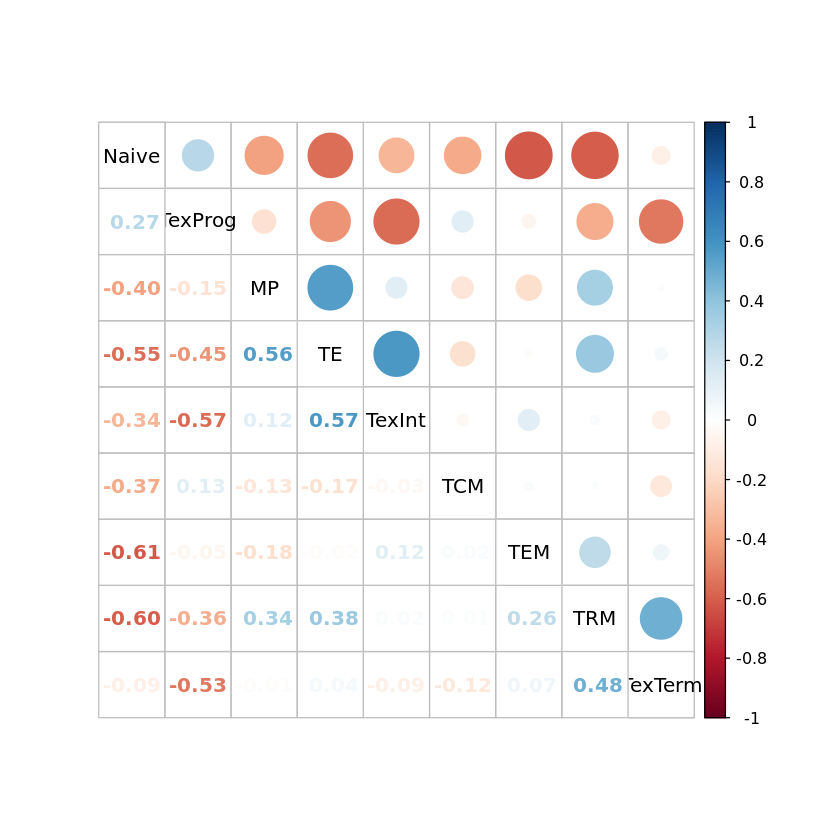

In [506]:
pdf(paste0(prefix,".pdf"))
# corrplot(res, type = "upper", order = "hclust", tl.col = "black", tl.srt = 45)
# corrplot.mixed(res, order = "hclust", tl.col = "black", tl.srt = 45)
corrplot.mixed(res, tl.col = "black", tl.srt = 45, 
               lower.col = colorRampPalette(rev(brewer.pal(n = 11, name ="RdBu")))(100),
               upper.col = colorRampPalette(rev(brewer.pal(n = 11, name ="RdBu")))(100))
dev.off()

corrplot.mixed(res, order = "hclust", tl.col = "black", tl.srt = 45)

In [43]:
pdf(paste0(prefix,"_v2.pdf"))
corrplot.mixed(res, tl.col = "black", tl.srt = 45, 
               lower.col = colorRampPalette(rev(brewer.pal(n = 11, name ="RdBu")))(100),
               upper.col = colorRampPalette(rev(brewer.pal(n = 11, name ="RdBu")))(100))
dev.off()

png 
  2

In [456]:
pdf(paste0(prefix,"_hclust_order.pdf"))
corrplot.mixed(res, tl.col = "black", tl.srt = 45, order = "hclust", 
               lower.col = colorRampPalette(rev(brewer.pal(n = 11, name ="RdBu")))(100),
               upper.col = colorRampPalette(rev(brewer.pal(n = 11, name ="RdBu")))(100))
dev.off()

png 
  2

png 
  2

,Naive,TRM,TexTerm
,<dbl>,<dbl>,<dbl>
PC1,27.210988285,-8.3810505,-5.5839818
PC2,-6.631572727,1.0492608,0.9948279
PC3,3.059276029,0.9572320,4.0622592
PC4,-1.672197455,0.1257130,-1.0149273
PC5,-0.007072552,0.2395560,0.6308604
PC6,-1.223150311,-0.4341734,-0.5276005


[1] 78  3

,Naive,TRM,TexTerm
Naive,1.0000000,-0.6027351,-0.1071760
TRM,-0.6027351,1.0000000,0.4982146
TexTerm,-0.1071760,0.4982146,1.0000000


png 
  2

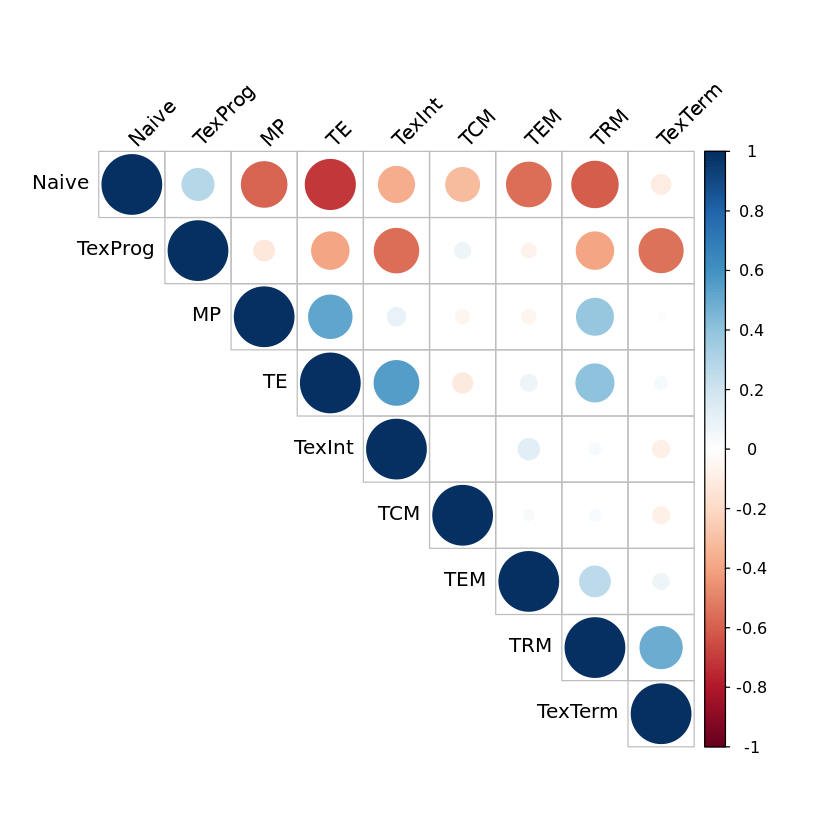

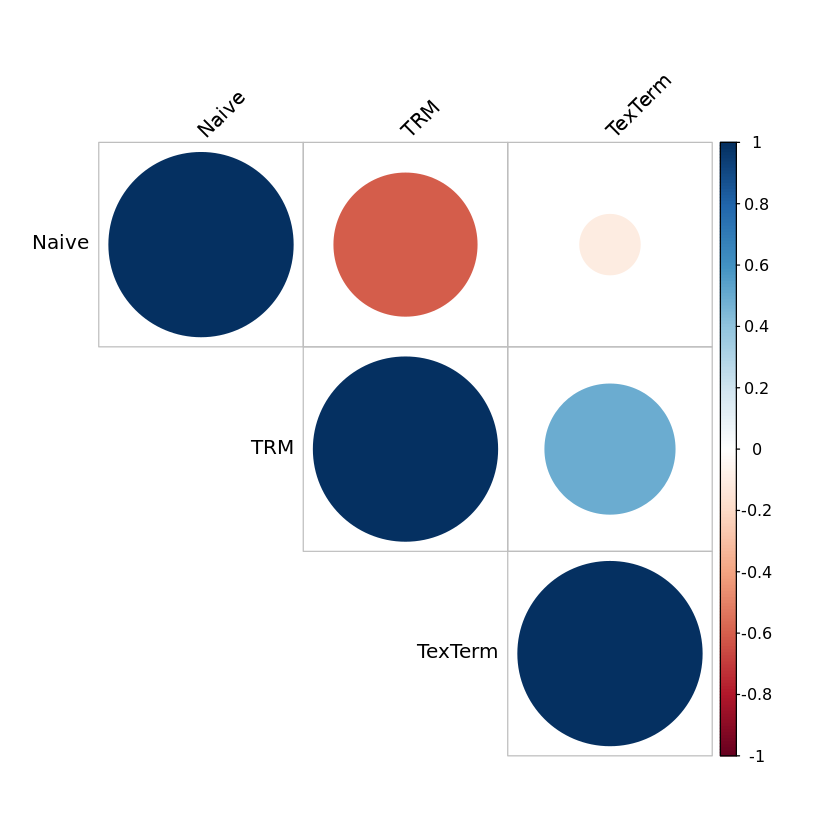

In [289]:
# only show Naive, TexTerm and TRM correlation
df3 <- df2 %>% select(Naive, TRM, TexTerm)
head(df3)
dim(df3)

res2 <- cor(df3, method = "pearson")
res2

pdf("corr_btw_3_cell_states_based_on_countsFromRNA_batch_corrected_PCA.pdf")
corrplot(res2, type = "upper", order = "hclust", 
         tl.col = "black", tl.srt = 45)
dev.off()
corrplot(res2, type = "upper", order = "hclust", 
         tl.col = "black", tl.srt = 45)

In [23]:
# calculate p-value
res2 <-Hmisc::rcorr(as.matrix(df2))
res2

        Naive   MP   TE  TCM  TEM  TRM TexProg TexInt TexTerm
Naive    1.00 0.56 0.55 0.78 0.69 0.60    0.70   0.64    0.68
MP       0.56 1.00 0.74 0.66 0.65 0.52    0.52   0.58    0.63
TE       0.55 0.74 1.00 0.64 0.69 0.55    0.47   0.61    0.63
TCM      0.78 0.66 0.64 1.00 0.87 0.76    0.66   0.71    0.74
TEM      0.69 0.65 0.69 0.87 1.00 0.74    0.61   0.70    0.73
TRM      0.60 0.52 0.55 0.76 0.74 1.00    0.61   0.69    0.75
TexProg  0.70 0.52 0.47 0.66 0.61 0.61    1.00   0.69    0.74
TexInt   0.64 0.58 0.61 0.71 0.70 0.69    0.69   1.00    0.81
TexTerm  0.68 0.63 0.63 0.74 0.73 0.75    0.74   0.81    1.00

n= 69 


P
        Naive MP TE TCM TEM TRM TexProg TexInt TexTerm
Naive          0  0  0   0   0   0       0      0     
MP       0        0  0   0   0   0       0      0     
TE       0     0     0   0   0   0       0      0     
TCM      0     0  0      0   0   0       0      0     
TEM      0     0  0  0       0   0       0      0     
TRM      0     0  0  0   0       0    

In [24]:
cor.matrix2 <- res2

# find cells with p-values > 0.05 and replace corresponding
# correlations coefficients with zero
cor.matrix2$r[cor.matrix2$p > 0.05] <- 0

# use this matrix for corrplot
pdf(paste0(prefix,"_pvalue_0.05_v2.pdf"))
corrplot.mixed(cor.matrix2$r, tl.col = "black", tl.srt = 45)
dev.off()

png 
  2

## no Naive sample version

,MP_Kaech_1_RNA_rep1,MP_Kaech_1_RNA_rep2,MP_Kaech_1_RNA_rep3,MP_Kaech_2_RNA_rep1,MP_Kaech_2_RNA_rep2,MP_Kaech_2_RNA_rep3,MP_Milner_1_RNA_rep1,MP_Milner_1_RNA_rep2,Naive_Kaech_1_RNA_rep1,Naive_Kaech_1_RNA_rep2,⋯,TexTerm_Beltra_RNA_rep3,TexTerm_Hudson_RNA_rep1,TexTerm_Hudson_RNA_rep2,TexTerm_Hudson_RNA_rep3,TRM_IEL_1_RNA_rep1,TRM_IEL_1_RNA_rep2,TRM_IEL_2_RNA_rep1,TRM_IEL_2_RNA_rep2,TRM_liver_RNA_rep1,TRM_liver_RNA_rep2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSMUSG00000000001.4,9.410758,9.365654,9.358636,9.410758,9.365654,9.358636,10.429739,10.590616,9.580878,9.517408,⋯,9.378406,9.421315,9.293681,9.338191,9.606262,9.441092,9.387500,9.659854,9.279678,9.275282
ENSMUSG00000000003.14,5.364570,5.364570,5.364570,5.364570,5.364570,5.364570,5.364570,5.364570,5.364570,5.364570,⋯,5.364570,5.364570,5.364570,5.364570,5.364570,5.364570,5.364570,5.364570,5.364570,5.364570
ENSMUSG00000000028.13,6.775582,6.589703,6.713401,6.775582,6.589703,6.713401,6.911273,6.880443,6.624151,6.737931,⋯,6.050177,6.721538,6.139129,6.815804,6.359392,6.984995,6.666035,6.678352,7.041504,6.855928
ENSMUSG00000000031.14,5.365867,5.365867,5.365867,5.365867,5.365867,5.365867,5.365867,5.365867,5.365867,5.365867,⋯,5.365867,5.365867,5.365867,5.365867,5.365867,5.365867,5.365867,5.365867,5.470943,5.354192
ENSMUSG00000000037.15,5.430488,5.384126,5.282095,5.430488,5.384126,5.282095,5.401485,5.401485,6.017967,5.282095,⋯,5.325599,5.316997,5.316997,5.767193,5.401485,5.401485,5.401485,5.401485,5.425173,5.447300
ENSMUSG00000000049.10,5.351663,5.351663,5.351663,5.351663,5.351663,5.351663,5.397904,5.397904,5.767831,5.351663,⋯,5.379541,5.292777,5.292777,5.292777,5.397904,5.397904,5.397904,5.397904,5.462092,5.536844


[1] 41916    78

Selecting by CV


png 
  2

png 
  2

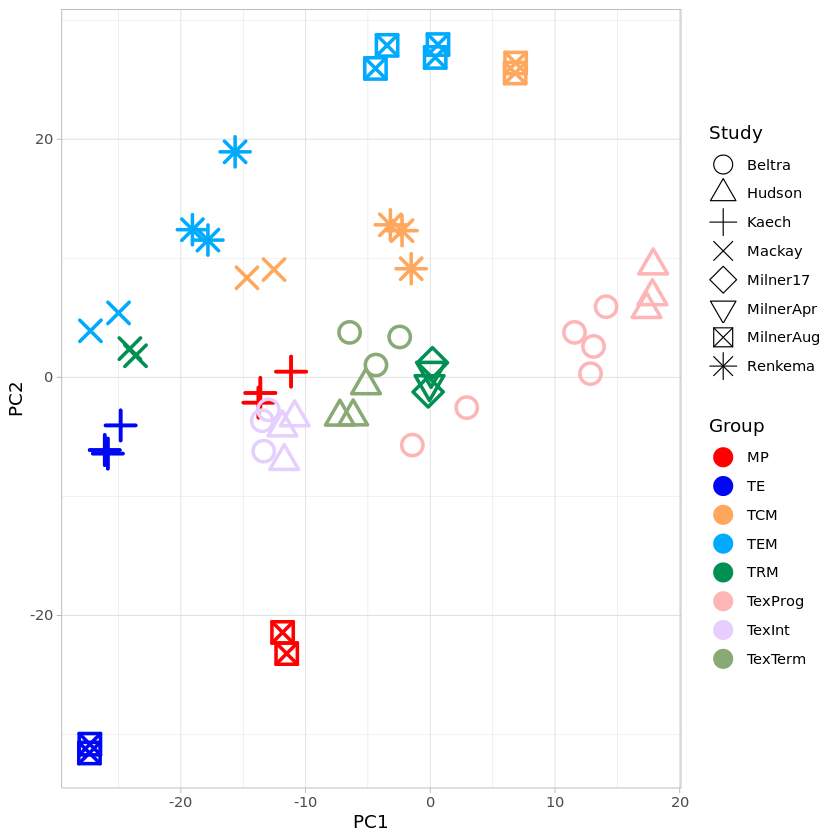

In [457]:
# read processed data
counts_batch_corrected <- read.csv("countsFromRNA_batch_corrected.csv", row.names = 1)
head(counts_batch_corrected)
dim(counts_batch_corrected)

meta <- read.table("/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/group_file_v3_no_Naive.txt")
df <- counts_batch_corrected
info <- data.frame(sample = colnames(df),group=gsub("\\d","",gsub("_.*","",colnames(df))), row.names = colnames(df)) %>%
        dplyr::mutate(study=meta[match(gsub("_RNA.*","",colnames(df)),rownames(meta)),"RNASource"]) %>%
        na.omit()
# sort df make sure the order of info and data matched
df <- df[,match(rownames(info),names(df))]
annotation_col = data.frame(
  group = info$group,
  study = info$study
)
rownames(annotation_col) = names(df)

# set palette
n_study = length(unique(info$study))
subsets <- c("MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm")
label.color <- c("#FF0000", "#0007F4", "#FFA75C", "#00AAFE", "#009051", "#FEB5B5", "#E6CFFF", "#8AAA75")
mycolors <- list(group = label.color, study = RColorBrewer::brewer.pal(n_study,"Set1")[1:n_study])
names(mycolors$group) <- subsets
names(mycolors$study) <- unique(info$study)

## PCA of library-size normalized ATAC-seq read counts in peaks with batch-effect correction using 10000 most variable peaks 
mydata <- as.data.frame(counts_batch_corrected) %>% 
    dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
    dplyr::top_n(10000) %>%
    dplyr::select(-CV) %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% data.frame %>% mutate(Samples = rownames(.)) %>% 
    mutate(Group = factor(gsub("\\d","",gsub("_.*", "", Samples)), levels = subsets)) %>% 
    mutate(Study = info[match(rownames(.), rownames(info)),"study"]) %>% 
    na.omit()
myPlot <- ggplot(mydata, aes(x = PC1, y = PC2, colour = Group, shape=Study, stroke = 1.5)) + geom_point(size = 5) + scale_color_manual(values = label.color) + 
        theme_light() + scale_shape_manual(values=1:n_study)
myPlot
pdf("PCA_lib_norm_RNA_counts_batch_corrected_mv10000_Hayward_removed_Naive_removed.pdf", width = 5, height = 5)
print(myPlot)
dev.off()

# df <- as.data.frame(counts_batch_corrected) %>% select(info$sample) %>%
#     dplyr::mutate(CV = co.var(as.matrix(.))) %>% dplyr::arrange(-CV) %>%
#     dplyr::top_n(10000) %>%
#     dplyr::select(-CV) %>%
#     scaleData
df <- as.data.frame(counts_batch_corrected) %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% t %>% data.frame 

df2 <- do.call("cbind", lapply(paste0(subsets,"_"), function(x) df %>% select(contains(x)) %>% rowMeans())) %>% as.data.frame
names(df2) <- subsets

res <- cor(df2, method = "pearson")
# prefix <- "corr_btw_cell_states_based_on_countsFromRNA_batch_corrected_no_Naive"
prefix <- "corr_btw_cell_states_based_on_countsFromRNA_batch_corrected_PCA_no_Naive"
                               
pdf(paste0(prefix,".pdf"))
corrplot.mixed(res, tl.col = "black", tl.srt = 45, 
               lower.col = colorRampPalette(rev(brewer.pal(n = 11, name ="RdBu")))(100),
               upper.col = colorRampPalette(rev(brewer.pal(n = 11, name ="RdBu")))(100))
dev.off()


## prepare for Taiji run

In [507]:
counts_batch_corrected <- read.csv("countsFromRNA_batch_corrected.csv", row.names = 1)
head(counts_batch_corrected)
dim(counts_batch_corrected)

,MP_Kaech_1_RNA_rep1,MP_Kaech_1_RNA_rep2,MP_Kaech_1_RNA_rep3,MP_Milner_1_RNA_rep1,MP_Milner_1_RNA_rep2,Naive_Kaech_1_RNA_rep1,Naive_Kaech_1_RNA_rep2,Naive_Kaech_1_RNA_rep3,Naive_Mackay_RNA_rep1,Naive_Mackay_RNA_rep2,⋯,TexTerm_Beltra_RNA_rep3,TexTerm_Hudson_RNA_rep1,TexTerm_Hudson_RNA_rep2,TexTerm_Hudson_RNA_rep3,TRM_IEL_1_RNA_rep1,TRM_IEL_1_RNA_rep2,TRM_IEL_2_RNA_rep1,TRM_IEL_2_RNA_rep2,TRM_liver_RNA_rep1,TRM_liver_RNA_rep2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSMUSG00000000001.4,9.081818,9.038332,9.039626,10.125208,10.278872,9.256898,9.197754,9.572627,9.731909,9.504936,⋯,9.044327,9.097146,8.970981,9.022842,9.277536,9.123472,9.062163,9.338845,8.966225,8.957398
ENSMUSG00000000003.14,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,⋯,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111,4.973111
ENSMUSG00000000028.13,6.414839,6.225612,6.354439,6.563030,6.527068,6.261398,6.379093,5.736870,6.394415,6.146541,⋯,5.672649,6.362647,5.768063,6.464164,5.989108,6.632354,6.303998,6.317463,6.692705,6.500778
ENSMUSG00000000031.14,4.974448,4.974448,4.974448,4.974448,4.974448,4.974448,4.974448,4.974448,4.962412,4.962412,⋯,4.974448,4.974448,4.974448,4.974448,4.974448,4.974448,4.974448,4.974448,5.082768,4.962412
ENSMUSG00000000037.15,5.040492,4.993169,4.888779,5.010978,5.010978,5.641940,4.888779,4.888779,4.957163,5.223369,⋯,4.933141,4.924025,4.924025,5.388213,5.010978,5.010978,5.010978,5.010978,5.035595,5.058211
ENSMUSG00000000049.10,4.960022,4.960022,4.960022,5.007136,5.007136,5.384048,4.960022,4.960022,4.981144,4.981144,⋯,4.988424,4.899671,4.899671,4.899671,5.007136,5.007136,5.007136,5.007136,5.072943,5.149261


[1] 46517    69

In [508]:
# write to individual tsv file
output_dir <- "/new-stg/home/cong/Taiji/mouse_immune/mouse11_batch_correction/input/RNA/"
write_to_tsv <- function(x){
    write.table(counts_batch_corrected[,x,drop=F],paste0(output_dir,x,"_gene_count_batch_corrected.tsv"), sep = "\t", col.names = F, row.names = T, quote = F)
}
tmp <- lapply(colnames(counts_batch_corrected), write_to_tsv)

# PageRank analysis

In [13]:
library(dplyr)
library(ggplot2)

In [2]:
maindir <- '/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/post-analysis/'
label.color <- c("#A6A6A6", "#FF0000", "#0007F4", "#FFA75C", "#00AAFE", "#009051", "#FEB5B5", "#E6CFFF", "#8AAA75")
meta <- read.table("/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/group_file_v2.txt")
setwd(maindir)

In [3]:
##load pagerank data -------------------------
load_pr <- function(dir,samples=NULL){
  fl <- paste0(dir,"/GeneRanks.tsv")
  df <- read.table(fl, check.names = F)
  df <- df[!rownames(df) %in% c("DNMT1"),]
  
  # some samples have zero expression value for all genes and need to be removed (optional)
  # some samples have small ATAC-seq peaks so pagerank is abnormal
  if (!is.null(samples)){
      df <- df[,colnames(df) %in% samples]
  }
  return(df)
}

In [19]:
pr <- load_pr("../")
head(pr)
dim(pr)

,MP_Kaech_1,MP_Kaech_2,MP_Kaech_Scott,MP_MilnerAug_Kaech,MP_Milner_1,MP_Milner_2,Naive_Kaech_1,Naive_Kaech_2,Naive_Mackay,Naive_Milner,⋯,TexInt_Hudson_Beltra,TexProg1_Beltra,TexProg2_Beltra,TexProg_Beltra_Chung,TexProg_Hudson,TexProg_Hudson_Beltra,TexTerm_Beltra,TexTerm_Beltra_Chung,TexTerm_Hudson,TexTerm_Hudson_Beltra
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A1JVI6_MOUSE,1.743363e-05,1.590130e-05,1.632352e-05,2.833449e-05,2.753706e-05,2.696602e-05,1.406090e-05,1.430092e-05,1.474380e-05,2.424502e-05,⋯,1.902838e-05,2.212431e-05,1.577385e-05,1.776055e-05,1.233983e-05,1.367642e-05,1.829773e-05,1.680193e-05,1.520235e-05,1.719065e-05
AC168977.1,2.745684e-05,2.807896e-05,2.735401e-05,4.280141e-05,4.438573e-05,4.751869e-05,2.710335e-05,2.632160e-05,3.101453e-05,4.035374e-05,⋯,3.014331e-05,3.529587e-05,2.499500e-05,3.645994e-05,2.920729e-05,2.645316e-05,2.814929e-05,3.518513e-05,3.475241e-05,2.810355e-05
AHCTF1,5.043222e-04,9.480273e-04,9.220975e-04,4.999642e-04,8.608218e-04,9.062349e-04,7.807736e-04,8.841321e-04,5.910293e-04,9.677488e-04,⋯,6.958953e-04,5.911604e-04,5.424723e-04,6.284314e-04,8.639897e-04,8.951078e-04,7.546013e-04,5.551366e-04,5.206544e-04,6.968129e-04
AHR,4.138006e-05,4.298173e-05,4.717880e-05,3.687323e-05,3.671176e-05,3.464032e-05,1.288587e-04,9.691289e-05,2.625724e-04,5.742149e-05,⋯,1.243281e-04,7.332773e-05,2.730769e-05,6.815644e-05,4.986606e-05,6.591696e-05,9.320678e-05,8.416547e-05,2.795569e-04,3.058129e-04
AIRE,2.025737e-05,2.954804e-05,2.020970e-05,2.951485e-05,3.172337e-05,4.952691e-05,2.168207e-05,1.933359e-05,2.280149e-05,2.917260e-05,⋯,2.688632e-05,2.250760e-05,1.862922e-05,2.828270e-05,2.840175e-05,2.261189e-05,2.356656e-05,3.110244e-05,2.772254e-05,2.354765e-05
ALX1,2.365793e-05,3.222440e-05,2.614641e-05,3.607014e-05,5.182034e-05,6.349477e-05,2.483305e-05,2.707972e-05,3.181594e-05,3.586087e-05,⋯,3.381198e-05,3.012452e-05,3.259436e-05,4.261921e-05,3.548268e-05,3.231685e-05,2.978245e-05,2.885829e-05,2.935769e-05,2.984333e-05


[1] 871  44

In [5]:
scaleData <- function(df){
  return(as.data.frame(t(apply(as.matrix(df), MARGIN = 1, FUN = function(X) (X - min(X))/diff(range(X))))))
}

In [6]:
pr_normed <- scaleData(pr)

In [14]:
info_pr <- data.frame(sample = colnames(pr),group=gsub("\\d","",gsub("_.*","",colnames(pr))), row.names = colnames(pr)) %>%
            mutate(study=meta[match(gsub("\\.\\d","",colnames(pr)),rownames(meta)),"ATACSource"])
# # sort df make sure the order of info and df matched
# pr <- pr[,match(rownames(info_pr),names(pr))]
# annotation_col_pr = data.frame(
#   group = info_pr$group,
#   study = info_pr$study
# )
# rownames(annotation_col_pr) = names(pr)

# # set palette
# n_study = length(unique(info_rna$study))
# mycolors <- list(group = label.color, study = RColorBrewer::brewer.pal(n_study,"Set1")[1:n_study])
# names(mycolors$group) <- c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm")
# names(mycolors$study) <- unique(info_rna$study)

Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.



png 
  2

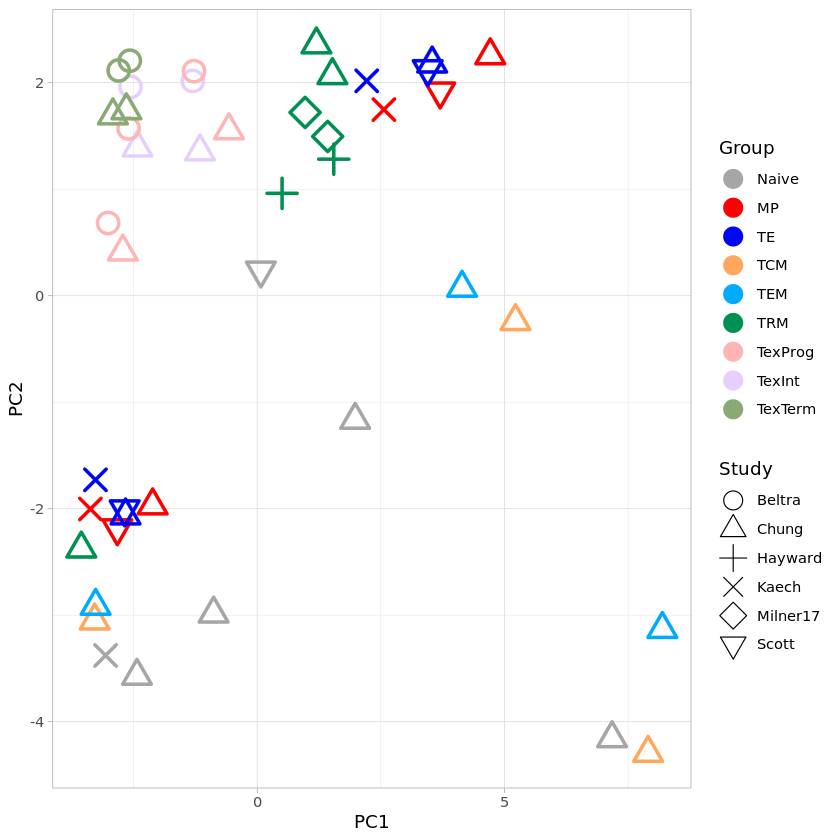

In [15]:
## PCA of normalized PageRank scores without batch-effect correction
mydata <- pr %>% scaleData %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% data.frame %>% mutate(Samples = rownames(.)) %>% 
    mutate(Group = factor(gsub("\\d","",gsub("_.*", "", Samples)), levels = c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm"))) %>% 
    mutate(Study = factor(info_pr[match(rownames(.), rownames(info_pr)),"study"]))

myPlot <- ggplot(mydata, aes(x = PC1, y = PC2, colour = Group, shape=Study, stroke=1.5)) + geom_point(size = 5) + scale_color_manual(values = label.color) + 
        theme_light() + scale_shape(solid = FALSE) + scale_shape_manual(values = 1:nlevels(mydata$Study))
myPlot
pdf("PCA_pr_norm.pdf", width = 8, height = 5)
print(myPlot)
dev.off()

In [21]:
source(paste0(maindir,"scripts/function/mostVariableTFs.R"))

Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.



png 
  2

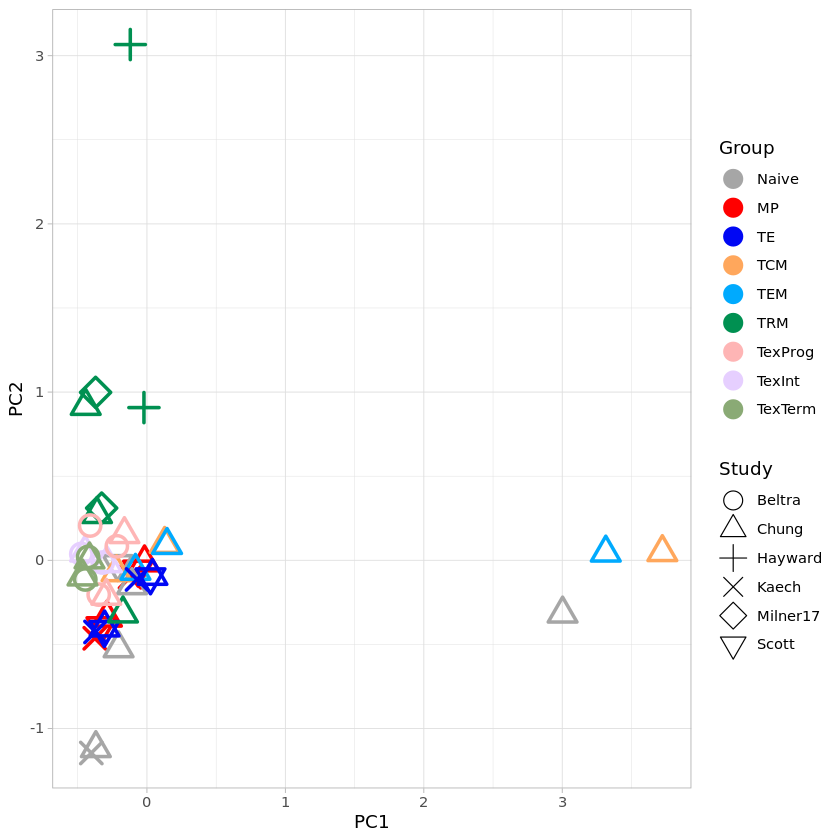

In [22]:
## PCA of normalized PageRank scores of 200 most variable TFs without batch-effect correction
mydata <- pr %>% mostVariableTFs %>% scaleData %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% data.frame %>% mutate(Samples = rownames(.)) %>% 
    mutate(Group = factor(gsub("\\d","",gsub("_.*", "", Samples)), levels = c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm"))) %>% 
    mutate(Study = factor(info_pr[match(rownames(.), rownames(info_pr)),"study"]))

myPlot <- ggplot(mydata, aes(x = PC1, y = PC2, colour = Group, shape=Study, stroke=1.5)) + geom_point(size = 5) + scale_color_manual(values = label.color) + 
        theme_light() + scale_shape(solid = FALSE) + scale_shape_manual(values = 1:nlevels(mydata$Study))
myPlot
pdf("PCA_pr_norm_cv_1.pdf", width = 8, height = 5)
print(myPlot)
dev.off()

Scale for 'shape' is already present. Adding another scale for 'shape', which
will replace the existing scale.



png 
  2

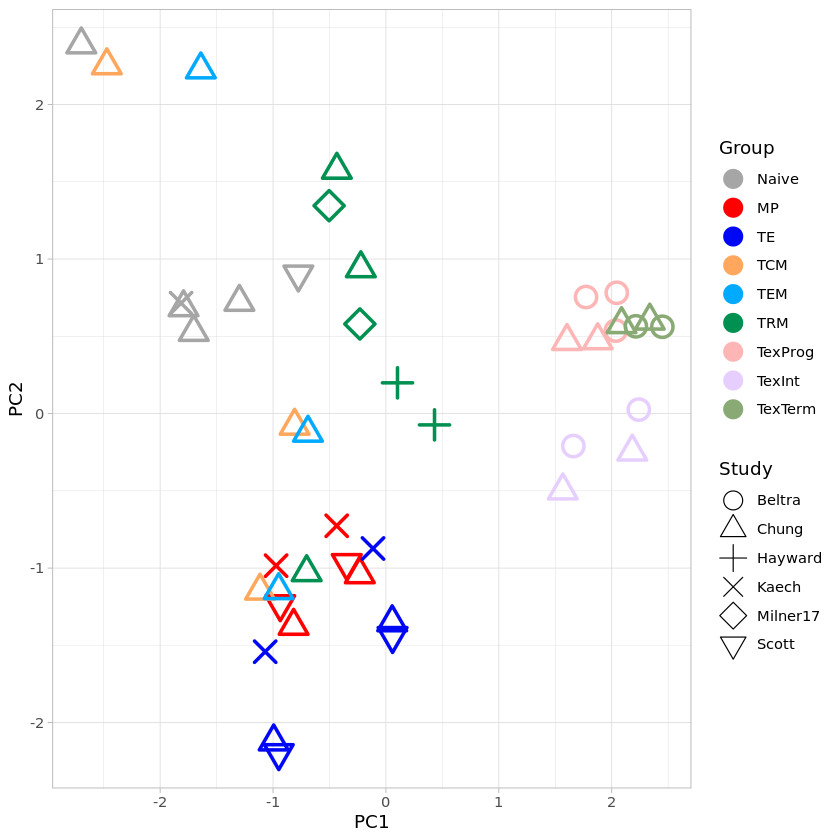

In [31]:
## PCA of normalized PageRank scores of cell state-specific TFs without batch-effect correction
TF <- readLines("heatmap/specificTFs_9cellStates_union.txt")
mydata <- pr[toupper(TF),] %>% scaleData %>%
    as.matrix %>% t %>% prcomp %>% .$x %>% data.frame %>% mutate(Samples = rownames(.)) %>% 
    mutate(Group = factor(gsub("\\d","",gsub("_.*", "", Samples)), levels = c("Naive","MP","TE","TCM","TEM","TRM","TexProg","TexInt","TexTerm"))) %>% 
    mutate(Study = factor(info_pr[match(rownames(.), rownames(info_pr)),"study"]))

myPlot <- ggplot(mydata, aes(x = PC1, y = PC2, colour = Group, shape=Study, stroke=1.5)) + geom_point(size = 5) + scale_color_manual(values = label.color) + 
        theme_light() + scale_shape(solid = FALSE) + scale_shape_manual(values = 1:nlevels(mydata$Study))
myPlot
pdf("heatmap/PCA_pr_norm_specificTFs.pdf", width = 5, height = 5)
print(myPlot)
dev.off()

# binding affinity analysis

edges_binding.csv has the information of the binding affinity, which is the output from FIMO, represented by the p-value of the motif binding score, rescaled to [0,1] by a sigmoid function.

In [181]:
library(dplyr)

In [3]:
samples <- c('TexTerm_Beltra','TexTerm_Beltra_Chung','TexTerm_Hudson','TexTerm_Hudson_Beltra','TRM_IEL_1','TRM_IEL_2','TRM_IEL_3','TRM_IEL_4','TRM_liver')
tfs <- c('HIC1','PRDM1','ETV5','GFI1')
genes <- c('JUNB','MYC','TNFSF11','RBPJ','NR4A3','NR4A2','EGR2','ANXA2','ATP8B4','EGR3','BACH2')

In [182]:
# new regulatee list from Kay (2024.04.15)
genes <- c("PHLDA1","CREB3L2","SERPINB1A","KIF11","MYC","JUNB","RBPJ","NR4A3","IRF4","CD86","EGR2")

In [183]:
df <- do.call('rbind',lapply(samples, function(x) {read.csv(paste0('/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/Network/',x,'/edges_binding.csv')) %>% filter(X.END_ID %in% genes) %>% mutate(sample=x)}))

In [185]:
# write.csv(df, '../../Network/edges_binding_subset_v2.csv', quote=F, row.names=F)
# write.csv(df, '../../Network/edges_binding_subset_v3.csv', quote=F, row.names=F)
write.csv(df, '../../../Network/edges_binding_subset_v4.csv', quote=F, row.names=F)


In [10]:
df

X.START_ID,X.END_ID,chr,start.int,end.int,annotation,affinity,X.TYPE,sample
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>,<chr>
JUND,RBPJ,chr5,53588969,53588979,promoter,0.6410928,BIND,TexTerm_Beltra
FOSL2,RBPJ,chr5,53588969,53588980,promoter,0.7148426,BIND,TexTerm_Beltra
FOS,RBPJ,chr5,53588969,53588981,promoter,0.6625708,BIND,TexTerm_Beltra
FOSL1,RBPJ,chr5,53588969,53588981,promoter,0.6774954,BIND,TexTerm_Beltra
FOSL2,RBPJ,chr5,53588969,53588981,promoter,0.5865151,BIND,TexTerm_Beltra
FOSB,RBPJ,chr5,53588970,53588979,promoter,0.6410928,BIND,TexTerm_Beltra
JUNB,RBPJ,chr5,53588970,53588979,promoter,0.7273239,BIND,TexTerm_Beltra
ATF3,RBPJ,chr5,53588970,53588979,promoter,0.7273239,BIND,TexTerm_Beltra
BATF,RBPJ,chr5,53588970,53588980,promoter,0.6099180,BIND,TexTerm_Beltra


In [18]:
df <- do.call('rbind',lapply(samples, function(x) {read.csv(paste0('/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/Network/',x,'/edges_binding.csv')) %>% filter((X.START_ID == 'HIC1' & X.END_ID %in% c('JUNB','MYC','TNFSF11','RBPJ'))|(X.START_ID == 'PRDM1' & X.END_ID %in% c('NR4A3','NR4A2','EGR2'))|(X.START_ID == 'ETV5' & X.END_ID %in% c('ANXA2','ATP8B4'))|(X.START_ID == 'GFI1' & X.END_ID %in% c('EGR3','BACH2'))) %>% mutate(sample=x)}))

In [25]:
write.csv(df, '../../Network/edges_binding_subset.csv', quote=F, row.names=F)

There're different levels of the mean of motif affinity:
1. just combine all the entries, regardless of the sample, annotation, and the location

In [43]:
df %>% filter(grepl('TRM',sample) & X.END_ID =='NR4A3') %>% pull(X.START_ID) %>% unique() %>% writeLines('../../regulators_of_Nr4a3_in_trm.txt')


In [51]:
df <- read.csv('~/Taiji/mouse_immune/mouse11_allcombn/output/Network/edges_binding_subset.csv')
head(df)
dim(df)

,X.START_ID,X.END_ID,chr,start.int,end.int,annotation,affinity,X.TYPE,sample
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>,<chr>
1,PRDM1,EGR2,chr10,67537300,67537314,promoter,0.6123724,BIND,TexTerm_Beltra
2,PRDM1,EGR2,chr10,67537324,67537338,promoter,0.6123724,BIND,TexTerm_Beltra
3,PRDM1,EGR2,chr10,67497358,67497372,enhancer,0.7021396,BIND,TexTerm_Beltra
4,PRDM1,EGR2,chr10,67497364,67497378,enhancer,0.7733046,BIND,TexTerm_Beltra
5,PRDM1,EGR2,chr10,67503746,67503760,enhancer,0.7563068,BIND,TexTerm_Beltra
6,HIC1,TNFSF11,chr14,78436142,78436151,enhancer,0.6545474,BIND,TexTerm_Beltra


[1] 127   9

In [23]:
# df %>% filter(annotation=='promoter') %>% arrange(X.START_ID, X.END_ID)
# df %>% filter(X.START_ID=='PRDM1' & X.END_ID=='EGR2')
# df %>% filter(X.START_ID=='PRDM1' & X.END_ID=='NR4A3')
# df %>% filter(annotation=='promoter' & X.END_ID =='JUNB')
# df %>% filter(X.START_ID%in%c('HIC1','PRDM1','FOXD2') & X.END_ID =='JUNB')
# df %>% filter(X.START_ID%in%c('PRDM1','ARID3A','PRDM4','ZFP324','IRF8','ZSCAN20') & X.END_ID =='NR4A3')
df %>% filter(X.START_ID%in%c('PRDM1','HIC1') & X.END_ID=='MYC')
# df %>% filter(X.END_ID=='MYC')

# df %>% filter(X.START_ID=='HIC1' & X.END_ID %in% c('JUNB','MYC','TNFSF11'))
# df %>% filter(X.START_ID=='HIC1' & X.END_ID =='JUNB')
# df %>% filter(X.START_ID=='HIC1' & X.END_ID =='MYC')
# df %>% filter(X.START_ID=='HIC1' & X.END_ID =='TNFSF11')

X.START_ID,X.END_ID,chr,start.int,end.int,annotation,affinity,X.TYPE,sample
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>,<chr>
PRDM1,MYC,chr15,61985092,61985106,promoter,0.7974960,BIND,TexTerm_Beltra
PRDM1,MYC,chr15,61985116,61985130,promoter,0.6363960,BIND,TexTerm_Beltra
PRDM1,MYC,chr15,61987115,61987129,promoter,0.6210937,BIND,TexTerm_Beltra
HIC1,MYC,chr15,61415816,61415834,enhancer,0.7166237,BIND,TexTerm_Beltra
HIC1,MYC,chr15,61415817,61415835,enhancer,0.7490908,BIND,TexTerm_Beltra
PRDM1,MYC,chr15,61539112,61539126,enhancer,0.8508819,BIND,TexTerm_Beltra
PRDM1,MYC,chr15,61548703,61548717,enhancer,0.7739444,BIND,TexTerm_Beltra
PRDM1,MYC,chr15,61985092,61985106,promoter,0.7973900,BIND,TexTerm_Beltra_Chung
PRDM1,MYC,chr15,61985116,61985130,promoter,0.6363115,BIND,TexTerm_Beltra_Chung


## choose good examples

The example should meet below criteria:

1. Differential RNA expression TRM > TEXterm. 
2. Have good examples of differential TF binding partners. Cross check edges binding subset v3  partner Binding partner candidates are from Cong’s differential TF partner of each TF. For example:
        In TEXterm, Hic1 combinatorially regulates Phlda1 with CTCF/Elf2/Ets2/ 
        In TRM, Hic1 combinatorially regulates Phlda1 with CTCF/Elf2/Snai1/Tcf3/

3. Have a good and reliable peaks in IGV. 

In [20]:
# seven genes passed the first criteria
genes <- c('RBPJ','IRF4','NR4A3','KIF11','MYC','SERPINB1A','JUNB')

In [42]:
# differential partners
tex_specific_prdm1 <- c('ETS2','IRF9','ZFP324','SMAD4')
trm_specific_prdm1 <- c('TCF7')
tex_specific_hic1 <- c('ETS2','ZFP324','RFX7','PRDM4','SMAD4','PRDM16','ZFP768')
trm_specific_hic1 <- c('ZFP692','SNAI1','GLIS3','PHOX2B')
tex_specific <- union(tex_specific_hic1, tex_specific_prdm1)
trm_specific <- union(trm_specific_hic1, trm_specific_prdm1)
tf_specific <- union(tex_specific, trm_specific)


In [78]:
# id = 'RBPJ'
# id = 'IRF4'
# id = 'NR4A3'
# id = 'SERPINB1A'
# id = 'KIF11'
# id = 'MYC'
id = 'JUNB'

In [84]:
length(l1)

[1] 224

In [79]:
l1 = df %>% filter(grepl('TRM',sample)& X.END_ID==id) %>% pull(X.START_ID) %>% unique()
l2 = df %>% filter(grepl('TexTerm',sample)& X.END_ID==id) %>% pull(X.START_ID) %>% unique()
# trm_s = setdiff(l1,l2)
# tex_s = setdiff(l2,l1)
# candidate_regualators = union(intersect(trm_specific, trm_s), intersect(tex_specific, tex_s))
l3 = union(l1,l2)
candidate_regualators = union(intersect(tf_specific, l3), c('PRDM1','HIC1'))

candidate_regualators

[1] "ETS2"   "SMAD4"  "ZFP768" "IRF9"   "ZFP692" "PRDM1"  "HIC1"

In [80]:
df %>% filter(X.START_ID%in%candidate_regualators & X.END_ID==id) %>% mutate(label=paste0(X.START_ID,'-',X.END_ID,'-',gsub('_.*','',sample))) %>% select(chr, start.int, end.int, label) %>% distinct() %>% write.table(paste0(id,'.bed'), sep = '\t', row.names = F, quote=F)
df %>% filter(X.START_ID%in%candidate_regualators & X.END_ID==id) %>% mutate(label=paste0(X.START_ID,'-',X.END_ID,'-',gsub('_.*','',sample))) %>% arrange(chr, start.int, end.int) %>% write.table(paste0(id,'.tsv'), sep = '\t', row.names = F, quote=F)


In [88]:
df2 <- df %>% mutate(sample.group=ifelse(grepl('TRM',sample),'TRM','TexTerm')) %>% group_by(X.START_ID,X.END_ID,sample.group) %>% summarise(mean_affinity=mean(affinity))
df2

`summarise()` has grouped output by 'X.START_ID', 'X.END_ID'. You can override
using the `.groups` argument.


X.START_ID,X.END_ID,sample.group,mean_affinity
<chr>,<chr>,<chr>,<dbl>
A1JVI6_MOUSE,CREB3L2,TexTerm,0.4193515
AC168977.1,CREB3L2,TexTerm,0.4747600
AC168977.1,CREB3L2,TRM,0.5848077
AC168977.1,MYC,TRM,0.5330239
AC168977.1,PHLDA1,TexTerm,0.5840735
AC168977.1,PHLDA1,TRM,0.5474407
AC168977.1,RBPJ,TRM,0.5597087
AC168977.1,SERPINB1A,TRM,0.6509087
AHCTF1,CREB3L2,TexTerm,0.7949643


In [1]:
df2 |> filter(X.END_ID %in% c('NR4A3','JUNB','RBPJ'))

ERROR: Error in df2 %>% filter(X.END_ID %in% c("NR4A3", "JUNB", "RBPJ")): could not find function "%>%"


In [103]:
df %>% filter(X.START_ID == 'ZSCAN20' & X.END_ID == 'NR4A3')

X.START_ID,X.END_ID,chr,start.int,end.int,annotation,affinity,X.TYPE,sample
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>,<chr>
ZSCAN20,NR4A3,chr4,48087700,48087708,enhancer,0.6128823,BIND,TexTerm_Beltra
ZSCAN20,NR4A3,chr4,48087700,48087708,enhancer,0.6128823,BIND,TexTerm_Hudson_Beltra
ZSCAN20,NR4A3,chr4,48087700,48087708,enhancer,0.6126637,BIND,TRM_IEL_1
ZSCAN20,NR4A3,chr4,48087700,48087708,enhancer,0.6126637,BIND,TRM_IEL_3
ZSCAN20,NR4A3,chr4,48087700,48087708,enhancer,0.6160328,BIND,TRM_liver


In [86]:
source("../scripts/function/utils.R")

In [94]:
# dfp <- df2 %>% ungroup() %>% mutate(pair=paste0(firstUp(X.START_ID),'-',firstUp(X.END_ID))) %>% dplyr::select(sample.group, mean_affinity, pair)%>% tidyr::pivot_wider(names_from = sample.group, values_from = mean_affinity) %>% tibble::column_to_rownames('pair')
dfp <- df2 %>% filter(X.END_ID %in% c('NR4A3','JUNB','RBPJ')) %>% ungroup() %>% mutate(pair=paste0(firstUp(X.START_ID),'-',firstUp(X.END_ID))) %>% dplyr::select(sample.group, mean_affinity, pair)%>% tidyr::pivot_wider(names_from = sample.group, values_from = mean_affinity) %>% tibble::column_to_rownames('pair')

In [99]:
# dfp['Zscan20-Nr4a3',]
dfp

,TRM,TexTerm
,<dbl>,<dbl>
Ac168977.1-Rbpj,0.5597087,NA
Ahctf1-Rbpj,0.4812715,NA
Alx1-Rbpj,0.6159818,0.4595125
Arid2-Rbpj,0.6570211,0.5373896
Arid3a-Nr4a3,0.6241002,NA
Arid3a-Rbpj,0.6561839,NA
Arid3b-Rbpj,NA,0.5150237
Arid5a-Rbpj,0.5904239,0.6418723
Arid5b-Junb,0.5759435,NA


In [112]:
# write.table(dfp, "mean_motif_affinity_across_bs.tsv", sep = '\t', quote=F)
write.table(dfp, "../network_analysis/compare/mean_motif_affinity_across_bs_NR4A3_JUNB_RBPJ.tsv", sep = '\t', quote=F)


In [ ]:
dfp %>% filter()

In [28]:
# visualize the values
library(ggplot2)
library(pheatmap)

In [75]:
# pheatmap(dfp, cluster_rows = F, cluster_cols = F, color = colorRampPalette(c('white','white','purple'))(20))
# pheatmap(dfp, fontsize = 20, cellwidth = 20, cellheight = 20, cluster_rows = F, cluster_cols = F, filename = '../../Network/hp_edges_binding_subset.pdf')
pheatmap(dfp, fontsize = 20, cellwidth = 20, cellheight = 20, cluster_rows = F, cluster_cols = F, color = colorRampPalette(c('white','purple'))(100),
         filename = '../../Network/hp_edges_binding_subset_v2.pdf')


# edge weight extraction

In [105]:
samples <- c('TexTerm_Beltra','TexTerm_Beltra_Chung','TexTerm_Hudson','TexTerm_Hudson_Beltra','TRM_IEL_1','TRM_IEL_2','TRM_IEL_3','TRM_IEL_4','TRM_liver')
genes <- c("PHLDA1","CREB3L2","SERPINB1A","KIF11","MYC","JUNB","RBPJ","NR4A3","IRF4","CD86","EGR2")

In [106]:
df <- do.call('rbind',lapply(samples, function(x) {read.csv(paste0('/new-stg/home/cong/Taiji/mouse_immune/mouse11_allcombn/output/Network/',x,'/edges_combined.csv')) %>% filter(X.END_ID %in% genes) %>% mutate(sample=x)}))

In [109]:
df %>% filter(X.END_ID %in% c('RBPJ','NR4A3', 'JUNB')) %>% select(X.START_ID,X.END_ID,weight,sample) %>% write.table("edge_weight_NR4A3_JUNB_RBPJ.tsv", sep = '\t', quote=F)

In [111]:
# mean edge weight
df %>% c%>% select(X.START_ID,X.END_ID,weight,sample) %>% group_by(X.START_ID, X.END_ID) %>% summarise(mean_edge_weight=mean(weight)) %>% write.table("../network_analysis/compare/mean_edge_weight_NR4A3_JUNB_RBPJ.tsv", sep = '\t', quote=F)

`summarise()` has grouped output by 'X.START_ID'. You can override using the
`.groups` argument.


# edge weight per locus calculation

edge weight is determined by the product of TF expresion, peak intensity and motif binding affinity

In [1]:
library(dplyr)
# library(plyranges)
setwd("~/Taiji/mouse_immune/mouse11_allcombn/output/ATACSeq/BigWig_norm/batch_corrected/")


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [186]:
# read locus info
genes <- c('RBPJ','NR4A3', 'JUNB')
genes <- c('RBPJ','IRF4','CD86','NR4A3','EGR2','KIF11','MYC','JUNB','PHLDA1','CREB3L2','SERPINB1A')
df <- read.csv('~/Taiji/mouse_immune/mouse11_allcombn/output/Network/edges_binding_subset_v4.csv') |> filter(X.END_ID %in% genes) |> select(-X.TYPE)

# change sample name
mapping_df <- read.table("~/Taiji/mouse_immune/mouse11_allcombn/output/post-analysis/group_file.txt", sep=' ') %>% tibble::rownames_to_column("oldName") |> select(oldName,newName)
df <- df |> left_join(mapping_df, by = c("sample"="oldName")) |> select(-sample)
names(df)[8] <- 'sample'
head(df)
dim(df)

tfs <- unique(df$X.START_ID)
length(tfs)

,X.START_ID,X.END_ID,chr,start.int,end.int,annotation,affinity,sample
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>
1,MSANTD3,EGR2,chr10,67537280,67537290,promoter,0.5958188,TexTerm_Beltra_Beltra
2,GCM2,EGR2,chr10,67537283,67537293,promoter,0.5974948,TexTerm_Beltra_Beltra
3,ZFP287,EGR2,chr10,67537284,67537317,promoter,0.7469940,TexTerm_Beltra_Beltra
4,ZFP287,EGR2,chr10,67537285,67537318,promoter,0.7028513,TexTerm_Beltra_Beltra
5,ZFP287,EGR2,chr10,67537286,67537319,promoter,0.6862944,TexTerm_Beltra_Beltra
6,ZFP287,EGR2,chr10,67537287,67537320,promoter,0.8910668,TexTerm_Beltra_Beltra


[1] 53430     8

[1] 849

In [187]:
unique(df$X.END_ID)

[1] "EGR2"      "RBPJ"      "JUNB"      "CREB3L2"   "KIF11"     "IRF4"     
 [7] "NR4A3"     "SERPINB1A" "MYC"       "PHLDA1"    "CD86"

In [188]:
# prepare for overlap
df2 <- df |> select(chr, start.int, end.int) %>% distinct()
names(df2)[1:3] <- c("chrom","start","end")

In [189]:
dim(df2)
head(df2)

[1] 12189     3

,chrom,start,end
,<chr>,<int>,<int>
1,chr10,67537280,67537290
2,chr10,67537283,67537293
3,chr10,67537284,67537317
4,chr10,67537285,67537318
5,chr10,67537286,67537319
6,chr10,67537287,67537320


In [190]:
# read expression value
rna <- read.csv("~/Taiji/mouse_immune/mouse11_allcombn/output/post-analysis/rna_all.csv", header = T, row.names = 1) 
rownames(rna) <- toupper(rownames(rna))
rna <- rna[,grepl('TRM|TexTerm', names(rna))] %>% tibble::rownames_to_column('gene') |> tidyr::pivot_longer(cols=!gene, names_to = 'sample', values_to = 'rna_expr')

In [191]:
dim(rna)
head(rna)

[1] 246528      3

gene,sample,rna_expr
<chr>,<chr>,<dbl>
UBL5,TRM.IEL_Milner17_Milner17,440.35
UBL5,TRM.IEL_MilnerApr_Chung,512.67
UBL5,TRM.IEL_MilnerApr_Milner17,512.67
UBL5,TRM.IEL_Milner17_Chung,440.35
UBL5,TRM.liver_Mackay_Chung,432.96
UBL5,TexTerm_Beltra_Beltra,411.92


In [192]:
bw_files = list.files(pattern = '^(TexTerm|TRM_liver|TRM_IEL).*bw')
bw_files

[1] "TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.bw"
 [2] "TexTerm_Beltra_ATAC_rep2.TMM.batchCorrected.bw"
 [3] "TexTerm_Beltra_ATAC_rep3.TMM.batchCorrected.bw"
 [4] "TexTerm_Hudson_ATAC_rep1.TMM.batchCorrected.bw"
 [5] "TexTerm_Hudson_ATAC_rep2.TMM.batchCorrected.bw"
 [6] "TRM_IEL_1_ATAC_rep1.TMM.batchCorrected.bw"     
 [7] "TRM_IEL_1_ATAC_rep2.TMM.batchCorrected.bw"     
 [8] "TRM_IEL_2_ATAC_rep1.TMM.batchCorrected.bw"     
 [9] "TRM_liver_ATAC_rep1.TMM.batchCorrected.bw"     
[10] "TRM_liver_ATAC_rep2.TMM.batchCorrected.bw"

In [54]:
gr <- read_bigwig("TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.bw") 
gr

chrom,start,end,score,strand
<chr>,<int>,<int>,<dbl>,<chr>
chr10,0,3101400,0.0000,+
chr10,3101400,3101480,4.1415,+
chr10,3101480,3101540,0.0000,+
chr10,3101540,3101630,4.1415,+
chr10,3101630,3102320,0.0000,+
chr10,3102320,3102360,4.1415,+
chr10,3102360,3102400,8.2830,+
chr10,3102400,3102440,4.1415,+
chr10,3102440,3104780,0.0000,+


In [11]:
# library(tidyverse)
library(valr)


Attaching package: ‘valr’


The following objects are masked from ‘package:plyranges’:

    read_bed, read_bigwig


The following object is masked from ‘package:GenomicRanges’:

    values


The following object is masked from ‘package:S4Vectors’:

    values




In [57]:
tail(gr1)

,chrom,start,end,score
,<chr>,<int>,<int>,<dbl>
14951142,chrY,90828740,90828750,4.1415
14951143,chrY,90828750,91744698,0.0000
14951144,chrY_JH584300_random,0,182347,0.0000
14951145,chrY_JH584301_random,0,259875,0.0000
14951146,chrY_JH584302_random,0,155838,0.0000
14951147,chrY_JH584303_random,0,158099,0.0000


In [14]:
# get intersect e.g overlap  
df_peak <- valr::bed_intersect(df2,gr1, suffix = c("_locus", "_score"))

Warning message:
“Factors are not allowed for grouping. chrom will be treated as characters”


In [65]:
df_peak_s <- df_peak |> filter(.overlap>=0.5*(end_locus-start_locus)) |> select(chrom, start_locus, end_locus, score_score) |> group_by(chrom, start_locus, end_locus) %>% summarize(mean_score = mean(score_score))
dim(df_peak_s)
tail(df_peak_s)

`summarise()` has grouped output by 'chrom', 'start_locus'. You can override
using the `.groups` argument.


[1] 3487    4

chrom,start_locus,end_locus,mean_score
<chr>,<int>,<int>,<dbl>
chr8,85013421,85013429,8.283
chr8,85013455,85013477,8.283
chr8,85013460,85013479,8.283
chr8,85013462,85013480,0.000
chr8,85013465,85013480,0.000
chr8,85013466,85013480,0.000


In [126]:
# combine with original locus info
head(df)

,X.START_ID,X.END_ID,chr,start.int,end.int,annotation,affinity,sample
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>
1,JUND,RBPJ,chr5,53588969,53588979,promoter,0.6410928,TexTerm_Beltra
2,FOSL2,RBPJ,chr5,53588969,53588980,promoter,0.7148426,TexTerm_Beltra
3,FOS,RBPJ,chr5,53588969,53588981,promoter,0.6625708,TexTerm_Beltra
4,FOSL1,RBPJ,chr5,53588969,53588981,promoter,0.6774954,TexTerm_Beltra
5,FOSL2,RBPJ,chr5,53588969,53588981,promoter,0.5865151,TexTerm_Beltra
6,FOSB,RBPJ,chr5,53588970,53588979,promoter,0.6410928,TexTerm_Beltra


In [ ]:
head(rna)
dim

In [36]:
dff <- df |> left_join(df_peak_s, by = join_by(chr==chrom, start.int==start_locus, end.int==end_locus)) |> 
    left_join(rna, by = join_by(sample, X.START_ID==gene)) |> mutate(edge.weight = sqrt(affinity*score_score*rna_expr))
head(dff)
dim(dff)

,X.START_ID,X.END_ID,chr,start.int,end.int,annotation,affinity,sample,score_score,rna_expr,edge.weight
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>
1,JUND,RBPJ,chr5,53588969,53588979,promoter,0.6410928,TexTerm_Beltra_Beltra,37.2735,154.42,60.745248
2,FOSL2,RBPJ,chr5,53588969,53588980,promoter,0.7148426,TexTerm_Beltra_Beltra,37.2735,1.47,6.258409
3,FOS,RBPJ,chr5,53588969,53588981,promoter,0.6625708,TexTerm_Beltra_Beltra,37.2735,114.83,53.252977
4,FOSL1,RBPJ,chr5,53588969,53588981,promoter,0.6774954,TexTerm_Beltra_Beltra,37.2735,0.00,0.000000
5,FOSL2,RBPJ,chr5,53588969,53588981,promoter,0.5865151,TexTerm_Beltra_Beltra,37.2735,1.47,5.668894
6,FOSB,RBPJ,chr5,53588970,53588979,promoter,0.6410928,TexTerm_Beltra_Beltra,37.2735,0.67,4.001271


[1] 16945    11

In [201]:
get_ew <- function(file,df,df2,rna){
    # df is the total locus dataframe
    # df2 is the unique set of chromatin regions
    gr <- read_bigwig(file) 
#     gr1 <- as.data.frame(gr) %>% dplyr::select(chrom, start, end, score)
    gr1 <- as.data.frame(gr) %>% dplyr::select(seqnames, start, end, score)
    names(gr1)[1] <- "chrom"

    df_peak <- valr::bed_intersect(df2,gr1, suffix = c("_locus", "_score"))
    df_peak_s <- df_peak |> filter(.overlap>=0.5*(end_locus-start_locus)) |> 
            select(chrom, start_locus, end_locus, score_score) |> group_by(chrom, start_locus, end_locus) %>% summarize(mean_score = mean(score_score))
    dff <- df |> left_join(df_peak_s, by = join_by(chr==chrom, start.int==start_locus, end.int==end_locus)) |> 
        left_join(rna, by = join_by(sample, X.START_ID==gene)) |> mutate(edge.weight = sqrt(affinity*mean_score*rna_expr))
    write.csv(dff, paste0('edge_weight_per_locus_',sub('bw','csv',file)), row.names=F, quote=F)
}

In [199]:
file <- bw_files[2]
file
gr <- read_bigwig(file) 
gr1 <- as.data.frame(gr) %>% dplyr::select(seqnames, start, end, score)
names(gr1)[1] <- "chrom"
head(gr1)

[1] "TexTerm_Beltra_ATAC_rep2.TMM.batchCorrected.bw"

,chrom,start,end,score
,<fct>,<int>,<int>,<dbl>
1,chr10,1,3103670,0.00000
2,chr10,3103671,3103720,5.47851
3,chr10,3103721,3103750,10.95700
4,chr10,3103751,3103800,5.47851
5,chr10,3103801,3107360,0.00000
6,chr10,3107361,3107440,5.47851


In [1]:
# tmp <- lapply(bw_files, function(x) get_ew(file = x, df = df, df2 = df2, rna=rna))

In [12]:
# get average file
fs <- list.files(pattern = 'edge_weight_per_locus_T.*csv')
fs

[1] "edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv"
 [2] "edge_weight_per_locus_TexTerm_Beltra_ATAC_rep2.TMM.batchCorrected.csv"
 [3] "edge_weight_per_locus_TexTerm_Beltra_ATAC_rep3.TMM.batchCorrected.csv"
 [4] "edge_weight_per_locus_TexTerm_Hudson_ATAC_rep1.TMM.batchCorrected.csv"
 [5] "edge_weight_per_locus_TexTerm_Hudson_ATAC_rep2.TMM.batchCorrected.csv"
 [6] "edge_weight_per_locus_TRM_IEL_1_ATAC_rep1.TMM.batchCorrected.csv"     
 [7] "edge_weight_per_locus_TRM_IEL_1_ATAC_rep2.TMM.batchCorrected.csv"     
 [8] "edge_weight_per_locus_TRM_IEL_2_ATAC_rep1.TMM.batchCorrected.csv"     
 [9] "edge_weight_per_locus_TRM_liver_ATAC_rep1.TMM.batchCorrected.csv"     
[10] "edge_weight_per_locus_TRM_liver_ATAC_rep2.TMM.batchCorrected.csv"

In [18]:
strsplit(fs[8],'_')[[1]][5]

[1] "TRM"

In [27]:
x <- fs[1]
tmp <- na.omit(read.csv(x)) |> mutate(file=x,group=strsplit(x,'_')[[1]][5]) |> filter(grepl(strsplit(x,'_')[[1]][5],sample)) 
head(tmp)
dim(tmp)
tail(tmp)

,X.START_ID,X.END_ID,chr,start.int,end.int,annotation,affinity,sample,mean_score,rna_expr,edge.weight,file,group
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,MSANTD3,EGR2,chr10,67537280,67537290,promoter,0.5958188,TexTerm_Beltra_Beltra,41.4150,0.00,0.00000,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm
2,GCM2,EGR2,chr10,67537283,67537293,promoter,0.5974948,TexTerm_Beltra_Beltra,41.4150,0.00,0.00000,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm
3,ZFP287,EGR2,chr10,67537284,67537317,promoter,0.7469940,TexTerm_Beltra_Beltra,37.2735,37.39,32.26535,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm
4,ZFP287,EGR2,chr10,67537285,67537318,promoter,0.7028513,TexTerm_Beltra_Beltra,37.2735,37.39,31.29749,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm
5,ZFP287,EGR2,chr10,67537286,67537319,promoter,0.6862944,TexTerm_Beltra_Beltra,37.2735,37.39,30.92666,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm
6,ZFP287,EGR2,chr10,67537287,67537320,promoter,0.8910668,TexTerm_Beltra_Beltra,37.2735,37.39,35.23976,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm


[1] 19518    13

,X.START_ID,X.END_ID,chr,start.int,end.int,annotation,affinity,sample,mean_score,rna_expr,edge.weight,file,group
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
19513,STAT4,CD86,chr16,36657167,36657177,enhancer,0.8405914,TexTerm_Hudson_Beltra,8.283,312.96,46.679985,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm
19514,STAT3,CD86,chr16,36657167,36657178,enhancer,0.6785924,TexTerm_Hudson_Beltra,8.283,343.36,43.931212,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm
19515,STAT5B,CD86,chr16,36657167,36657179,enhancer,0.7185027,TexTerm_Hudson_Beltra,8.283,95.27,23.811465,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm
19516,STAT4,CD86,chr16,36657167,36657179,enhancer,0.7363441,TexTerm_Hudson_Beltra,8.283,312.96,43.689658,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm
19517,BCL6,CD86,chr16,36657167,36657181,enhancer,0.5750697,TexTerm_Hudson_Beltra,8.283,4.13,4.435362,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm
19518,BCL6,CD86,chr16,36657167,36657182,enhancer,0.7264863,TexTerm_Hudson_Beltra,8.283,4.13,4.985200,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm


In [31]:
tmp <- do.call('rbind',lapply(fs[c(1,7)], function(x) {na.omit(read.csv(x)) |> mutate(file=x,group=strsplit(x,'_')[[1]][5]) |> filter(grepl(strsplit(x,'_')[[1]][5],sample))}))
head(tmp)
dim(tmp)

,X.START_ID,X.END_ID,chr,start.int,end.int,annotation,affinity,sample,mean_score,rna_expr,edge.weight,file,group
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,MSANTD3,EGR2,chr10,67537280,67537290,promoter,0.5958188,TexTerm_Beltra_Beltra,41.4150,0.00,0.00000,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm
2,GCM2,EGR2,chr10,67537283,67537293,promoter,0.5974948,TexTerm_Beltra_Beltra,41.4150,0.00,0.00000,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm
3,ZFP287,EGR2,chr10,67537284,67537317,promoter,0.7469940,TexTerm_Beltra_Beltra,37.2735,37.39,32.26535,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm
4,ZFP287,EGR2,chr10,67537285,67537318,promoter,0.7028513,TexTerm_Beltra_Beltra,37.2735,37.39,31.29749,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm
5,ZFP287,EGR2,chr10,67537286,67537319,promoter,0.6862944,TexTerm_Beltra_Beltra,37.2735,37.39,30.92666,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm
6,ZFP287,EGR2,chr10,67537287,67537320,promoter,0.8910668,TexTerm_Beltra_Beltra,37.2735,37.39,35.23976,edge_weight_per_locus_TexTerm_Beltra_ATAC_rep1.TMM.batchCorrected.csv,TexTerm


[1] 44171    13

In [32]:
output <- tmp |> group_by(X.START_ID, X.END_ID, chr, start.int, end.int, annotation, group) %>% summarize(mean_edge_weight=mean(edge.weight))
head(output)
dim(output)
# write.csv(output,"edge_weight_per_locus.csv",quote=F,row.names=F)

`summarise()` has grouped output by 'X.START_ID', 'X.END_ID', 'chr',
'start.int', 'end.int', 'annotation'. You can override using the `.groups`
argument.


X.START_ID,X.END_ID,chr,start.int,end.int,annotation,group,mean_edge_weight
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>
AHCTF1,CREB3L2,chr6,37340487,37340495,promoter,TexTerm,0.000000
AHCTF1,EGR2,chr10,67483513,67483521,enhancer,TRM,5.547718
AHCTF1,EGR2,chr10,67483513,67483521,enhancer,TexTerm,22.377120
AHCTF1,EGR2,chr10,67483527,67483535,enhancer,TRM,8.713602
AHCTF1,EGR2,chr10,67483527,67483535,enhancer,TexTerm,25.513842
AHCTF1,EGR2,chr10,67537293,67537301,promoter,TexTerm,20.188523


[1] 17822     8

In [26]:
# split the overall file to each regulatee
df <- read.csv('edge_weight_per_locus_all.csv')
head(df)
dim(df)

,X.START_ID,X.END_ID,chr,start.int,end.int,annotation,group,mean_edge_weight
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>
1,AHCTF1,CREB3L2,chr6,37340487,37340495,promoter,TexTerm,2.233115
2,AHCTF1,EGR2,chr10,67483513,67483521,enhancer,TRM,6.367393
3,AHCTF1,EGR2,chr10,67483513,67483521,enhancer,TexTerm,17.826605
4,AHCTF1,EGR2,chr10,67483527,67483535,enhancer,TRM,10.417074
5,AHCTF1,EGR2,chr10,67483527,67483535,enhancer,TexTerm,19.583951
6,AHCTF1,EGR2,chr10,67537293,67537301,promoter,TexTerm,19.770434


[1] 18691     8

In [39]:
df |> filter(X.END_ID == 'NR4A3' & start.int <= 47799385 & start.int >= 47799300)

X.START_ID,X.END_ID,chr,start.int,end.int,annotation,group,mean_edge_weight
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<dbl>
FOXJ1,NR4A3,chr4,47799381,47799393,enhancer,TRM,0.000000
FOXJ1,NR4A3,chr4,47799381,47799393,enhancer,TexTerm,0.000000
FOXO4,NR4A3,chr4,47799381,47799390,enhancer,TRM,6.499692
FOXO4,NR4A3,chr4,47799381,47799390,enhancer,TexTerm,3.344318
IRF1,NR4A3,chr4,47799339,47799359,enhancer,TRM,38.463514
IRF1,NR4A3,chr4,47799339,47799359,enhancer,TexTerm,200.014715
IRF2,NR4A3,chr4,47799339,47799359,enhancer,TRM,14.041188
IRF2,NR4A3,chr4,47799339,47799359,enhancer,TexTerm,80.989024
IRF2,NR4A3,chr4,47799346,47799356,enhancer,TRM,13.144635


In [30]:
df |> filter(group == 'TRM') |> write.csv(paste0('edge_weight_per_locus_all_TRM.csv'), row.names=F, quote=F)
df |> filter(group == 'TexTerm') |> write.csv(paste0('edge_weight_per_locus_all_TexTerm.csv'), row.names=F, quote=F)

In [42]:
lapply(unique(df$X.END_ID), function(x) df |> filter(X.END_ID == x & group == 'TRM') |> write.csv(paste0('edge_weight_per_locus_',x,'_TRM.csv'), row.names=F, quote=F))
lapply(unique(df$X.END_ID), function(x) df |> filter(X.END_ID == x & group == 'TexTerm') |> write.csv(paste0('edge_weight_per_locus_',x,'_TexTerm.csv'), row.names=F, quote=F))

[[1]]
NULL

[[2]]
NULL

[[3]]
NULL

[[4]]
NULL

[[5]]
NULL

[[6]]
NULL

[[7]]
NULL

[[8]]
NULL

[[9]]
NULL

[[10]]
NULL

[[11]]
NULL

[[1]]
NULL

[[2]]
NULL

[[3]]
NULL

[[4]]
NULL

[[5]]
NULL

[[6]]
NULL

[[7]]
NULL

[[8]]
NULL

[[9]]
NULL

[[10]]
NULL

[[11]]
NULL

In [12]:
# get bedgraph files
write.table_with_header <- function(x, file, header, ...){
  cat(header, '\n',  file = file)
  write.table(x, file, append = T, ...)
}


In [ ]:
ls <- list.files(pattern = 'edge_weight_per_locus.*[TRM|TexTerm].csv')
tmp <- lapply(ls, function(x) {read.csv(x) |> select(chr, start.int, end.int, mean_edge_weight) |> write.table(sub('csv','bedgraph.txt',x), sep = '\t', row.names = F, col.names = F, quote = F)})

[1] "edge_weight_per_locus_CD86_TexTerm.csv"     
 [2] "edge_weight_per_locus_CD86_TRM.csv"         
 [3] "edge_weight_per_locus_CREB3L2_TexTerm.csv"  
 [4] "edge_weight_per_locus_CREB3L2_TRM.csv"      
 [5] "edge_weight_per_locus_EGR2_TexTerm.csv"     
 [6] "edge_weight_per_locus_EGR2_TRM.csv"         
 [7] "edge_weight_per_locus_IRF4_TexTerm.csv"     
 [8] "edge_weight_per_locus_IRF4_TRM.csv"         
 [9] "edge_weight_per_locus_JUNB_TexTerm.csv"     
[10] "edge_weight_per_locus_JUNB_TRM.csv"         
[11] "edge_weight_per_locus_KIF11_TexTerm.csv"    
[12] "edge_weight_per_locus_KIF11_TRM.csv"        
[13] "edge_weight_per_locus_MYC_TexTerm.csv"      
[14] "edge_weight_per_locus_MYC_TRM.csv"          
[15] "edge_weight_per_locus_NR4A3_TexTerm.csv"    
[16] "edge_weight_per_locus_NR4A3_TRM.csv"        
[17] "edge_weight_per_locus_PHLDA1_TexTerm.csv"   
[18] "edge_weight_per_locus_PHLDA1_TRM.csv"       
[19] "edge_weight_per_locus_RBPJ_TexTerm.csv"     
[20] "edge_weight_per_locus_RBPJ_TRM.csv"         
[21] "edge_weight_per_locus_SERPINB1A_TexTerm.csv"
[22] "edge_weight_per_locus_SERPINB1A_TRM.csv"

In [31]:
ls <- list.files(pattern = 'edge_weight_per_locus.*TRM.csv')
ls
tmp <- lapply(ls, function(x) {read.csv(x) |> select(chr, start.int, end.int, mean_edge_weight) |> 
                               write.table_with_header(sub('csv','bedgraph.txt',x), 
                                                       header = paste0('track type=bedGraph name="TRM-EW-',sub('.*locus_','',sub('_TRM.*','',x)),'" description="TRM edge weight for ',sub('.*locus_','',sub('_TRM.*','',x)),'" visibility=full color=0,144,81'), 
                                                       sep = '\t', row.names = F, col.names = F, quote = F)})

[1] "edge_weight_per_locus_all_TRM.csv"      
 [2] "edge_weight_per_locus_CD86_TRM.csv"     
 [3] "edge_weight_per_locus_CREB3L2_TRM.csv"  
 [4] "edge_weight_per_locus_EGR2_TRM.csv"     
 [5] "edge_weight_per_locus_IRF4_TRM.csv"     
 [6] "edge_weight_per_locus_JUNB_TRM.csv"     
 [7] "edge_weight_per_locus_KIF11_TRM.csv"    
 [8] "edge_weight_per_locus_MYC_TRM.csv"      
 [9] "edge_weight_per_locus_NR4A3_TRM.csv"    
[10] "edge_weight_per_locus_PHLDA1_TRM.csv"   
[11] "edge_weight_per_locus_RBPJ_TRM.csv"     
[12] "edge_weight_per_locus_SERPINB1A_TRM.csv"

In [32]:
ls <- list.files(pattern = 'edge_weight_per_locus.*TexTerm.csv')
ls
tmp <- lapply(ls, function(x) {read.csv(x) |> select(chr, start.int, end.int, mean_edge_weight) |> 
                               write.table_with_header(sub('csv','bedgraph.txt',x), 
                                                       header = paste0('track type=bedGraph name="TexTerm-EW-',sub('.*locus_','',sub('_TexTerm.*','',x)),'" description="TexTerm edge weight for ',sub('.*locus_','',sub('_TexTerm.*','',x)),'" visibility=full color=127,96,0'), 
                                                       sep = '\t', row.names = F, col.names = F, quote = F)})

[1] "edge_weight_per_locus_all_TexTerm.csv"      
 [2] "edge_weight_per_locus_CD86_TexTerm.csv"     
 [3] "edge_weight_per_locus_CREB3L2_TexTerm.csv"  
 [4] "edge_weight_per_locus_EGR2_TexTerm.csv"     
 [5] "edge_weight_per_locus_IRF4_TexTerm.csv"     
 [6] "edge_weight_per_locus_JUNB_TexTerm.csv"     
 [7] "edge_weight_per_locus_KIF11_TexTerm.csv"    
 [8] "edge_weight_per_locus_MYC_TexTerm.csv"      
 [9] "edge_weight_per_locus_NR4A3_TexTerm.csv"    
[10] "edge_weight_per_locus_PHLDA1_TexTerm.csv"   
[11] "edge_weight_per_locus_RBPJ_TexTerm.csv"     
[12] "edge_weight_per_locus_SERPINB1A_TexTerm.csv"

# session info

In [17]:
sessionInfo()

R version 4.1.3 (2022-03-10)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Linux (unknown distro)

Matrix products: default
BLAS/LAPACK: /new-stg/home/cong/miniconda3/envs/r4-base/lib/libopenblasp-r0.3.20.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
[1] valr_0.8.0           plyranges_1.14.0     GenomicRanges_1.46.1
[4] GenomeInfoDb_1.30.1  IRanges_2.28.0       S4Vectors_0.32.4    
[7] BiocGenerics_0.40.0  dplyr_1.1.4         

loaded via a namespace (and not attached):
 [1] Rcpp_1.0.9                  lattice_0.22-6        